In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [19]:
import os
import pickle
import random
import time

import PIL
import numpy as np
import pandas as pd
import tensorflow as tf
from PIL import Image
from keras import Input, Model
from keras import backend as K
from tensorflow.keras.callbacks import TensorBoard
from keras.layers import Conv2D, ZeroPadding2D
from keras.layers import Add
from keras.layers import Dense, LeakyReLU, BatchNormalization, ReLU, Reshape, UpSampling2D, Conv2D, Activation, concatenate, Flatten, Lambda, Concatenate
from tensorflow.keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

Stage -1

Conditional Augmentation Network

In [2]:
# function to generate gaussian distribution
def generate_c(x):
  '''
  Input : fully connected dense layer x
  Output : sample from gaussian distribution
  '''
  mean = x[:,:128]
  log_sigma = x[:, 128:]
  stddev = K.exp(log_sigma)
  epsilon= K.random_normal(shape= K.constant((mean.shape[1], ), dtype='int32'))
  c = stddev * epsilon + mean
  return c

# build ca model
def build_ca_model():
  '''
  This function generates the conditional augmentation block of the stack gan model, it uses functional api to define the model. The input to the
  model is the 1024 dim embedding and the output of th model is a sample from the gaussian distribution generated in the previous function. Model contains
  one fully connected layer and LeakyReLU activation.
  '''
  #Input layer
  input_layer = Input(shape=(1024,))

  #Dense layer
  x = Dense(256)(input_layer)

  #activate Dense Layer
  mean_logsigma = LeakyReLU(alpha=0.2)(x)

  #use lambda layer to apply generate_c function to the layer
  c = Lambda(generate_c)(mean_logsigma)

  #define ca_model input and output
  ca_model = Model(inputs = [input_layer], outputs = [c])

  #return model
  return ca_model

def build_embedding_compressor_model():
    """
    Build embedding compressor model
    """
    input_layer = Input(shape=(1024,))
    x = Dense(128)(input_layer)
    x = ReLU()(x)

    model = Model(inputs=[input_layer], outputs=[x])
    return model


Sample bird captions after Word-embedding

In [3]:
with open('/content/drive/MyDrive/birds/example_captions.txt','r') as f:
    captions = f.readlines()

captions

['this bird has a bright yellow body, with brown on its crown and wings.\n',
 'this bird has a red breast and belly as well as a small bill.\n',
 'small, roundish bird with off white breast and belly, light brown crown, brown and black colored wings.\n',
 'A white bird with a black crown and yellow beak\n',
 'the bird has gray crown, belly and white abdomen, with black tarsus and feet\n',
 'a colorful bird with a bright yellow body, a black crown and throat, orange bill, and black primaries and secondaries.\n']

### **Stage 1 Generator Network**

In [4]:
def build_stage1_generator():
  '''
  Builds the stage1 generator model for stackgan
  '''



  #ca_block
  #input layer of pretrained word embeddings
  input_layer = Input(shape=(1024, ))
  #passing word embedding to fully connected layer to generate conditional augmentation
  x = Dense(256)(input_layer)
  #activating to get mean and log sigma
  mean_logsigma = LeakyReLU(alpha=0.2)(x)
  #generate c by applying the function defined above to mean_logsigma using the lambda layer
  c = Lambda(generate_c)(mean_logsigma)



  #generator block
  #input layer of random noise
  input_layer2 = Input(shape=(100, ))
  #generator input by concatanating random noise and conditional augmentation (c)
  gen_input = Concatenate(axis=1)([c, input_layer2])
  #pass into a FC Dense Layer
  x = Dense(128 * 8 * 4 * 4, use_bias = False)(gen_input)
  #activating FC dense layer
  x = ReLU()(x)
  #reshape FC dense layer from 2D tensor to 4D tensor
  x = Reshape((4, 4, 128*8), input_shape =(128 * 8 * 4 * 4,))(x)

  # create four 2D upsampling convolutional blocks
  # contains Upsamplig 2D, convolutional block (512, 256, 128, 64), batchnormalization, activation
  #block 1
  x = UpSampling2D(size=(2, 2))(x)
  x = Conv2D(512, kernel_size=3, padding="same", strides=1, use_bias=False)(x)
  x = BatchNormalization()(x)
  x = ReLU()(x)
  #block 2
  x = UpSampling2D(size = (2,2))(x)
  x = Conv2D(256, kernel_size =3, padding = 'same', strides =1, use_bias = False)(x)
  x = BatchNormalization()(x)
  x = ReLU()(x)
  #block 3
  x = UpSampling2D(size = (2,2))(x)
  x = Conv2D(128, kernel_size =3, padding = 'same', strides =1, use_bias = False)(x)
  x = BatchNormalization()(x)
  x = ReLU()(x)
  #block 4
  x = UpSampling2D(size = (2,2))(x)
  x = Conv2D(64, kernel_size =3, padding = 'same', strides =1, use_bias = False)(x)
  x = BatchNormalization()(x)
  x = ReLU()(x)
  #final layer
  #conv layer to generate low resolution image
  x = Conv2D(3, kernel_size = 3, padding = 'same', strides =1, use_bias = False)(x)
  x = Activation('tanh')(x)


  #stage 1 generator model
  stage1_gen = Model(inputs = [input_layer, input_layer2], outputs = [x , mean_logsigma])

  return stage1_gen

### Stage 1 **Discriminator**

In [5]:
def build_stage1_discriminator():
  '''
  Builds the stage1 discriminator model for stackgan
  '''
  #input layer to feed nn, input is the 64x64 image generated from the generator
  input_layer = Input(shape=(64, 64, 3))
  #2D convolutional layer with activation
  x = Conv2D(64, (4, 4),padding='same', strides=2,input_shape=(64, 64, 3), use_bias=False)(input_layer)
  x = LeakyReLU(alpha=0.2)(x)
  #2d convolutional layer with batchnorm and activation
  x = Conv2D(128, (4, 4), padding='same', strides=2, use_bias=False)(x)
  x = BatchNormalization()(x)
  x = LeakyReLU(alpha=0.2)(x)
  #2d convolutional layer with batchnorm and activation
  x = Conv2D(256, (4, 4), padding='same', strides=2, use_bias=False)(x)
  x = BatchNormalization()(x)
  x = LeakyReLU(alpha=0.2)(x)
  #2d convolutional layer with batchnorm and activation
  x = Conv2D(512, (4, 4), padding='same', strides=2, use_bias=False)(x)
  x = BatchNormalization()(x)
  x = LeakyReLU(alpha=0.2)(x)
  #another input layer for embeddings
  input_layer2 = Input(shape=(4, 4, 128))
  #merge output from last convolutional layer and embedding input layer
  merged_input = concatenate([x, input_layer2])
  #add cconvolutional layer with batchnorma, and leaky relu activation
  x2 = Conv2D(64 * 8, kernel_size=1,padding="same", strides=1)(merged_input)
  x2 = BatchNormalization()(x2)
  x2 = LeakyReLU(alpha=0.2)(x2)
  #flatten
  x2 = Flatten()(x2)
  #binary classifier layer with activation sigmoid (fake or not)
  x2 = Dense(1)(x2)
  x2 = Activation('sigmoid')(x2)
  #create keras model using functional api with two input layers and one output layer
  stage1_dis = Model(inputs=[input_layer, input_layer2], outputs=[x2])
  #return model
  return stage1_dis


### **Stage 1 Adverserial Model**

In [6]:
def build_adverserial_model(gen_model, dis_model):
  '''
  Input : Stage 1 generative model , stage 1 discriminator model
  '''
  #pretrained word embeddings
  input_layer = Input(shape=(1024,))
  #Random noise input
  input_layer2 = Input(shape=(100,))
  #another input layer for embeddings
  input_layer3 = Input(shape=(4,4,128))
  #use generator network to generate low resolution images
  x , mean_logsigma = gen_model([input_layer, input_layer2])
  #make sure discriminator is not training
  dis_model.trainable = False
  #Get output of the discriminator models
  valid = dis_model([x, input_layer3])
  #create adverserial model taking 3 inputs and 2 outputs
  model = Model(inputs = [input_layer, input_layer2, input_layer3], outputs = [valid, mean_logsigma])
  #return model
  return model

### **Stage 2**

In [7]:
#functions to be used in stage 2 generator
def joint_block(inputs):

  #select the first input which is the conditioning input
  #sanity check - shape of c (batch_size, 228)
  c = inputs[0]
  #select the second input which is the image passed though downsampling blocks
  #sanity check - shape of x is (batchsize, 16,16,512)
  x = inputs[1]
  #as dimensions of c is 2d , we need to expand to 4d to concatenate with the downsampled image
  c = K.expand_dims(c, axis =1)
  c = K.expand_dims(c, axis =1)
  #k.tile makes a copy of the conditional variable while reshaping it
  c = K.tile(c, [1,16,16,1])
  #return concatenated tensor which can now be fed to residual block
  return K.concatenate([c,x], axis=3)

def residual_block(input):
  '''
  residual block in generator network
  '''
  x = Conv2D(128 *4, kernel_size = (3,3), padding = 'same', strides = 1)(input)
  x = BatchNormalization()(x)
  x = ReLU()(x)

  x = Conv2D(128 *4, kernel_size = (3,3), padding = 'same', strides = 1)(input)
  x = BatchNormalization()(x)

  x = add([x, input])
  x = ReLU()(x)

  return x

### **Stage 2 Generator**

In [8]:
def build_stage2_generator():
  '''
  Generator network for stage 2 stack gan
  '''
  # CA augmentation network
  input_layer = Input(shape = (1024,))
  input_lr_images = Input(shape=(64,64,3))

  ca = Dense(256)(input_layer)
  mean_logsigma = LeakyReLU(alpha=0.2)(ca)
  c = Lambda(generate_c)(mean_logsigma)

  # Image Encoder
  x = ZeroPadding2D(padding=(1,1))(input_lr_images)
  x = Conv2D(128,kernel_size=(3,3), strides = 1, use_bias = False)(x)
  x = ReLU()(x)

  x = ZeroPadding2D(padding=(1,1))(input_lr_images)
  x = Conv2D(256,kernel_size=(3,3), strides = 1, use_bias = False)(x)
  x = ReLU()(x)

  x = ZeroPadding2D(padding=(1,1))(input_lr_images)
  x = Conv2D(512,kernel_size=(3,3), strides = 1, use_bias = False)(x)
  x = ReLU()(x)

  # Concatenation Block
  # sanity check - output shape of c code = (batch_size, 640)
  c_code = Lambda(joint_block)([c,x])

  # Residual Block
  x = ZeroPadding2D(padding=(1, 1))(c_code)
  x = Conv2D(512, kernel_size=(3, 3), strides=1, use_bias=False)(x)
  x = BatchNormalization()(x)
  x = ReLU()(x)

  x = residual_block(x)
  x = residual_block(x)
  x = residual_block(x)
  x = residual_block(x)

  # Upsampling Block
  x = UpSampling2D(size=(2, 2))(x)
  x = Conv2D(512, kernel_size=3, padding="same", strides=1, use_bias=False)(x)
  x = BatchNormalization()(x)
  x = ReLU()(x)

  x = UpSampling2D(size=(2, 2))(x)
  x = Conv2D(256, kernel_size=3, padding="same", strides=1, use_bias=False)(x)
  x = BatchNormalization()(x)
  x = ReLU()(x)

  x = UpSampling2D(size=(2, 2))(x)
  x = Conv2D(128, kernel_size=3, padding="same", strides=1, use_bias=False)(x)
  x = BatchNormalization()(x)
  x = ReLU()(x)

  x = UpSampling2D(size=(2, 2))(x)
  x = Conv2D(64, kernel_size=3, padding="same", strides=1, use_bias=False)(x)
  x = BatchNormalization()(x)
  x = ReLU()(x)

  x = Conv2D(3, kernel_size =3, padding = 'same',strides =1 , use_bias= False)(x)
  x = Activation('tanh')(x)

  # define model
  model = Model(inputs=[input_layer, input_lr_images], outputs=[x, mean_logsigma])

  return model

### **Stage 2 Descriminator**

In [20]:
def build_stage2_discriminator():
  input_layer = Input(shape=(256,256,3))

  x = Conv2D(64, (4,4), padding ='same', strides =2, use_bias= False)(input_layer)
  x = LeakyReLU(alpha=0.2)(x)

  x = Conv2D(128, (4,4), padding ='same', strides =2, use_bias= False)(x)
  x = BatchNormalization()(x)
  x = LeakyReLU(alpha=0.2)(x)

  x = Conv2D(256, (4,4), padding ='same', strides =2, use_bias= False)(x)
  x = BatchNormalization()(x)
  x = LeakyReLU(alpha=0.2)(x)

  x = Conv2D(512, (4,4), padding ='same', strides =2, use_bias= False)(x)
  x = BatchNormalization()(x)
  x = LeakyReLU(alpha=0.2)(x)

  x = Conv2D(1024, (4,4), padding ='same', strides =1, use_bias= False)(x)
  x = BatchNormalization()(x)
  x = LeakyReLU(alpha=0.2)(x)

  x = Conv2D(2048, (4,4), padding ='same', strides =1, use_bias= False)(x)
  x = BatchNormalization()(x)
  x = LeakyReLU(alpha=0.2)(x)

  x = Conv2D(1024, (1,1), padding ='same', strides =1, use_bias= False)(x)
  x = BatchNormalization()(x)
  x = LeakyReLU(alpha=0.2)(x)

  x = Conv2D(512, (1,1), padding ='same', strides =1, use_bias= False)(x)
  x = BatchNormalization()(x)

  x2 = Conv2D(128,(1,1), padding ='same', strides =1, use_bias= False)(x)
  x2 = BatchNormalization()(x2)
  x2 = LeakyReLU(alpha=0.2)(x2)

  x2 = Conv2D(128,(3,3), padding ='same', strides =1, use_bias= False)(x)
  x2 = BatchNormalization()(x2)
  x2 = LeakyReLU(alpha=0.2)(x2)

  x2 = Conv2D(512,(3,3), padding ='same', strides =1, use_bias= False)(x)
  x2 = BatchNormalization()(x2)
  x2 = LeakyReLU(alpha=0.2)(x2)

  added_x = Add([x,x2])
  added_x = LeakyReLU(alpha=0.2)(added_x)

  input_layer2 = Input(shape = (4,4,128))

  #concatenation block
  merged_input = concatenate([added_x, input_layer2])

  x3 = Conv2D(64*8, kernel_size=1, padding ='same', strides =1)(merged_input)
  x3 = BatchNormalization()(x3)
  x3 = LeakyReLU(alpha=0.2)(x3)
  x3 = Flatten()(x3)
  x3 = Dense(1)(x3)
  x3 = Activation('sigmoid')(x3)

  stage2_dis = Model(Inputs=[input_layer, input_layer2], outputs = [x3])
  return stage2_dis



## **Training StackGAN**

In [13]:

#setting directory and hyper parameters

data_dir = "/content/drive/MyDrive"
train_dir = data_dir + "/birds/train"
test_dir = data_dir + "/birds/test"
image_size = 64
batch_size = 64
z_dim = 100
stage1_generator_lr = 0.0002
stage1_discriminator_lr = 0.0002
stage1_lr_decay_step = 600
epochs = 140
condition_dim = 128
embeddings_file_path_train = train_dir + "/char-CNN-RNN-embeddings.pickle"
embeddings_file_path_test = test_dir + "/char-CNN-RNN-embeddings.pickle"
filenames_file_path_train = train_dir + "/filenames.pickle"
filenames_file_path_test = test_dir + "/filenames.pickle"
class_info_file_path_train = train_dir + "/class_info.pickle"
class_info_file_path_test = test_dir + "/class_info.pickle"
cub_dataset_dir = data_dir + "/CUB_200_2011"+ "/CUB_200_2011"

In [14]:
#Loading data


#load class id stored in pickle file

def load_class_ids(class_info_file_path):
    """
    Load class ids from class_info.pickle file
    """
    with open(class_info_file_path, 'rb') as f:
        class_ids = pickle.load(f, encoding='latin1')
        return class_ids



#load filename stored in pickle file
def load_filenames(filenames_file_path):
    """
    Load filenames.pickle file and return a list of all file names
    """
    with open(filenames_file_path, 'rb') as f:
        filenames = pickle.load(f, encoding='latin1')
    return filenames


#load embeddings stored in pickle file

def load_embeddings(embeddings_file_path):
    """
    Load embeddings
    """
    with open(embeddings_file_path, 'rb') as f:
        embeddings = pickle.load(f, encoding='latin1')
        embeddings = np.array(embeddings)
        print('embeddings: ', embeddings.shape)
    return embeddings


#Bounding boxes used to extract objects from the raw images


def load_bounding_boxes(dataset_dir):
    """
    Load bounding boxes and return a dictionary of file names and corresponding bounding boxes
    """
    # Paths
    bounding_boxes_path = os.path.join(dataset_dir, 'bounding_boxes.txt')
    file_paths_path = os.path.join(dataset_dir, 'images.txt')

    # Read bounding_boxes.txt and images.txt file
    df_bounding_boxes = pd.read_csv(bounding_boxes_path,
                                    delim_whitespace=True, header=None).astype(int)
    df_file_names = pd.read_csv(file_paths_path, delim_whitespace=True, header=None)

    # Create a list of file names
    file_names = df_file_names[1].tolist()

    # Create a dictionary of file_names and bounding boxes
    filename_boundingbox_dict = {img_file[:-4]: [] for img_file in file_names[:2]}

    # Assign a bounding box to the corresponding image
    for i in range(0, len(file_names)):
        # Get the bounding box
        bounding_box = df_bounding_boxes.iloc[i][1:].tolist()
        key = file_names[i][:-4]
        filename_boundingbox_dict[key] = bounding_box

    return filename_boundingbox_dict


#use tf data to load and crop image. def get_image using tf.data
def get_img(img_path, bbox, image_size):
    """
    Load and resize image
    """
    #img = Image.open(img_path).convert('RGB')
    img = tf.io.read_file(img_path) #change 1
    img = tf.image.decode_jpeg(img, channels=3)
    width, height, channels = img.shape
    if bbox is not None:
        #R = int(tf.math.maximum(bbox[2], bbox[3]) * 0.75)
        center_x = int((2 * bbox[0] + bbox[2]) / 2)
        center_y = int((2 * bbox[1] + bbox[3]) / 2)
        y1 = tf.math.maximum(0, center_y - int(bbox[3]/2))
        y2 = tf.math.minimum(0, center_y + int(bbox[3]/2))
        x1 = tf.math.maximum(0, center_x - int(bbox[2]/2))
        x2 = tf.math.minimum(0, center_x + int(bbox[2]/2))
        #img = tf.image.crop_and_resize(img, [y1, x1, y2, x2])
    img = tf.image.resize(img, image_size)
    return img


#use tf data to load dataset



#load and crop an image

def get_img(img_path, bbox, image_size):
    """
    Load and resize image
    """
    img = Image.open(img_path).convert('RGB')
    width, height = img.size
    if bbox is not None:
        R = int(np.maximum(bbox[2], bbox[3]) * 0.75)
        center_x = int((2 * bbox[0] + bbox[2]) / 2)
        center_y = int((2 * bbox[1] + bbox[3]) / 2)
        y1 = np.maximum(0, center_y - R)
        y2 = np.minimum(height, center_y + R)
        x1 = np.maximum(0, center_x - R)
        x2 = np.minimum(width, center_x + R)
        img = img.crop([x1, y1, x2, y2])
    img = img.resize(image_size, PIL.Image.BILINEAR)
    return img


#returns all the images, their labels, and the corresponding embeddings.


def load_dataset(filenames_file_path, class_info_file_path, cub_dataset_dir, embeddings_file_path, image_size):
    """
    Load dataset
    """
    filenames = load_filenames(filenames_file_path)
    class_ids = load_class_ids(class_info_file_path)
    bounding_boxes = load_bounding_boxes(cub_dataset_dir)
    all_embeddings = load_embeddings(embeddings_file_path)

    X, y, embeddings = [], [], []

    print("Embeddings shape:", all_embeddings.shape)

    for index, filename in enumerate(filenames):
        bounding_box = bounding_boxes[filename]

        try:
            # Load images
            img_name = '{}/images/{}.jpg'.format(cub_dataset_dir, filename)
            img = get_img(img_name, bounding_box, image_size)

            all_embeddings1 = all_embeddings[index, :, :]

            embedding_ix = random.randint(0, all_embeddings1.shape[0] - 1)
            embedding = all_embeddings1[embedding_ix, :]

            X.append(np.array(img))
            y.append(class_ids[index])
            embeddings.append(embedding)
        except Exception as e:
            print(e)

    X = np.array(X)
    y = np.array(y)
    embeddings = np.array(embeddings)
    return X, y, embeddings

In [14]:
X_train, y_train, embeddings_train = load_dataset(filenames_file_path=filenames_file_path_train,
                                                  class_info_file_path=class_info_file_path_train,
                                                  cub_dataset_dir=cub_dataset_dir,
                                                  embeddings_file_path=embeddings_file_path_train,
                                                  image_size=(64, 64))

X_test, y_test, embeddings_test = load_dataset(filenames_file_path=filenames_file_path_test,
                                               class_info_file_path=class_info_file_path_test,
                                               cub_dataset_dir=cub_dataset_dir,
                                               embeddings_file_path=embeddings_file_path_test,
                                               image_size=(64, 64))

embeddings:  (8855, 10, 1024)
Embeddings shape: (8855, 10, 1024)
embeddings:  (2933, 10, 1024)
Embeddings shape: (2933, 10, 1024)


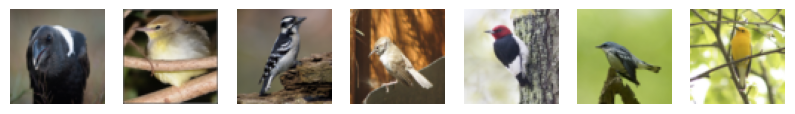

In [20]:
import matplotlib.pyplot as plt

# Choose the number of sample images you want to display
num_samples = 7

# Randomly select indices for sample images
sample_indices = np.random.choice(len(X_train), num_samples, replace=False)

# Plot and display the sample images
plt.figure(figsize=(10, 2))
for i, idx in enumerate(sample_indices):
    plt.subplot(1, num_samples, i + 1)
    plt.imshow(X_train[idx])
    img=plt.imshow(X_train[idx])
    plt.axis('off')

plt.show()


In [16]:
#define kl loss
def KL_loss(y_true, y_pred):
  mean = y_pred[:, :128]
  logsigma = y_pred[:, :128]
  loss = -logsigma + .5 * (-1 + K.exp(2. * logsigma) + K.square(mean))
  loss = K.mean(loss)
  return loss

#utility function to save rgb image
def save_rgb_img(img, path):
 """
 Save a rgb image
 """
 fig = plt.figure()
 ax = fig.add_subplot(1, 1, 1)
 ax.imshow(img)
 ax.axis("off")
 ax.set_title("Image")
 plt.savefig(path)
 plt.close()

In [23]:
#define optimizers required for training
dis_optimizer = Adam(learning_rate=stage1_discriminator_lr, beta_1 = 0.5, beta_2 = 0.999)
gen_optimizer = Adam(learning_rate=stage1_generator_lr, beta_1 = 0.5, beta_2 =0.999)

#build and compile different networks as follows
#conditional augmentation model
ca_model = build_ca_model()
ca_model.compile(loss = 'binary_crossentropy', optimizer = 'adam')

#stage 1 dscriminator model
stage1_dis = build_stage1_discriminator()
stage1_dis.compile(loss='binary_crossentropy', optimizer = dis_optimizer)

#stage 1 generator model
stage1_gen = build_stage1_generator()
stage1_gen.compile(loss = 'mse', optimizer = gen_optimizer)

#embedding compressor model
embedding_compressor_model = build_embedding_compressor_model()
embedding_compressor_model.compile(loss='binary_corssentropy', optimizer = 'adam')

#adversarial_model
adversarial_model = build_adverserial_model(gen_model = stage1_gen, dis_model = stage1_dis)
adversarial_model.compile(loss=['binary_crossentropy', KL_loss], loss_weights=[1, 2.0],
                          optimizer=gen_optimizer, metrics=None)


#stage 2 dscriminator model
stage1_dis = build_stage2_discriminator()
stage1_dis.compile(loss='binary_crossentropy', optimizer = dis_optimizer)

#stage 2 generator model
stage1_gen = build_stage2_generator()
stage1_gen.compile(loss = 'mse', optimizer = gen_optimizer)

#embedding compressor model
embedding_compressor_model = build_embedding_compressor_model()
embedding_compressor_model.compile(loss='binary_corssentropy', optimizer = 'adam')

adversarial_model
adversarial_model = build_adverserial_model(gen_model = stage1_gen, dis_model = stage1_dis)
adversarial_model.compile(loss=['binary_crossentropy', KL_loss], loss_weights=[1, 2.0],
                          optimizer=gen_optimizer, metrics=None)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 1024)]            0         
                                                                 
 dense_1 (Dense)             (None, 256)               262400    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 256)               0         
                                                                 
 lambda (Lambda)             (None, 128)               0         
                                                                 
Total params: 262400 (1.00 MB)
Trainable params: 262400 (1.00 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

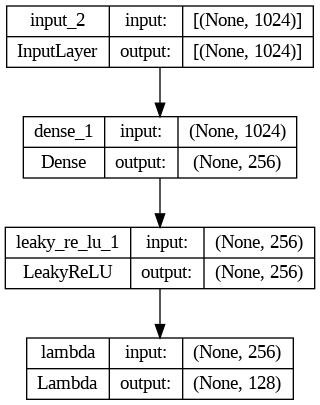

In [46]:

from tensorflow.keras.utils import plot_model
display(ca_model.summary())
plot_model(ca_model ,show_shapes=True)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 64, 64, 3)]          0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 32, 32, 64)           3072      ['input_3[0][0]']             
                                                                                                  
 leaky_re_lu_2 (LeakyReLU)   (None, 32, 32, 64)           0         ['conv2d[0][0]']              
                                                                                                  
 conv2d_1 (Conv2D)           (None, 16, 16, 128)          131072    ['leaky_re_lu_2[0][0]']       
                                                                                            

None

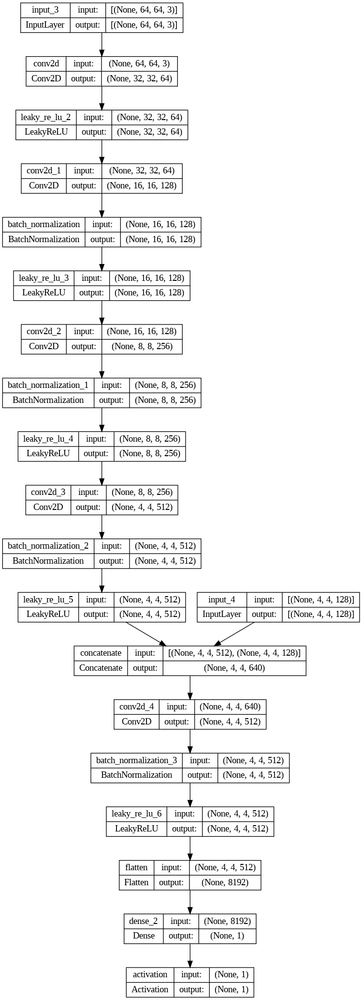

In [45]:
display(stage1_dis.summary())
plot_model(stage1_dis ,show_shapes=True)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 64, 64, 3)]          0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 32, 32, 64)           3072      ['input_3[0][0]']             
                                                                                                  
 leaky_re_lu_2 (LeakyReLU)   (None, 32, 32, 64)           0         ['conv2d[0][0]']              
                                                                                                  
 conv2d_1 (Conv2D)           (None, 16, 16, 128)          131072    ['leaky_re_lu_2[0][0]']       
                                                                                            

None

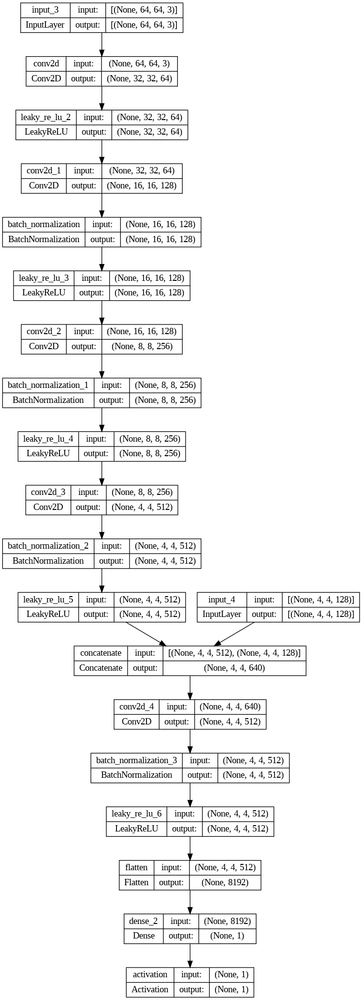

In [31]:
display(stage1_dis.summary())
plot_model(stage1_dis ,show_shapes=True)

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 1024)]               0         []                            
                                                                                                  
 dense_3 (Dense)             (None, 256)                  262400    ['input_5[0][0]']             
                                                                                                  
 leaky_re_lu_7 (LeakyReLU)   (None, 256)                  0         ['dense_3[0][0]']             
                                                                                                  
 lambda_1 (Lambda)           (None, 128)                  0         ['leaky_re_lu_7[0][0]']       
                                                                                            

None

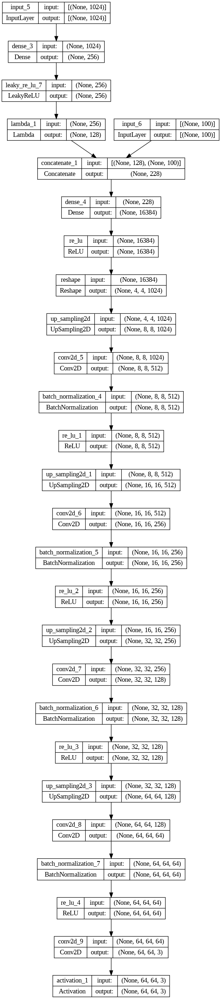

In [44]:

display(stage1_gen.summary())
plot_model(stage1_gen ,show_shapes=True)

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 1024)]            0         
                                                                 
 dense_5 (Dense)             (None, 128)               131200    
                                                                 
 re_lu_5 (ReLU)              (None, 128)               0         
                                                                 
Total params: 131200 (512.50 KB)
Trainable params: 131200 (512.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

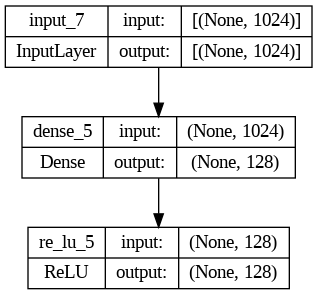

In [43]:
display(embedding_compressor_model.summary())
plot_model(embedding_compressor_model ,show_shapes=True)

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_8 (InputLayer)        [(None, 1024)]               0         []                            
                                                                                                  
 input_9 (InputLayer)        [(None, 100)]                0         []                            
                                                                                                  
 model_2 (Functional)        [(None, 64, 64, 3),          1027040   ['input_8[0][0]',             
                              (None, 256)]                0          'input_9[0][0]']             
                                                                                                  
 input_10 (InputLayer)       [(None, 4, 4, 128)]          0         []                      

None

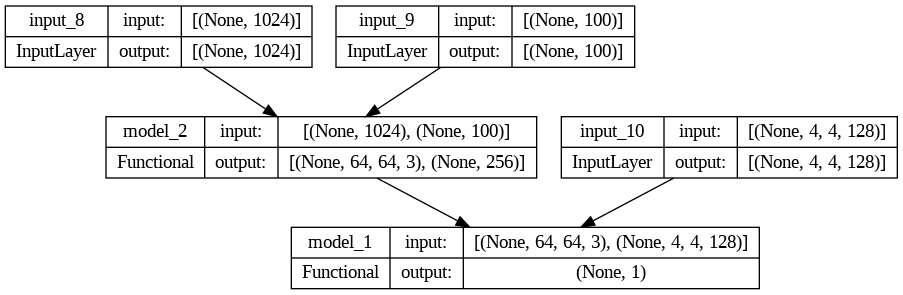

In [42]:
display(adversarial_model.summary())
plot_model(adversarial_model ,show_shapes=True)


In [39]:
tensorboard = TensorBoard(log_dir="logs/".format(time.time()))
tensorboard.set_model(stage1_gen)
tensorboard.set_model(stage1_dis)
tensorboard.set_model(ca_model)
tensorboard.set_model(embedding_compressor_model)

In [40]:
def write_log(callback, name, value, batch_no):
    summary = tf.Summary()
    summary_value = summary.value.add()
    summary_value.simple_value = value
    summary_value.tag = name
    callback.writer.add_summary(summary, batch_no)
    callback.writer.flush()

In [ ]:
#training model

#create two tensors with the real and fake labels
real_labels = np.ones((batch_size, 1), dtype = float) * 0.9
fake_labels = np.zeros((batch_size, 1), dtype =float) * 0.1

#create for loopfor the number of epochs
for epoch in range(epochs):
  print("===============================")
  print("Epoch is:", epoch)
  print('Number of batches', int(X_train.shape[0]/batch_size))

  gen_loss = []
  dis_loss = []

  number_of_batches = int(X_train.shape[0]/batch_size)
  for index in range(number_of_batches):
    print('Batch:{}'.format(index+1))
    #create batch of noise vectors
    z_noise = np.random.normal(0,1, size =(batch_size, z_dim))
    image_batch = X_train[index * batch_size :(index +1) * batch_size]
    embedding_batch = embeddings_train[index * batch_size :(index +1) * batch_size]

    #normalize images
    image_batch = (image_batch -127.5) / 127.5

    #generate fake images using the generator model by passing th embedding_batch and z noise
    fake_images , _ = stage1_gen.predict([embedding_batch, z_noise], verbose=3)

    #use the compressor model to compress the embedding, and spatially replicate it to a tensor of shape (batch_size, 4,4,128)
    compressed_embedding = embedding_compressor_model.predict_on_batch(embedding_batch)
    compressed_embedding = np.reshape(compressed_embedding, (-1,1,1,condition_dim))
    compressed_embedding = np.tile(compressed_embedding, (1,4,4,1))

    #train the discriminator model on ht efae images generated by the generator, the realimages form the real datasets and the wrong images
    dis_loss_real = stage1_dis.train_on_batch([image_batch, compressed_embedding], np.reshape(real_labels,(batch_size,1)))
    dis_loss_fake = stage1_dis.train_on_batch([fake_images, compressed_embedding], np.reshape(fake_labels,(batch_size,1)))
    dis_loss_wrong = stage1_dis.train_on_batch([image_batch[:(batch_size-1)], compressed_embedding[1:]],
                                               np.reshape(fake_labels[1:], (batch_size-1,1)))

    #train adversarial model, provide t with three inputs and the corresponding truth values, this operation will calculate the gradients and update the weights of one batch of data
    g_loss = adversarial_model.train_on_batch([embedding_batch, z_noise, compressed_embedding], [K.ones((batch_size,1)) * 0.9, K.ones((batch_size, 256))*0.9])

    d_loss = 0.5 *np.add(dis_loss_real, 0.5 * np.add(dis_loss_wrong, dis_loss_fake))

    print("d_loss:{}".format(d_loss))
    print("g_loss:{}".format(g_loss))

    dis_loss.append(d_loss)
    gen_loss.append(g_loss)

    #after each epoch, store losses to tensorboard
    #write_log(tensorboard, 'discriminator_loss', np.mean(dis_loss), epoch)
    #write_log(tensorboard, 'generator_loss', np.mean(gen_loss[0]), epoch)

    if epoch % 2 == 0:
        # z_noise2 = np.random.uniform(-1, 1, size=(batch_size, z_dim))
        z_noise2 = np.random.normal(0, 1, size=(batch_size, z_dim))
        embedding_batch = embeddings_test[0:batch_size]
        fake_images, _ = stage1_gen.predict_on_batch([embedding_batch, z_noise2])

        for i, img in enumerate(fake_images[:10]):
                save_rgb_img(img, "/content/drive/MyDrive/results/gen_{}_{}.png".format(epoch, i))
# Save models
stage1_gen.save_weights("stage1_gen.h5")
stage1_dis.save_weights("stage1_dis.h5")

Epoch is: 0
Number of batches 138
Batch:1


d_loss:0.7691944986581802
g_loss:[0.7306948900222778, 0.7019128203392029, 0.014391019940376282]


Batch:2


d_loss:1.8461438417434692
g_loss:[0.7534565925598145, 0.7179049253463745, 0.017775848507881165]


Batch:3


d_loss:1.7900486290454865
g_loss:[0.7363165616989136, 0.6953701972961426, 0.0204731784760952]


Batch:4


d_loss:1.8709134790115058
g_loss:[0.7631114721298218, 0.7297698855400085, 0.016670800745487213]


Batch:5


d_loss:1.2337695490568876
g_loss:[0.7455973625183105, 0.7207464575767517, 0.012425446882843971]


Batch:6


d_loss:1.4837802639231086
g_loss:[0.7564438581466675, 0.7358742356300354, 0.010284802876412868]


Batch:7


d_loss:1.359763653948903
g_loss:[0.7385527491569519, 0.7218952775001526, 0.008328745141625404]


Batch:8


d_loss:1.1735813869163394
g_loss:[0.7043085694313049, 0.6631219983100891, 0.020593293011188507]


Batch:9


d_loss:1.0707120671868324
g_loss:[0.7888882756233215, 0.7440139055252075, 0.022437194362282753]


Batch:10


d_loss:0.9389366377145052
g_loss:[0.815361499786377, 0.7815613746643066, 0.01690005138516426]


Batch:11


d_loss:1.0510352924466133
g_loss:[0.7685102224349976, 0.7463210225105286, 0.011094599962234497]


Batch:12


d_loss:1.016941823065281
g_loss:[0.7654634714126587, 0.7453799247741699, 0.01004177238792181]


Batch:13


d_loss:0.9471208560280502
g_loss:[0.7401221394538879, 0.7246298789978027, 0.007746116258203983]


Batch:14


d_loss:0.8898456245660782
g_loss:[0.7604623436927795, 0.7478442788124084, 0.006309042684733868]


Batch:15


d_loss:0.9237371254712343
g_loss:[0.7390660047531128, 0.7238969802856445, 0.007584499195218086]


Batch:16


d_loss:0.8006956959143281
g_loss:[0.7220490574836731, 0.708426296710968, 0.00681136641651392]


Batch:17


d_loss:1.017403674311936
g_loss:[0.746010959148407, 0.7367619872093201, 0.004624474793672562]


Batch:18


d_loss:0.830723088234663
g_loss:[0.7204901576042175, 0.7119463682174683, 0.004271896090358496]


Batch:19


d_loss:0.8698246348649263
g_loss:[0.7153208255767822, 0.7059379816055298, 0.004691422451287508]


Batch:20


d_loss:0.8567634290084243
g_loss:[0.6998604536056519, 0.6911293268203735, 0.004365567117929459]


Batch:21


d_loss:0.867481900844723
g_loss:[0.7460104823112488, 0.7351876497268677, 0.005411410238593817]


Batch:22


d_loss:0.7759062852710485
g_loss:[0.7081890106201172, 0.6980855464935303, 0.005051738582551479]


Batch:23


d_loss:0.7216510660946369
g_loss:[0.7184074521064758, 0.708146333694458, 0.005130557343363762]


Batch:24


d_loss:0.7431879094801843
g_loss:[0.7133485674858093, 0.7013128995895386, 0.006017820909619331]


Batch:25


d_loss:0.7814533521886915
g_loss:[0.6868701577186584, 0.676479160785675, 0.005195486359298229]


Batch:26


d_loss:0.7847579373046756
g_loss:[0.7218987345695496, 0.7117894887924194, 0.0050546228885650635]


Batch:27


d_loss:0.8115251264534891
g_loss:[0.6551656126976013, 0.647278904914856, 0.003943357616662979]


Batch:28


d_loss:0.7684269603341818
g_loss:[0.6257829666137695, 0.609664261341095, 0.00805935263633728]


Batch:29


d_loss:0.7067745528183877
g_loss:[0.6452245712280273, 0.6364655494689941, 0.004379512742161751]


Batch:30


d_loss:0.796929944306612
g_loss:[0.6906324028968811, 0.6828787326812744, 0.003876833012327552]


Batch:31


d_loss:0.6835710620507598
g_loss:[0.6284290552139282, 0.6213276982307434, 0.003550685243681073]


Batch:32


d_loss:0.7383870100602508
g_loss:[0.6595549583435059, 0.6501319408416748, 0.004711517132818699]


Batch:33


d_loss:0.7193852951750159
g_loss:[0.6547316908836365, 0.6442083120346069, 0.0052617015317082405]


Batch:34


d_loss:0.6970368847250938
g_loss:[0.6248054504394531, 0.6153712868690491, 0.0047170668840408325]


Batch:35


d_loss:0.6926999578572577
g_loss:[0.6283836960792542, 0.6199319362640381, 0.00422587851062417]


Batch:36


d_loss:0.6788908226881176
g_loss:[0.5681158304214478, 0.5574442148208618, 0.005335820838809013]


Batch:37


d_loss:0.7095544524345314
g_loss:[0.6638376712799072, 0.6541643142700195, 0.004836688283830881]


Batch:38


d_loss:0.7217569137574174
g_loss:[0.5833879113197327, 0.5733721852302551, 0.005007867235690355]


Batch:39


d_loss:0.6936000714777038
g_loss:[0.6020631790161133, 0.5951403379440308, 0.0034614207688719034]


Batch:40


d_loss:0.7740243125008419
g_loss:[0.5534341335296631, 0.5469983816146851, 0.003217869671061635]


Batch:41


d_loss:0.6637261391151696
g_loss:[0.5609976649284363, 0.5538925528526306, 0.003552559297531843]


Batch:42


d_loss:0.7116495952941477
g_loss:[0.5317991971969604, 0.5246168375015259, 0.003591167274862528]


Batch:43


d_loss:0.6413622451946139
g_loss:[0.6079330444335938, 0.599385142326355, 0.004273963626474142]


Batch:44


d_loss:0.644677004951518
g_loss:[0.5826565623283386, 0.5756422877311707, 0.0035071400925517082]


Batch:45


d_loss:0.6522338360664435
g_loss:[0.7285513281822205, 0.72116619348526, 0.003692575264722109]


Batch:46


d_loss:0.6568540959851816
g_loss:[0.6237156391143799, 0.6167826652526855, 0.0034664939157664776]


Batch:47


d_loss:0.6590771252522245
g_loss:[0.5084689855575562, 0.5000482201576233, 0.004210377112030983]


Batch:48


d_loss:0.6711939577944577
g_loss:[0.5414667725563049, 0.5344358682632446, 0.003515461692586541]


Batch:49


d_loss:0.6375407519226428
g_loss:[0.5760505199432373, 0.5685341358184814, 0.0037581974174827337]


Batch:50


d_loss:0.6366922002052888
g_loss:[0.5621710419654846, 0.5558686256408691, 0.0031512067653238773]


Batch:51


d_loss:0.6469046740239719
g_loss:[0.507976233959198, 0.501299262046814, 0.0033384785056114197]


Batch:52


d_loss:0.6587639258068521
g_loss:[0.5204653739929199, 0.5156080722808838, 0.002428648993372917]


Batch:53


d_loss:0.6674741101596737
g_loss:[0.5607686638832092, 0.554489254951477, 0.0031397175043821335]


Batch:54


d_loss:0.6323419026011834
g_loss:[0.5211584568023682, 0.5158253908157349, 0.0026665308978408575]


Batch:55


d_loss:0.6311784724384779
g_loss:[0.5250957012176514, 0.5185747146606445, 0.0032604821026325226]


Batch:56


d_loss:0.6599175769079011
g_loss:[0.4690791666507721, 0.46262383460998535, 0.003227668348699808]


Batch:57


d_loss:0.6510053711826913
g_loss:[0.471760094165802, 0.46409285068511963, 0.0038336284924298525]


Batch:58


d_loss:0.6395940622023772
g_loss:[0.47828033566474915, 0.4719279706478119, 0.003176189726218581]


Batch:59


d_loss:0.6504013756784843
g_loss:[0.4571520984172821, 0.45076367259025574, 0.003194213844835758]


Batch:60


d_loss:0.646715481299907
g_loss:[0.4765789210796356, 0.4704928398132324, 0.003043045289814472]


Batch:61


d_loss:0.6703842293354683
g_loss:[0.485831081867218, 0.4812053442001343, 0.002312873024493456]


Batch:62


d_loss:0.665481329197064
g_loss:[0.4651820957660675, 0.46086305379867554, 0.0021595265716314316]


Batch:63


d_loss:0.6642558810708579
g_loss:[0.4411761164665222, 0.43576931953430176, 0.002703397534787655]


Batch:64


d_loss:0.6437570618436439
g_loss:[0.4363231658935547, 0.43084442615509033, 0.0027393633499741554]


Batch:65


d_loss:0.6555210884835105
g_loss:[0.45428889989852905, 0.4474565088748932, 0.0034161927178502083]


Batch:66


d_loss:0.6229415126581443
g_loss:[0.3997601568698883, 0.3949454724788666, 0.0024073440581560135]


Batch:67


d_loss:0.6573376515880227
g_loss:[0.5033650398254395, 0.4993527829647064, 0.0020061214454472065]


Batch:68


d_loss:0.6653767056413926
g_loss:[0.4124688506126404, 0.4071946144104004, 0.00263712415471673]


Batch:69


d_loss:0.7177305315708509
g_loss:[0.45509883761405945, 0.4505530595779419, 0.0022728932090103626]


Batch:70


d_loss:0.6200763890519738
g_loss:[0.44450339674949646, 0.43967628479003906, 0.002413555746898055]


Batch:71


d_loss:0.6485342179075815
g_loss:[0.43008241057395935, 0.42431026697158813, 0.002886065747588873]


Batch:72


d_loss:0.6527571793994866
g_loss:[0.40023285150527954, 0.3954252004623413, 0.002403823658823967]


Batch:73


d_loss:0.6329566258355044
g_loss:[0.4330049753189087, 0.42828184366226196, 0.002361562103033066]


Batch:74


d_loss:0.6567050907178782
g_loss:[0.3885899484157562, 0.3841969668865204, 0.0021964970510452986]


Batch:75


d_loss:0.6398798689988325
g_loss:[0.39646485447883606, 0.39153528213500977, 0.002464784774929285]


Batch:76


d_loss:0.6318474230210995
g_loss:[0.37418267130851746, 0.36986663937568665, 0.0021580124739557505]


Batch:77


d_loss:0.6342058656155132
g_loss:[0.36857151985168457, 0.36449792981147766, 0.0020367885008454323]


Batch:78


d_loss:0.6280462898139376
g_loss:[0.3901243507862091, 0.38583484292030334, 0.002144755097106099]


Batch:79


d_loss:0.6181706712814048
g_loss:[0.4024413228034973, 0.3977033495903015, 0.00236899359151721]


Batch:80


d_loss:0.6175201465957798
g_loss:[0.3786647617816925, 0.3737064301967621, 0.0024791585747152567]


Batch:81


d_loss:0.6173791573964991
g_loss:[0.37136903405189514, 0.36658531427383423, 0.002391856163740158]


Batch:82


d_loss:0.6650745440274477
g_loss:[0.3805654048919678, 0.37611228227615356, 0.0022265631705522537]


Batch:83


d_loss:0.5992604705170379
g_loss:[0.3725382089614868, 0.3682103157043457, 0.002163948956876993]


Batch:84


d_loss:0.621259055857081
g_loss:[0.3731584846973419, 0.3686797618865967, 0.0022393628023564816]


Batch:85


d_loss:0.6146750994957983
g_loss:[0.4361336827278137, 0.4319426119327545, 0.002095540054142475]


Batch:86


d_loss:0.6164136122970376
g_loss:[0.422843337059021, 0.4185534119606018, 0.002144960919395089]


Batch:87


d_loss:0.6188567756908014
g_loss:[0.35839635133743286, 0.3531898260116577, 0.0026032670866698027]


Batch:88


d_loss:0.635159024503082
g_loss:[0.3803248107433319, 0.37475359439849854, 0.0027856030501425266]


Batch:89


d_loss:0.6580836134744459
g_loss:[0.3968580961227417, 0.39126479625701904, 0.0027966562192887068]


Batch:90


d_loss:0.6297877952747513
g_loss:[0.413527250289917, 0.40749961137771606, 0.00301381922326982]


Batch:91


d_loss:0.6264110135380179
g_loss:[0.3716565668582916, 0.3658719062805176, 0.002892326330766082]


Batch:92


d_loss:0.6856373884365894
g_loss:[0.3655450642108917, 0.3589274287223816, 0.003308812854811549]


Batch:93


d_loss:0.6269047231180593
g_loss:[0.3517313599586487, 0.34508752822875977, 0.00332191726192832]


Batch:94


d_loss:0.6433161564418697
g_loss:[0.3572232127189636, 0.3497133255004883, 0.003754944307729602]


Batch:95


d_loss:0.6288586307491641
g_loss:[0.3682703375816345, 0.3630217909812927, 0.002624266780912876]


Batch:96


d_loss:0.5941751897335052
g_loss:[0.3599450886249542, 0.3552033007144928, 0.002370894653722644]


Batch:97


d_loss:0.6156966688577086
g_loss:[0.3659461438655853, 0.3610537648200989, 0.0024461844004690647]


Batch:98


d_loss:0.6213236660405528
g_loss:[0.37345683574676514, 0.36875081062316895, 0.0023530146572738886]


Batch:99


d_loss:0.6271668340996257
g_loss:[0.3429654538631439, 0.3384779989719391, 0.0022437204606831074]


Batch:100


d_loss:0.6095713557733689
g_loss:[0.41602420806884766, 0.41132986545562744, 0.0023471713066101074]


Batch:101


d_loss:0.624544658450759
g_loss:[0.35813015699386597, 0.3536415994167328, 0.002244277624413371]


Batch:102


d_loss:0.643389809934888
g_loss:[0.348982572555542, 0.34488511085510254, 0.002048729220405221]


Batch:103


d_loss:0.6320266148177325
g_loss:[0.3575127422809601, 0.3532317876815796, 0.0021404775325208902]


Batch:104


d_loss:0.6448405764676863
g_loss:[0.3525373339653015, 0.34840065240859985, 0.00206834077835083]


Batch:105


d_loss:0.6360578007006552
g_loss:[0.35487455129623413, 0.35130539536476135, 0.001784585416316986]


Batch:106


d_loss:0.6044304166425718
g_loss:[0.3548470735549927, 0.3514670133590698, 0.0016900342889130116]


Batch:107


d_loss:0.6266595901943219
g_loss:[0.33798909187316895, 0.3334391415119171, 0.0022749800700694323]


Batch:108


d_loss:0.6190063976391684
g_loss:[0.3507627546787262, 0.3473536968231201, 0.0017045229906216264]


Batch:109


d_loss:0.6213242650119355
g_loss:[0.35212886333465576, 0.3487178087234497, 0.0017055204370990396]


Batch:110


d_loss:0.6088147020636825
g_loss:[0.34187251329421997, 0.3382985591888428, 0.0017869722796604037]


Batch:111


d_loss:0.6036452162807109
g_loss:[0.33473438024520874, 0.33090940117836, 0.0019124860409647226]


Batch:112


d_loss:0.6479680207849015
g_loss:[0.3434554636478424, 0.3395878076553345, 0.0019338330021128058]


Batch:113


d_loss:0.6082532209402416
g_loss:[0.34609663486480713, 0.3418888449668884, 0.0021038977429270744]


Batch:114


d_loss:0.5902027966367314
g_loss:[0.33937060832977295, 0.33561888337135315, 0.0018758574733510613]


Batch:115


d_loss:0.6092740601743571
g_loss:[0.3364391326904297, 0.3327535390853882, 0.0018428042531013489]


Batch:116


d_loss:0.6334330775134731
g_loss:[0.3445892333984375, 0.341143399477005, 0.0017229205695912242]


Batch:117


d_loss:0.6172976349298551
g_loss:[0.3331303596496582, 0.3301038444042206, 0.0015132622793316841]


Batch:118


d_loss:0.6004550985089736
g_loss:[0.33549970388412476, 0.3326183557510376, 0.001440681517124176]


Batch:119


d_loss:0.607019709328597
g_loss:[0.334924578666687, 0.33212825655937195, 0.001398160820826888]


Batch:120


d_loss:0.6093523448653286
g_loss:[0.3424648344516754, 0.33917391300201416, 0.0016454665455967188]


Batch:121


d_loss:0.6229705868172459
g_loss:[0.34236204624176025, 0.33903005719184875, 0.0016659882385283709]


Batch:122


d_loss:0.597457052761456
g_loss:[0.33888036012649536, 0.33580607175827026, 0.0015371385961771011]


Batch:123


d_loss:0.6630545883672312
g_loss:[0.3340780436992645, 0.33130866289138794, 0.0013846957590430975]


Batch:124


d_loss:0.61959251051303
g_loss:[0.32865044474601746, 0.3261415958404541, 0.0012544195633381605]


Batch:125


d_loss:0.5935030416148948
g_loss:[0.3345116972923279, 0.33142560720443726, 0.0015430443454533815]


Batch:126


d_loss:0.599038709733577
g_loss:[0.3288612365722656, 0.325869083404541, 0.0014960725093260407]


Batch:127


d_loss:0.6282318385492545
g_loss:[0.3280753195285797, 0.32534945011138916, 0.0013629382010549307]


Batch:128


d_loss:0.6222127535147592
g_loss:[0.3300553858280182, 0.3263756036758423, 0.0018398843239992857]


Batch:129


d_loss:0.6130574641429121
g_loss:[0.3412803113460541, 0.3373417556285858, 0.0019692792557179928]


Batch:130


d_loss:0.6101414963995921
g_loss:[0.3387182056903839, 0.33584821224212646, 0.0014349983539432287]


Batch:131


d_loss:0.6268450356510584
g_loss:[0.33736953139305115, 0.3340066075325012, 0.0016814626287668943]


Batch:132


d_loss:0.6051046138891252
g_loss:[0.3285749852657318, 0.3262353539466858, 0.0011698121670633554]


Batch:133


d_loss:0.6089657520642504
g_loss:[0.3277827799320221, 0.325478196144104, 0.00115229154471308]


Batch:134


d_loss:0.6023665152606554
g_loss:[0.3282258212566376, 0.32568174600601196, 0.0012720373924821615]


Batch:135


d_loss:0.6076461236261821
g_loss:[0.33466795086860657, 0.33213186264038086, 0.0012680457439273596]


Batch:136


d_loss:0.6045016707575996
g_loss:[0.3285319209098816, 0.32641324400901794, 0.0010593390325084329]


Batch:137


d_loss:0.608232620958006
g_loss:[0.3278921842575073, 0.32575851678848267, 0.0010668323375284672]


Batch:138


d_loss:0.5958553111704532
g_loss:[0.338577002286911, 0.3362523913383484, 0.0011622984893620014]


Epoch is: 1
Number of batches 138
Batch:1
d_loss:0.6233465860423166
g_loss:[0.33793893456459045, 0.3353814482688904, 0.0012787426821887493]
Batch:2
d_loss:0.6082029130484443
g_loss:[0.3390085697174072, 0.33625131845474243, 0.0013786285417154431]
Batch:3
d_loss:0.6096421325019037
g_loss:[0.3293346166610718, 0.3264659643173218, 0.001434328849427402]
Batch:4
d_loss:0.6518749315218884
g_loss:[0.3670351803302765, 0.3644787669181824, 0.0012782115954905748]
Batch:5
d_loss:0.6499695433303714
g_loss:[0.3626934289932251, 0.36038821935653687, 0.0011525989975780249]
Batch:6
d_loss:0.6687535940727685
g_loss:[0.3649832308292389, 0.3628934919834137, 0.0010448625544086099]
Batch:7
d_loss:0.6433610093954485
g_loss:[0.3736061155796051, 0.3714616894721985, 0.0010722156148403883]
Batch:8
d_loss:0.6171458916578558
g_loss:[0.38535091280937195, 0.3810746669769287, 0.002138118725270033]
Batch:9
d_loss:0.6172973260690924
g_loss:[0.3610396385192871, 0.35627278685569763, 0.0023834211751818657]
Batch:10
d_loss:0.

d_loss:0.6086932037142105
g_loss:[0.36067914962768555, 0.35320186614990234, 0.003738646861165762]


Batch:2


d_loss:0.5955208660016069
g_loss:[0.42333242297172546, 0.4161425530910492, 0.0035949326120316982]


Batch:3


d_loss:0.5932589684962295
g_loss:[0.35587558150291443, 0.34742575883865356, 0.004224911332130432]


Batch:4


d_loss:0.6331214203964919
g_loss:[0.35311242938041687, 0.3463057279586792, 0.0034033467527478933]


Batch:5


d_loss:0.6278471635923779
g_loss:[0.4041285216808319, 0.3982512056827545, 0.0029386584646999836]


Batch:6


d_loss:0.6341580786829581
g_loss:[0.3872878849506378, 0.3816537857055664, 0.0028170545119792223]


Batch:7


d_loss:0.6140130285966734
g_loss:[0.38543978333473206, 0.3790198862552643, 0.0032099520321935415]


Batch:8


d_loss:0.5951063654356403
g_loss:[0.36372119188308716, 0.355025053024292, 0.004348069429397583]


Batch:9


d_loss:0.603909153760469
g_loss:[0.3968074321746826, 0.3890834152698517, 0.0038620014674961567]


Batch:10


d_loss:0.5895027426304296
g_loss:[0.38869142532348633, 0.3794254660606384, 0.004632981959730387]


Batch:11


d_loss:0.6035412480705418
g_loss:[0.4015783667564392, 0.3924521505832672, 0.004563114605844021]


Batch:12


d_loss:0.6055628126487136
g_loss:[0.3825923204421997, 0.3728175163269043, 0.0048873997293412685]


Batch:13


d_loss:0.6027087947113614
g_loss:[0.37962308526039124, 0.3715865910053253, 0.0040182508528232574]


Batch:14


d_loss:0.6078096031560563
g_loss:[0.3695337176322937, 0.36265748739242554, 0.003438121872022748]


Batch:15


d_loss:0.6185456135717686
g_loss:[0.3614794909954071, 0.3551422357559204, 0.0031686262227594852]


Batch:16


d_loss:0.60555426767678
g_loss:[0.3494867980480194, 0.34316107630729675, 0.003162854816764593]


Batch:17


d_loss:0.662329856037104
g_loss:[0.3639480471611023, 0.35877230763435364, 0.0025878772139549255]


Batch:18


d_loss:0.5951918645587284
g_loss:[0.46232008934020996, 0.45740535855293274, 0.0024573584087193012]


Batch:19


d_loss:0.6325646301265806
g_loss:[0.5733179450035095, 0.5661356449127197, 0.003591155866160989]


Batch:20


d_loss:0.640960761345923
g_loss:[0.5364215970039368, 0.5251954197883606, 0.005613076500594616]


Batch:21


d_loss:0.5998793272301555
g_loss:[0.7250466346740723, 0.7101135849952698, 0.007466538343578577]


Batch:22


d_loss:0.6079475026053842
g_loss:[0.7124934196472168, 0.6962552070617676, 0.008119098842144012]


Batch:23


d_loss:0.5964462960400851
g_loss:[0.6249829530715942, 0.604454755783081, 0.010264108888804913]


Batch:24


d_loss:0.5907942737685516
g_loss:[0.5258461833000183, 0.5076539516448975, 0.009096117690205574]


Batch:25


d_loss:0.6264361611101776
g_loss:[0.4871778190135956, 0.46761554479599, 0.009781140834093094]


Batch:26


d_loss:0.5933651744853705
g_loss:[0.4245752990245819, 0.40446239709854126, 0.010056444443762302]


Batch:27


d_loss:0.6236216123506892
g_loss:[0.40725815296173096, 0.391620934009552, 0.0078186159953475]


Batch:28


d_loss:0.576684200874297
g_loss:[0.6398826241493225, 0.628739595413208, 0.005571501329541206]


Batch:29


d_loss:0.5941453606938012
g_loss:[0.5800056457519531, 0.5616097450256348, 0.009197952225804329]


Batch:30


d_loss:0.6254501487128437
g_loss:[0.4527871310710907, 0.43333542346954346, 0.009725850075483322]


Batch:31


d_loss:0.5846248389425455
g_loss:[0.6200003027915955, 0.596655011177063, 0.011672633700072765]


Batch:32


d_loss:0.5936210138897877
g_loss:[0.42517656087875366, 0.3830452859401703, 0.02106563374400139]


Batch:33


d_loss:0.6000027419941034
g_loss:[0.4901294410228729, 0.4461280107498169, 0.022000715136528015]


Batch:34


d_loss:0.5919503150798846
g_loss:[0.4082953631877899, 0.37449273467063904, 0.01690131239593029]


Batch:35


d_loss:0.6127311703457963
g_loss:[0.4262390434741974, 0.40011048316955566, 0.013064279220998287]


Batch:36


d_loss:0.582860222493764
g_loss:[0.4243331849575043, 0.40131425857543945, 0.011509467847645283]


Batch:37


d_loss:0.5946188697416801
g_loss:[0.3842827379703522, 0.3634226322174072, 0.010430056601762772]


Batch:38


d_loss:0.6096843384220847
g_loss:[0.3778589963912964, 0.35834771394729614, 0.00975564680993557]


Batch:39


d_loss:0.5992135092092212
g_loss:[0.3542174994945526, 0.3378955125808716, 0.008160990662872791]


Batch:40


d_loss:0.6228162381594302
g_loss:[0.4493708610534668, 0.4350716471672058, 0.007149603217840195]


Batch:41


d_loss:0.5876071353559382
g_loss:[0.4326916038990021, 0.4153083562850952, 0.008691624738276005]


Batch:42


d_loss:0.617305005172966
g_loss:[0.4274829030036926, 0.4034615457057953, 0.012010686099529266]


Batch:43


d_loss:0.5762078756233677
g_loss:[0.39997705817222595, 0.3654637336730957, 0.017256664112210274]


Batch:44


d_loss:0.589803903887514
g_loss:[0.39441490173339844, 0.3658190667629242, 0.014297922141849995]


Batch:45


d_loss:0.573951397484052
g_loss:[0.37064269185066223, 0.3471300005912781, 0.011756346561014652]


Batch:46


d_loss:0.5948177282116376
g_loss:[0.3736070394515991, 0.35214516520500183, 0.010730943642556667]


Batch:47


d_loss:0.6022364899981767
g_loss:[0.4181212782859802, 0.39689987897872925, 0.010610692203044891]


Batch:48


d_loss:0.5886024719802663
g_loss:[0.35751160979270935, 0.3364173173904419, 0.01054715272039175]


Batch:49


d_loss:0.579204665045836
g_loss:[0.37059828639030457, 0.3507418632507324, 0.009928210638463497]


Batch:50


d_loss:0.583221328080981
g_loss:[0.4142370820045471, 0.3956223130226135, 0.009307383559644222]


Batch:51


d_loss:0.591378859768156
g_loss:[0.35954830050468445, 0.33884692192077637, 0.01035068929195404]


Batch:52


d_loss:0.5963412172059179
g_loss:[0.6249352693557739, 0.6053162813186646, 0.009809482842683792]


Batch:53


d_loss:0.5922260285587981
g_loss:[0.3695458173751831, 0.3483838737010956, 0.010580970905721188]


Batch:54


d_loss:0.5884203746099956
g_loss:[0.39274129271507263, 0.3660455346107483, 0.013347881846129894]


Batch:55


d_loss:0.585038262011949
g_loss:[0.3866196572780609, 0.36644446849823, 0.010087599977850914]


Batch:56


d_loss:0.6088009536033496
g_loss:[0.6153548359870911, 0.5816187262535095, 0.016868051141500473]


Batch:57


d_loss:0.5919186083774548
g_loss:[0.3736698627471924, 0.34142017364501953, 0.01612483710050583]


Batch:58


d_loss:0.585029502195539
g_loss:[0.44457343220710754, 0.40722787380218506, 0.01867278479039669]


Batch:59


d_loss:0.5991078010556521
g_loss:[0.3980996608734131, 0.3648431599140167, 0.01662825234234333]


Batch:60


d_loss:0.6012629251781618
g_loss:[0.3834002614021301, 0.352337121963501, 0.015531574375927448]


Batch:61


d_loss:0.5982723578927107
g_loss:[0.36714062094688416, 0.3347407877445221, 0.016199922189116478]


Batch:62


d_loss:0.5971961347386241
g_loss:[0.3692421019077301, 0.338834673166275, 0.01520371064543724]


Batch:63


d_loss:0.601926942152204
g_loss:[0.3620634973049164, 0.33803367614746094, 0.012014912441372871]


Batch:64


d_loss:0.5836546736354649
g_loss:[0.355280339717865, 0.33018964529037476, 0.012545345351099968]


Batch:65


d_loss:0.6138843886656105
g_loss:[0.3465881943702698, 0.32684075832366943, 0.009873718954622746]


Batch:66


d_loss:0.5821085687639425
g_loss:[0.3924906551837921, 0.37149107456207275, 0.010499787516891956]


Batch:67


d_loss:0.5961458848614711
g_loss:[0.7096588611602783, 0.6917811036109924, 0.008938884362578392]


Batch:68


d_loss:0.6051366059546126
g_loss:[0.36419638991355896, 0.3426956534385681, 0.010750367306172848]


Batch:69


d_loss:0.6317815981456079
g_loss:[0.3723085820674896, 0.3551118075847626, 0.008598383516073227]


Batch:70


d_loss:0.5865770804521162
g_loss:[0.3662782609462738, 0.347014844417572, 0.009631702676415443]


Batch:71


d_loss:0.5843394023249857
g_loss:[0.5633274912834167, 0.5426112413406372, 0.010358124040067196]


Batch:72


d_loss:0.5989467258186778
g_loss:[0.3599942624568939, 0.33331722021102905, 0.013338519260287285]


Batch:73


d_loss:0.5872472270493745
g_loss:[0.5426374077796936, 0.5080360174179077, 0.017300695180892944]


Batch:74


d_loss:0.6148595566628501
g_loss:[0.4440099895000458, 0.404690682888031, 0.019659655168652534]


Batch:75


d_loss:0.600056120834779
g_loss:[0.7581127882003784, 0.7205241322517395, 0.01879432424902916]


Batch:76


d_loss:0.5921603175956989
g_loss:[0.439201682806015, 0.3932790756225586, 0.02296130731701851]


Batch:77


d_loss:0.5975836279685609
g_loss:[0.43203413486480713, 0.3906630277633667, 0.020685549825429916]


Batch:78


d_loss:0.5914878965559183
g_loss:[0.4388081431388855, 0.4040031433105469, 0.01740249991416931]


Batch:79


d_loss:0.5897040235431632
g_loss:[0.39672544598579407, 0.3603980243206024, 0.018163708969950676]


Batch:80


d_loss:0.5835532899855025
g_loss:[0.3980746269226074, 0.3643375337123871, 0.01686854660511017]


Batch:81


d_loss:0.5759234207798727
g_loss:[0.384627103805542, 0.3527270555496216, 0.015950027853250504]


Batch:82


d_loss:0.6160780447389698
g_loss:[0.36872971057891846, 0.3428371250629425, 0.012946298345923424]


Batch:83


d_loss:0.5682335317178513
g_loss:[0.4470728039741516, 0.42267030477523804, 0.012201255187392235]


Batch:84


d_loss:0.5928496382366575
g_loss:[0.44729286432266235, 0.42255696654319763, 0.012367945164442062]


Batch:85


d_loss:0.5877057692632661
g_loss:[0.4553600251674652, 0.4291709065437317, 0.013094564899802208]


Batch:86


d_loss:0.5805133768008091
g_loss:[0.380264014005661, 0.3482874035835266, 0.01598830334842205]


Batch:87


d_loss:0.587703794502886
g_loss:[0.36950331926345825, 0.33996546268463135, 0.014768934808671474]


Batch:88


d_loss:0.6002390765352175
g_loss:[0.3789081871509552, 0.34452489018440247, 0.017191654071211815]


Batch:89


d_loss:0.6005530028505746
g_loss:[0.35912024974823, 0.33515220880508423, 0.011984026059508324]


Batch:90


d_loss:0.6020000268727017
g_loss:[0.37553924322128296, 0.3510798513889313, 0.012229692190885544]


Batch:91


d_loss:0.590036166657228
g_loss:[0.35875439643859863, 0.3332037329673767, 0.012775334529578686]


Batch:92


d_loss:0.6243500146083534
g_loss:[0.3643144369125366, 0.34959375858306885, 0.0073603373020887375]


Batch:93


d_loss:0.5863744886410132
g_loss:[0.34309229254722595, 0.3299925923347473, 0.006549847312271595]


Batch:94


d_loss:0.5932603684123023
g_loss:[0.3453788459300995, 0.3270907402038574, 0.00914404820650816]


Batch:95


d_loss:0.5969719677159446
g_loss:[0.36015933752059937, 0.342793345451355, 0.008682994171977043]


Batch:96


d_loss:0.5771959833800793
g_loss:[0.34864556789398193, 0.3327847719192505, 0.007930401712656021]


Batch:97


d_loss:0.587527043029695
g_loss:[0.3491802215576172, 0.33424028754234314, 0.0074699693359434605]


Batch:98


d_loss:0.6100650895095896
g_loss:[0.34415775537490845, 0.32951855659484863, 0.007319599390029907]


Batch:99


d_loss:0.5902886906260392
g_loss:[0.7831202745437622, 0.7656902074813843, 0.008715019561350346]


Batch:100


d_loss:0.5806918895978015
g_loss:[0.5079119801521301, 0.4790530204772949, 0.014429483562707901]


Batch:101


d_loss:0.6047835921344813
g_loss:[0.3859451115131378, 0.35190439224243164, 0.017020363360643387]


Batch:102


d_loss:0.6028944133286132
g_loss:[0.4521631598472595, 0.4225488007068634, 0.014807184226810932]


Batch:103


d_loss:0.5976549491751939
g_loss:[0.3803700804710388, 0.3396160304546356, 0.020377028733491898]


Batch:104


d_loss:0.6052198132529156
g_loss:[0.3770331144332886, 0.33693379163742065, 0.02004966512322426]


Batch:105


d_loss:0.6061720124853309
g_loss:[0.38678497076034546, 0.3532342314720154, 0.01677536591887474]


Batch:106


d_loss:0.5791267566091847
g_loss:[0.4755384624004364, 0.4451083540916443, 0.015215056017041206]


Batch:107


d_loss:0.5959179007331841
g_loss:[0.36667579412460327, 0.3282219469547272, 0.0192269254475832]


Batch:108


d_loss:0.5896014561440097
g_loss:[0.3862805664539337, 0.35587623715400696, 0.015202166512608528]


Batch:109


d_loss:0.5902692423551343
g_loss:[0.3551069498062134, 0.32816049456596375, 0.013473223894834518]


Batch:110


d_loss:0.5833834543009289
g_loss:[0.35498493909835815, 0.32809534668922424, 0.013444801792502403]


Batch:111


d_loss:0.5774192754579417
g_loss:[0.356562077999115, 0.32992398738861084, 0.013319043442606926]


Batch:112


d_loss:0.586416592959722
g_loss:[0.3584076762199402, 0.33812224864959717, 0.010142713785171509]


Batch:113


d_loss:0.5890274093908374
g_loss:[0.37352779507637024, 0.34988000988960266, 0.011823895387351513]


Batch:114


d_loss:0.5693200379755581
g_loss:[0.34961816668510437, 0.3290520906448364, 0.010283035226166248]


Batch:115


d_loss:0.5831227364542428
g_loss:[0.4456537961959839, 0.425376832485199, 0.010138481855392456]


Batch:116


d_loss:0.5953419504658086
g_loss:[0.34985482692718506, 0.3289859890937805, 0.010434413328766823]


Batch:117


d_loss:0.5974343200796284
g_loss:[0.37446361780166626, 0.34176620841026306, 0.0163487009704113]


Batch:118


d_loss:0.5772571855632123
g_loss:[0.3539872169494629, 0.329537570476532, 0.012224828824400902]


Batch:119


d_loss:0.5831479953085363
g_loss:[0.3555089235305786, 0.3302263021469116, 0.012641310691833496]


Batch:120


d_loss:0.5848639241157798
g_loss:[0.35976314544677734, 0.3290597200393677, 0.015351716428995132]


Batch:121


d_loss:0.5984307277867629
g_loss:[0.4022553563117981, 0.3793228566646576, 0.01146625354886055]


Batch:122


d_loss:0.5755381338531151
g_loss:[0.3532850742340088, 0.33125025033950806, 0.011017407290637493]


Batch:123


d_loss:0.6254856820523855
g_loss:[0.3829253315925598, 0.36084824800491333, 0.011038534343242645]


Batch:124


d_loss:0.5877186476645875
g_loss:[0.34936484694480896, 0.32665085792541504, 0.011356998234987259]


Batch:125


d_loss:0.5729516043647891
g_loss:[0.5720862746238708, 0.5475049018859863, 0.012290675193071365]


Batch:126


d_loss:0.579960382077843
g_loss:[0.37446892261505127, 0.3312068581581116, 0.021631039679050446]


Batch:127


d_loss:0.5954453606391326
g_loss:[0.37245166301727295, 0.33224546909332275, 0.020103098824620247]


Batch:128


d_loss:0.595808715763269
g_loss:[0.3643207848072052, 0.33189213275909424, 0.016214322298765182]


Batch:129


d_loss:0.5842274664610159
g_loss:[0.40371671319007874, 0.36809465289115906, 0.01781102456152439]


Batch:130


d_loss:0.5885283017996699
g_loss:[0.3630070388317108, 0.33670473098754883, 0.013151148334145546]


Batch:131


d_loss:0.6013907246524468
g_loss:[0.3547505736351013, 0.3289485573768616, 0.012901007197797298]


Batch:132


d_loss:0.580120613820327
g_loss:[0.3551466166973114, 0.327237993478775, 0.01395430974662304]


Batch:133


d_loss:0.5833042813683278
g_loss:[0.3614858388900757, 0.3300812244415283, 0.015702303498983383]


Batch:134


d_loss:0.5771464681020007
g_loss:[0.3531690239906311, 0.32851046323776245, 0.012329287827014923]


Batch:135


d_loss:0.5892988063715165
g_loss:[0.35525938868522644, 0.3279641568660736, 0.013647619634866714]


Batch:136


d_loss:0.5814260316547006
g_loss:[0.35341161489486694, 0.3299434185028076, 0.011734100058674812]


Batch:137


d_loss:0.5849119593895011
g_loss:[0.3491002321243286, 0.3271123766899109, 0.01099393330514431]


Batch:138


d_loss:0.5796072107623331
g_loss:[0.35638701915740967, 0.32913637161254883, 0.01362532190978527]


Epoch is: 3
Number of batches 138
Batch:1
d_loss:0.6046522265824024
g_loss:[0.3497046232223511, 0.33259516954421997, 0.008554732427001]
Batch:2
d_loss:0.5890112905508431
g_loss:[0.3488534092903137, 0.3338336944580078, 0.007509857416152954]
Batch:3
d_loss:0.5864080780011136
g_loss:[0.34156712889671326, 0.32691720128059387, 0.00732495728880167]
Batch:4
d_loss:0.6201235498447204
g_loss:[0.3456251323223114, 0.3329629898071289, 0.0063310666009783745]
Batch:5
d_loss:0.6116930638436315
g_loss:[0.3525254428386688, 0.33842936158180237, 0.00704804714769125]
Batch:6
d_loss:0.6170109955855878
g_loss:[0.36066070199012756, 0.34344732761383057, 0.0086066834628582]
Batch:7
d_loss:0.6016546968603507
g_loss:[0.36509379744529724, 0.35076311230659485, 0.007165346294641495]
Batch:8
d_loss:0.5812218592727731
g_loss:[0.34880247712135315, 0.330136239528656, 0.00933312252163887]
Batch:9
d_loss:0.589621093840833
g_loss:[0.34618476033210754, 0.33096858859062195, 0.007608088664710522]
Batch:10
d_loss:0.5810791624

d_loss:0.5982677990796219
g_loss:[0.3381674885749817, 0.32817861437797546, 0.004994441755115986]


Batch:2


d_loss:0.5841801235183084
g_loss:[0.3599950075149536, 0.3509454131126404, 0.0045247930102050304]


Batch:3


d_loss:0.5821949589371798
g_loss:[0.3380480110645294, 0.3285871148109436, 0.004730449989438057]


Batch:4


d_loss:0.610206108973216
g_loss:[0.559614360332489, 0.5492870211601257, 0.005163658410310745]


Batch:5


d_loss:0.6008876978885382
g_loss:[0.42273858189582825, 0.4076882004737854, 0.007525189779698849]


Batch:6


d_loss:0.6092886294791242
g_loss:[0.371277391910553, 0.3551905155181885, 0.0080434400588274]


Batch:7


d_loss:0.5943025422166102
g_loss:[0.36562013626098633, 0.347520649433136, 0.009049749001860619]


Batch:8


d_loss:0.5747433756769169
g_loss:[0.36090683937072754, 0.34719693660736084, 0.006854956969618797]


Batch:9


d_loss:0.5832255462300964
g_loss:[0.37230950593948364, 0.3550295829772949, 0.00863996334373951]


Batch:10


d_loss:0.5785010710242204
g_loss:[0.359610378742218, 0.3384736180305481, 0.010568376630544662]


Batch:11


d_loss:0.5888178685599996
g_loss:[0.35205256938934326, 0.3392356336116791, 0.006408466026186943]


Batch:12


d_loss:0.5865440016978027
g_loss:[0.3674198091030121, 0.35465991497039795, 0.006379948928952217]


Batch:13


d_loss:0.5860948065383127
g_loss:[0.34734511375427246, 0.3311973214149475, 0.008073900826275349]


Batch:14


d_loss:0.5914515674085123
g_loss:[0.3560357093811035, 0.3412221074104309, 0.007406794466078281]


Batch:15


d_loss:0.6003104827286734
g_loss:[0.3637324273586273, 0.34739720821380615, 0.00816760677844286]


Batch:16


d_loss:0.5963077910528227
g_loss:[0.35192936658859253, 0.33796676993370056, 0.006981303915381432]


Batch:17


d_loss:0.6289513766969321
g_loss:[0.411974161863327, 0.39521247148513794, 0.008380843326449394]


Batch:18


d_loss:0.5832527690727147
g_loss:[0.3699670732021332, 0.3553771376609802, 0.007294965907931328]


Batch:19


d_loss:0.6122849325147399
g_loss:[0.3624466359615326, 0.3493589162826538, 0.006543859839439392]


Batch:20


d_loss:0.6119954069072264
g_loss:[0.3542104661464691, 0.3386762738227844, 0.0077671026811003685]


Batch:21


d_loss:0.5740806974754378
g_loss:[0.34566909074783325, 0.3329130709171295, 0.0063780141063034534]


Batch:22


d_loss:0.6001019788473059
g_loss:[0.3437219262123108, 0.3312932550907135, 0.006214341148734093]


Batch:23


d_loss:0.5803372283698991
g_loss:[0.34429168701171875, 0.3312137722969055, 0.0065389517694711685]


Batch:24


d_loss:0.5735632973483007
g_loss:[0.3488416373729706, 0.3327683210372925, 0.008036657236516476]


Batch:25


d_loss:0.6098507866054206
g_loss:[0.3437763452529907, 0.33133190870285034, 0.006222217343747616]


Batch:26


d_loss:0.5809304540634912
g_loss:[0.42069366574287415, 0.4091646373271942, 0.005764513276517391]


Batch:27


d_loss:0.6020631201390643
g_loss:[0.34911811351776123, 0.33670878410339355, 0.0062046595849096775]


Batch:28


d_loss:0.5645207142079016
g_loss:[0.36675190925598145, 0.35270756483078003, 0.00702217873185873]


Batch:29


d_loss:0.5852776794763486
g_loss:[0.3500540852546692, 0.33575940132141113, 0.007147334981709719]


Batch:30


d_loss:0.6018386953801382
g_loss:[0.3618961274623871, 0.3469041585922241, 0.00749598816037178]


Batch:31


d_loss:0.5741487679051716
g_loss:[0.3469332754611969, 0.33379125595092773, 0.006571011617779732]


Batch:32


d_loss:0.5795214073332318
g_loss:[0.3445665240287781, 0.33254557847976685, 0.006010469980537891]


Batch:33


d_loss:0.5846196249003697
g_loss:[0.3439679443836212, 0.33147963881492615, 0.0062441518530249596]


Batch:34


d_loss:0.5767861527601781
g_loss:[0.34992942214012146, 0.3368672728538513, 0.0065310802310705185]


Batch:35


d_loss:0.6000976573432126
g_loss:[0.35143300890922546, 0.3376091718673706, 0.006911918520927429]


Batch:36


d_loss:0.5712636692087472
g_loss:[0.35644495487213135, 0.34195607900619507, 0.0072444407269358635]


Batch:37


d_loss:0.5865586269646883
g_loss:[0.34407752752304077, 0.3306348919868469, 0.006721320562064648]


Batch:38


d_loss:0.5937040272347076
g_loss:[0.34775489568710327, 0.33429256081581116, 0.006731174420565367]


Batch:39


d_loss:0.5907997126996634
g_loss:[0.345888614654541, 0.3338263928890228, 0.006031110882759094]


Batch:40


d_loss:0.6018461901767296
g_loss:[0.3514527380466461, 0.3398376703262329, 0.005807535257190466]


Batch:41


d_loss:0.5771594487177936
g_loss:[0.36006230115890503, 0.3490796387195587, 0.005491324234753847]


Batch:42


d_loss:0.5993516687412921
g_loss:[0.3425341844558716, 0.33212727308273315, 0.0052034505642950535]


Batch:43


d_loss:0.5731145817990182
g_loss:[0.40528035163879395, 0.39676374197006226, 0.004258306231349707]


Batch:44


d_loss:0.5904202447272837
g_loss:[0.3837502896785736, 0.37538403272628784, 0.004183132201433182]


Batch:45


d_loss:0.5682879199739546
g_loss:[0.3785853981971741, 0.3704633116722107, 0.004061046987771988]


Batch:46


d_loss:0.5850708117650356
g_loss:[0.37937992811203003, 0.3708827495574951, 0.004248594865202904]


Batch:47


d_loss:0.5934616933955112
g_loss:[0.38136786222457886, 0.372131884098053, 0.004617988131940365]


Batch:48


d_loss:0.5803634468538803
g_loss:[0.3702852129936218, 0.3619838058948517, 0.004150697961449623]


Batch:49


d_loss:0.5745383112080162
g_loss:[0.41897091269493103, 0.4104212522506714, 0.004274831619113684]


Batch:50


d_loss:0.5778734393534251
g_loss:[0.3666342794895172, 0.35559892654418945, 0.0055176736786961555]


Batch:51


d_loss:0.579094170469034
g_loss:[0.36253663897514343, 0.35231566429138184, 0.005110485013574362]


Batch:52


d_loss:0.5893490470944016
g_loss:[0.3833363652229309, 0.3731474280357361, 0.005094468593597412]


Batch:53


d_loss:0.5780796732287854
g_loss:[0.35571524500846863, 0.346332848072052, 0.0046912021934986115]


Batch:54


d_loss:0.5824336536306873
g_loss:[0.3580474555492401, 0.34930384159088135, 0.00437181256711483]


Batch:55


d_loss:0.5753712934456416
g_loss:[0.544223964214325, 0.5343986749649048, 0.004912632517516613]


Batch:56


d_loss:0.5990812944746722
g_loss:[0.3619248867034912, 0.3486635088920593, 0.0066306861117482185]


Batch:57


d_loss:0.5778267254863749
g_loss:[0.3653095066547394, 0.3515811562538147, 0.006864180322736502]


Batch:58


d_loss:0.5772311105565677
g_loss:[0.4085248112678528, 0.39413535594940186, 0.007194730453193188]


Batch:59


d_loss:0.5892257873128983
g_loss:[0.3641691207885742, 0.3472002148628235, 0.008484452962875366]


Batch:60


d_loss:0.589037818413999
g_loss:[0.3586443066596985, 0.34336623549461365, 0.007639042101800442]


Batch:61


d_loss:0.5877517707249353
g_loss:[0.3566286861896515, 0.34130457043647766, 0.007662057410925627]


Batch:62


d_loss:0.5884735671252201
g_loss:[0.35801705718040466, 0.3427155315876007, 0.007650760002434254]


Batch:63


d_loss:0.5857706618940028
g_loss:[0.3564911484718323, 0.3382098078727722, 0.009140662848949432]


Batch:64


d_loss:0.5733343455212889
g_loss:[0.35080161690711975, 0.3375905156135559, 0.006605548784136772]


Batch:65


d_loss:0.608637167404595
g_loss:[0.3493131399154663, 0.3376850485801697, 0.0058140442706644535]


Batch:66


d_loss:0.5699647368292062
g_loss:[0.34661865234375, 0.3355708718299866, 0.005523886531591415]


Batch:67


d_loss:0.5886334850893036
g_loss:[0.3523162007331848, 0.3416776955127716, 0.005319259129464626]


Batch:68


d_loss:0.5938948355942557
g_loss:[0.34888941049575806, 0.33742278814315796, 0.0057333046570420265]


Batch:69


d_loss:0.6099450508481823
g_loss:[0.3543384373188019, 0.34280282258987427, 0.005767808295786381]


Batch:70


d_loss:0.5815080610027508
g_loss:[0.35958173871040344, 0.347276508808136, 0.00615260936319828]


Batch:71


d_loss:0.5769496408283885
g_loss:[0.3499750792980194, 0.33753037452697754, 0.006222349591553211]


Batch:72


d_loss:0.5876001342203381
g_loss:[0.34708303213119507, 0.3374065160751343, 0.004838256165385246]


Batch:73


d_loss:0.5759303121667472
g_loss:[0.3468722403049469, 0.3369749188423157, 0.004948654677718878]


Batch:74


d_loss:0.6032025358872488
g_loss:[0.3553437888622284, 0.34598401188850403, 0.00467988196760416]


Batch:75


d_loss:0.58795748626153
g_loss:[0.503311276435852, 0.49375075101852417, 0.004780261777341366]


Batch:76


d_loss:0.5880904885434575
g_loss:[0.3499358296394348, 0.3391231298446655, 0.005406348034739494]


Batch:77


d_loss:0.5827277070202399
g_loss:[0.3533172011375427, 0.3410071134567261, 0.006155046634376049]


Batch:78


d_loss:0.5812001711528865
g_loss:[0.3593558967113495, 0.3473328948020935, 0.006011496298015118]


Batch:79


d_loss:0.5812287667467899
g_loss:[0.3545669913291931, 0.3423369526863098, 0.00611501932144165]


Batch:80


d_loss:0.5740427805612853
g_loss:[0.3504144251346588, 0.33876118063926697, 0.005826620385050774]


Batch:81


d_loss:0.5703963382802613
g_loss:[0.34882214665412903, 0.3368685841560364, 0.005976784974336624]


Batch:82


d_loss:0.6050929534512761
g_loss:[0.34671998023986816, 0.3353753685951233, 0.005672312341630459]


Batch:83


d_loss:0.5612186943462802
g_loss:[0.3480710983276367, 0.33712783455848694, 0.005471629556268454]


Batch:84


d_loss:0.5865671222563833
g_loss:[0.34619972109794617, 0.3358476459980011, 0.005176032893359661]


Batch:85


d_loss:0.5754402031634527
g_loss:[0.3426836133003235, 0.3329613208770752, 0.00486114202067256]


Batch:86


d_loss:0.5728551257670915
g_loss:[0.3438788056373596, 0.3348654508590698, 0.004506681580096483]


Batch:87


d_loss:0.5777555158983887
g_loss:[0.47797879576683044, 0.46846261620521545, 0.004758083261549473]


Batch:88


d_loss:0.5894197837678803
g_loss:[0.34831252694129944, 0.3361664414405823, 0.006073037162423134]


Batch:89


d_loss:0.586484696226762
g_loss:[0.3752221465110779, 0.3616280257701874, 0.006797053385525942]


Batch:90


d_loss:0.5852045356095914
g_loss:[0.35355958342552185, 0.33724141120910645, 0.008159092627465725]


Batch:91


d_loss:0.5816517454277346
g_loss:[0.350216269493103, 0.3356412649154663, 0.007287501823157072]


Batch:92


d_loss:0.5975633592643135
g_loss:[0.34617409110069275, 0.33359014987945557, 0.006291966885328293]


Batch:93


d_loss:0.5774515378670912
g_loss:[0.3508632481098175, 0.3393401503562927, 0.005761545617133379]


Batch:94


d_loss:0.5819170836657577
g_loss:[0.3524758517742157, 0.33898085355758667, 0.0067474935203790665]


Batch:95


d_loss:0.5849421409429851
g_loss:[0.34450748562812805, 0.33343109488487244, 0.005538200959563255]


Batch:96


d_loss:0.5620782971382141
g_loss:[0.3428422510623932, 0.3315838575363159, 0.005629192106425762]


Batch:97


d_loss:0.5728917529249884
g_loss:[0.34594178199768066, 0.3348560333251953, 0.005542881321161985]


Batch:98


d_loss:0.5951593113832132
g_loss:[0.3437916934490204, 0.3337249755859375, 0.005033361259847879]


Batch:99


d_loss:0.5786619226164476
g_loss:[0.39493492245674133, 0.3839213252067566, 0.005506799556314945]


Batch:100


d_loss:0.5711106202506926
g_loss:[0.35118743777275085, 0.339899480342865, 0.005643983371555805]


Batch:101


d_loss:0.5895912908781611
g_loss:[0.346693754196167, 0.3365594148635864, 0.005067173857241869]


Batch:102


d_loss:0.5880325350663043
g_loss:[0.3436525762081146, 0.3334078788757324, 0.005122351925820112]


Batch:103


d_loss:0.5809278957931383
g_loss:[0.34536951780319214, 0.33537212014198303, 0.00499870628118515]


Batch:104


d_loss:0.5883457077397907
g_loss:[0.34913119673728943, 0.3391512930393219, 0.004989957436919212]


Batch:105


d_loss:0.5947533750713774
g_loss:[0.34691646695137024, 0.3373754024505615, 0.004770527593791485]


Batch:106


d_loss:0.5715171870324411
g_loss:[0.34432029724121094, 0.33515048027038574, 0.004584911745041609]


Batch:107


d_loss:0.5868960327397872
g_loss:[0.34095582365989685, 0.3312004804611206, 0.00487767206504941]


Batch:108


d_loss:0.5838347297794826
g_loss:[0.3397945463657379, 0.3308776021003723, 0.004458472598344088]


Batch:109


d_loss:0.5796951280208305
g_loss:[0.34076449275016785, 0.3325461149215698, 0.004109194502234459]


Batch:110


d_loss:0.5740017804500894
g_loss:[0.33833739161491394, 0.3306507170200348, 0.00384334078989923]


Batch:111


d_loss:0.5700412100522954
g_loss:[0.3391903340816498, 0.3315804600715637, 0.00380493002012372]


Batch:112


d_loss:0.5745599827314436
g_loss:[0.3543853461742401, 0.3465364873409271, 0.0039244359359145164]


Batch:113


d_loss:0.5786935504556823
g_loss:[0.3412916660308838, 0.3332368731498718, 0.004027394112199545]


Batch:114


d_loss:0.5631114017560321
g_loss:[0.5518434643745422, 0.5446450114250183, 0.0035992178600281477]


Batch:115


d_loss:0.574756421832717
g_loss:[0.4446706473827362, 0.43234267830848694, 0.00616398174315691]


Batch:116


d_loss:0.5821817251417087
g_loss:[0.35579803586006165, 0.33672112226486206, 0.009538460522890091]


Batch:117


d_loss:0.5884780853612028
g_loss:[0.35903361439704895, 0.34051313996315, 0.009260239079594612]


Batch:118


d_loss:0.5712090047190941
g_loss:[0.3590855002403259, 0.3379913866519928, 0.010547051206231117]


Batch:119


d_loss:0.5773308250118134
g_loss:[0.35947778820991516, 0.34263256192207336, 0.008422612212598324]


Batch:120


d_loss:0.5724665984635067
g_loss:[0.3524267375469208, 0.3345290422439575, 0.00894884578883648]


Batch:121


d_loss:0.5884608267224394
g_loss:[0.3529975414276123, 0.3359559178352356, 0.008520813658833504]


Batch:122


d_loss:0.5685531747335517
g_loss:[0.3521934449672699, 0.33768177032470703, 0.007255839183926582]


Batch:123


d_loss:0.6085115297621542
g_loss:[0.3577894866466522, 0.3466488718986511, 0.005570313893258572]


Batch:124


d_loss:0.5775694769372421
g_loss:[0.34542104601860046, 0.33486950397491455, 0.005275776144117117]


Batch:125


d_loss:0.5683328740269644
g_loss:[0.3471815586090088, 0.3349935710430145, 0.006093990057706833]


Batch:126


d_loss:0.5774714118279007
g_loss:[0.346066951751709, 0.3341139554977417, 0.005976499058306217]


Batch:127


d_loss:0.5822554682745249
g_loss:[0.3470791280269623, 0.3375031650066376, 0.004787980578839779]


Batch:128


d_loss:0.5879247014863722
g_loss:[0.34371593594551086, 0.33352023363113403, 0.005097850691527128]


Batch:129


d_loss:0.5741936920612716
g_loss:[0.3442278802394867, 0.33521246910095215, 0.0045077009126544]


Batch:130


d_loss:0.5795022273923678
g_loss:[0.3448394238948822, 0.3366639316082001, 0.004087748937308788]


Batch:131


d_loss:0.5920060352582368
g_loss:[0.3435329496860504, 0.3350052237510681, 0.004263856913894415]


Batch:132


d_loss:0.5711292785645128
g_loss:[0.34422510862350464, 0.3357642889022827, 0.004230408929288387]


Batch:133


d_loss:0.5755579547167144
g_loss:[0.34337615966796875, 0.33546972274780273, 0.003953220322728157]


Batch:134


d_loss:0.5698895865807572
g_loss:[0.34576964378356934, 0.3384879529476166, 0.0036408407613635063]


Batch:135


d_loss:0.5840298432212876
g_loss:[0.8096463680267334, 0.801795244216919, 0.003925575874745846]


Batch:136


d_loss:0.574584541405784
g_loss:[0.38275405764579773, 0.37331244349479675, 0.004720805678516626]


Batch:137


d_loss:0.5774583046841144
g_loss:[0.42519959807395935, 0.41409677267074585, 0.005551407113671303]


Batch:138


d_loss:0.5772030648786313
g_loss:[0.37341833114624023, 0.3588097095489502, 0.007304303348064423]


Epoch is: 5
Number of batches 138
Batch:1
d_loss:0.5925162921130323
g_loss:[0.35757362842559814, 0.3476330041885376, 0.0049703046679496765]
Batch:2
d_loss:0.5816067754858523
g_loss:[0.35573437809944153, 0.34551581740379333, 0.005109280347824097]
Batch:3
d_loss:0.5802616799646785
g_loss:[0.4768766164779663, 0.46687301993370056, 0.005001793149858713]
Batch:4
d_loss:0.6033473634161055
g_loss:[0.37204140424728394, 0.35592707991600037, 0.008057157509028912]
Batch:5
d_loss:0.5945303368521309
g_loss:[0.37579768896102905, 0.36099377274513245, 0.007401955313980579]
Batch:6
d_loss:0.6012852703697718
g_loss:[0.38912880420684814, 0.3757517337799072, 0.00668853847309947]
Batch:7
d_loss:0.5889046085044356
g_loss:[0.3725196421146393, 0.3593207001686096, 0.006599477492272854]
Batch:8
d_loss:0.5713108914205804
g_loss:[0.37896108627319336, 0.364311158657074, 0.0073249563574790955]
Batch:9
d_loss:0.5784528148806203
g_loss:[0.3668693006038666, 0.353460431098938, 0.006704437546432018]
Batch:10
d_loss:0.576

d_loss:0.7918757945299149
g_loss:[4.263552665710449, 4.257665634155273, 0.0029434943571686745]


Batch:2


d_loss:1.0124769136309624
g_loss:[4.973299026489258, 4.967580795288086, 0.002859132131561637]


Batch:3


d_loss:0.9917725175619125
g_loss:[3.4390814304351807, 3.432559013366699, 0.0032612034119665623]


Batch:4


d_loss:1.0809094868600368
g_loss:[0.9537463784217834, 0.9481797218322754, 0.0027833201456815004]


Batch:5


d_loss:0.8422561804763973
g_loss:[1.039975881576538, 1.0352826118469238, 0.0023466143757104874]


Batch:6


d_loss:0.7470553832827136
g_loss:[1.1772596836090088, 1.1730163097381592, 0.002121670637279749]


Batch:7


d_loss:0.6637775730341673
g_loss:[0.8827825784683228, 0.8783605098724365, 0.002211031038314104]


Batch:8


d_loss:0.6294546446006279
g_loss:[0.4818879961967468, 0.47713637351989746, 0.002375809708610177]


Batch:9


d_loss:0.6441440284252167
g_loss:[0.4344058334827423, 0.4290317893028259, 0.002687028143554926]


Batch:10


d_loss:0.6012363325280603
g_loss:[0.5590274930000305, 0.5536640882492065, 0.00268171401694417]


Batch:11


d_loss:0.6043620030395687
g_loss:[0.6041586995124817, 0.5995768308639526, 0.0022909410763531923]


Batch:12


d_loss:0.6231631718110293
g_loss:[0.6008625626564026, 0.5964004397392273, 0.002231068443506956]


Batch:13


d_loss:0.5958300305210287
g_loss:[0.6267624497413635, 0.6223053932189941, 0.0022285375744104385]


Batch:14


d_loss:0.6167831086349906
g_loss:[0.5278452634811401, 0.5237776041030884, 0.0020338224712759256]


Batch:15


d_loss:0.5974860073911259
g_loss:[0.5957241058349609, 0.5908427238464355, 0.0024407042656093836]


Batch:16


d_loss:0.6063051784949494
g_loss:[0.6220007538795471, 0.6177483201026917, 0.0021262101363390684]


Batch:17


d_loss:0.6322301689979213
g_loss:[0.824306070804596, 0.8197894096374512, 0.0022583361715078354]


Batch:18


d_loss:0.6012445055093849
g_loss:[0.8527541756629944, 0.8489572405815125, 0.0018984557827934623]


Batch:19


d_loss:0.6276862412923947
g_loss:[0.6553585529327393, 0.6516331434249878, 0.0018626971868798137]


Batch:20


d_loss:0.6151850635942537
g_loss:[0.6549977660179138, 0.6509886980056763, 0.00200454518198967]


Batch:21


d_loss:0.5870454078976763
g_loss:[0.6466884613037109, 0.6427226662635803, 0.001982884481549263]


Batch:22


d_loss:0.6141368862881791
g_loss:[0.6073290705680847, 0.6034089922904968, 0.0019600517116487026]


Batch:23


d_loss:0.5848722251248546
g_loss:[0.7478330731391907, 0.7436953783035278, 0.002068860922008753]


Batch:24


d_loss:0.583339833712671
g_loss:[0.6952735185623169, 0.6908997297286987, 0.0021869074553251266]


Batch:25


d_loss:0.6199356277647894
g_loss:[0.7066597938537598, 0.7025604844093323, 0.002049647271633148]


Batch:26


d_loss:0.5942952057230286
g_loss:[0.6701088547706604, 0.6649630069732666, 0.0025729243643581867]


Batch:27


d_loss:0.6074151864740998
g_loss:[0.7954078316688538, 0.7907308340072632, 0.002338501624763012]


Batch:28


d_loss:0.5894556669518352
g_loss:[1.529218077659607, 1.5234217643737793, 0.002898180391639471]


Batch:29


d_loss:0.5997243472957052
g_loss:[1.3304736614227295, 1.3256571292877197, 0.0024082441814243793]


Batch:30


d_loss:0.5998477722750977
g_loss:[1.08242666721344, 1.0774993896484375, 0.0024636585731059313]


Batch:31


d_loss:0.5875431606546044
g_loss:[1.0838557481765747, 1.07931387424469, 0.0022709122858941555]


Batch:32


d_loss:0.5850013469462283
g_loss:[1.000712513923645, 0.9954659938812256, 0.002623270731419325]


Batch:33


d_loss:0.5965575920417905
g_loss:[0.9823315739631653, 0.9765703678131104, 0.002880596788600087]


Batch:34


d_loss:0.6041363689582795
g_loss:[0.9931939244270325, 0.9876073598861694, 0.002793269930407405]


Batch:35


d_loss:0.6154661362525076
g_loss:[1.0701719522476196, 1.0646946430206299, 0.002738628536462784]


Batch:36


d_loss:0.5860713624861091
g_loss:[1.1076648235321045, 1.1020443439483643, 0.002810255391523242]


Batch:37


d_loss:0.5928704092511907
g_loss:[1.0127379894256592, 1.0075984001159668, 0.0025698235258460045]


Batch:38


d_loss:0.6010049488977529
g_loss:[0.9801194071769714, 0.9744861721992493, 0.0028166286647319794]


Batch:39


d_loss:0.5981062011269387
g_loss:[0.9162379503250122, 0.91126549243927, 0.0024862175341695547]


Batch:40


d_loss:0.606113463989459
g_loss:[0.9287716150283813, 0.9242308139801025, 0.0022703898139297962]


Batch:41


d_loss:0.5865495051257312
g_loss:[0.8535056710243225, 0.8491341471672058, 0.0021857749670743942]


Batch:42


d_loss:0.6049830198753625
g_loss:[0.8090080618858337, 0.804733395576477, 0.0021373210474848747]


Batch:43


d_loss:0.5728232079709414
g_loss:[0.7894247174263, 0.7850619554519653, 0.0021813884377479553]


Batch:44


d_loss:0.5867797702376265
g_loss:[0.7861468195915222, 0.7818337678909302, 0.002156519563868642]


Batch:45


d_loss:0.5751267620362341
g_loss:[0.803961992263794, 0.7994459867477417, 0.0022579925134778023]


Batch:46


d_loss:0.583746718504699
g_loss:[0.8452724814414978, 0.8410816192626953, 0.0020954429637640715]


Batch:47


d_loss:0.594100599992089
g_loss:[0.7869758009910583, 0.7825347781181335, 0.002220498165115714]


Batch:48


d_loss:0.585922395111993
g_loss:[0.791215717792511, 0.7872339487075806, 0.0019908768590539694]


Batch:49


d_loss:0.5759478520049015
g_loss:[0.7763449549674988, 0.7722844481468201, 0.0020302594639360905]


Batch:50


d_loss:0.5785724032321014
g_loss:[0.7594537734985352, 0.7550980448722839, 0.0021778573282063007]


Batch:51


d_loss:0.5823658190638525
g_loss:[0.8116589784622192, 0.8073866367340088, 0.0021361762192100286]


Batch:52


d_loss:0.5905923800019082
g_loss:[0.7740228772163391, 0.7696144580841064, 0.002204220276325941]


Batch:53


d_loss:0.5892520919442177
g_loss:[0.7387235164642334, 0.7346285581588745, 0.002047484740614891]


Batch:54


d_loss:0.5816170767066069
g_loss:[0.8067700862884521, 0.802908182144165, 0.0019309668568894267]


Batch:55


d_loss:0.5780677468283102
g_loss:[0.7678684592247009, 0.763042151927948, 0.002413144800812006]


Batch:56


d_loss:0.5965270957676694
g_loss:[0.7200375199317932, 0.7155367732048035, 0.0022503703366965055]


Batch:57


d_loss:0.5844642326701432
g_loss:[0.7249126434326172, 0.7208197116851807, 0.002046473091468215]


Batch:58


d_loss:0.5798268302169163
g_loss:[0.7882062792778015, 0.7840104103088379, 0.002097946358844638]


Batch:59


d_loss:0.5979066755389795
g_loss:[0.7478225231170654, 0.7436767220497131, 0.002072889357805252]


Batch:60


d_loss:0.5857436792284716
g_loss:[0.7558616995811462, 0.7516782879829407, 0.0020917169749736786]


Batch:61


d_loss:0.5917028787662275
g_loss:[0.7554740905761719, 0.7514005899429321, 0.0020367568358778954]


Batch:62


d_loss:0.5972465979866683
g_loss:[0.7716760635375977, 0.7674704790115356, 0.0021027838811278343]


Batch:63


d_loss:0.5871354489499936
g_loss:[0.7420654296875, 0.7376793026924133, 0.002193060703575611]


Batch:64


d_loss:0.5780185096882633
g_loss:[0.7196575403213501, 0.71583092212677, 0.0019133053719997406]


Batch:65


d_loss:0.6078777171569527
g_loss:[0.7213683128356934, 0.7174703478813171, 0.0019489710684865713]


Batch:66


d_loss:0.5656393892131746
g_loss:[0.7126762270927429, 0.70887291431427, 0.001901661278679967]


Batch:67


d_loss:0.5934666657703929
g_loss:[0.7220324873924255, 0.7183881998062134, 0.0018221349455416203]


Batch:68


d_loss:0.5997845256133587
g_loss:[0.7400845885276794, 0.736230731010437, 0.0019269257318228483]


Batch:69


d_loss:0.6073998399078846
g_loss:[0.7957689166069031, 0.7922247052192688, 0.0017720945179462433]


Batch:70


d_loss:0.5807925275585148
g_loss:[0.8484529852867126, 0.8448690176010132, 0.0017919695237651467]


Batch:71


d_loss:0.5787186012166785
g_loss:[0.8324786424636841, 0.8288486003875732, 0.0018150318646803498]


Batch:72


d_loss:0.5953672901086975
g_loss:[0.7683796882629395, 0.764616072177887, 0.0018817931413650513]


Batch:73


d_loss:0.5759617222502129
g_loss:[0.7570705413818359, 0.7531882524490356, 0.0019411371322348714]


Batch:74


d_loss:0.5987011697434355
g_loss:[0.7631919384002686, 0.75932776927948, 0.0019320958526805043]


Batch:75


d_loss:0.5988355346489698
g_loss:[0.7442579865455627, 0.7404117584228516, 0.0019231049809604883]


Batch:76


d_loss:0.5878948129247874
g_loss:[0.7214285135269165, 0.7176611423492432, 0.0018836816307157278]


Batch:77


d_loss:0.5811562502931338
g_loss:[0.7229408025741577, 0.7190950512886047, 0.0019228743622079492]


Batch:78


d_loss:0.5804032741070841
g_loss:[0.7412434816360474, 0.7377291917800903, 0.0017571467906236649]


Batch:79


d_loss:0.5828036866732873
g_loss:[0.6930121183395386, 0.6890809535980225, 0.001965594943612814]


Batch:80


d_loss:0.5771012495970353
g_loss:[0.7471501231193542, 0.7436341047286987, 0.0017580183921381831]


Batch:81


d_loss:0.5745186001295224
g_loss:[0.7696430087089539, 0.7661498188972473, 0.0017466029385104775]


Batch:82


d_loss:0.6102139925569645
g_loss:[0.6752332448959351, 0.6716693639755249, 0.0017819392960518599]


Batch:83


d_loss:0.5585036019256222
g_loss:[0.8283455967903137, 0.8248881101608276, 0.0017287369119003415]


Batch:84


d_loss:0.5819801441393793
g_loss:[0.7663440108299255, 0.762737512588501, 0.0018032558728009462]


Batch:85


d_loss:0.5776632051783963
g_loss:[0.6973177194595337, 0.6935868263244629, 0.001865448895841837]


Batch:86


d_loss:0.574070680901059
g_loss:[0.6922640204429626, 0.6884429454803467, 0.0019105412065982819]


Batch:87


d_loss:0.5824851875513559
g_loss:[0.7176969051361084, 0.7131643295288086, 0.0022662875708192587]


Batch:88


d_loss:0.5960728651880345
g_loss:[0.6819965243339539, 0.677723228931427, 0.002136648865416646]


Batch:89


d_loss:0.5973524400760652
g_loss:[0.665195107460022, 0.6615535020828247, 0.001820815959945321]


Batch:90


d_loss:0.5875695337890647
g_loss:[0.694097638130188, 0.6901880502700806, 0.0019547906704247]


Batch:91


d_loss:0.5839873921213439
g_loss:[0.8992661833763123, 0.8954278230667114, 0.0019191671162843704]


Batch:92


d_loss:0.6066222872759681
g_loss:[0.6945400238037109, 0.6900202035903931, 0.0022599021904170513]


Batch:93


d_loss:0.5792402531078551
g_loss:[0.7101550698280334, 0.7054780721664429, 0.002338486723601818]


Batch:94


d_loss:0.5783082565467339
g_loss:[0.741473913192749, 0.7355777621269226, 0.0029480629600584507]


Batch:95


d_loss:0.5829139783454593
g_loss:[0.7075362801551819, 0.7028020620346069, 0.002367120236158371]


Batch:96


d_loss:0.5625856567785377
g_loss:[0.6693112850189209, 0.6641628742218018, 0.00257419073022902]


Batch:97


d_loss:0.5728448581940029
g_loss:[0.691514253616333, 0.6859889030456543, 0.002762670163065195]


Batch:98


d_loss:0.5952857820229838
g_loss:[0.6824453473091125, 0.6769254803657532, 0.0027599274180829525]


Batch:99


d_loss:0.5796197584131733
g_loss:[0.6806812882423401, 0.6757082939147949, 0.0024864976294338703]


Batch:100


d_loss:0.5731585601752158
g_loss:[0.6782729029655457, 0.673926591873169, 0.0021731676533818245]


Batch:101


d_loss:0.5933786175301066
g_loss:[0.6516672372817993, 0.6474356055259705, 0.002115824958309531]


Batch:102


d_loss:0.5962933803966735
g_loss:[0.6213830709457397, 0.6172124147415161, 0.002085334388539195]


Batch:103


d_loss:0.585545026246109
g_loss:[0.6604892015457153, 0.6567387580871582, 0.0018752358155325055]


Batch:104


d_loss:0.5960138485097559
g_loss:[0.6476798057556152, 0.6436301469802856, 0.0020248298533260822]


Batch:105


d_loss:0.596886317973258
g_loss:[0.6662535667419434, 0.6621872186660767, 0.002033179858699441]


Batch:106


d_loss:0.5687310741377587
g_loss:[0.672946035861969, 0.6691155433654785, 0.0019152560271322727]


Batch:107


d_loss:0.5897330638981657
g_loss:[0.6224957704544067, 0.6187323331832886, 0.0018817335367202759]


Batch:108


d_loss:0.585376854185597
g_loss:[0.6379482746124268, 0.6342678070068359, 0.0018402270507067442]


Batch:109


d_loss:0.5831233652424999
g_loss:[0.6041420102119446, 0.6007846593856812, 0.001678668544627726]


Batch:110


d_loss:0.5729407021135557
g_loss:[0.6286292672157288, 0.625239372253418, 0.0016949435230344534]


Batch:111


d_loss:0.5724999657613807
g_loss:[0.6330533027648926, 0.629705548286438, 0.00167387118563056]


Batch:112


d_loss:0.5787702734523918
g_loss:[0.642316460609436, 0.639031171798706, 0.0016426381189376116]


Batch:113


d_loss:0.5813783192133997
g_loss:[0.6362667083740234, 0.6327962875366211, 0.001735209720209241]


Batch:114


d_loss:0.5605967000083183
g_loss:[0.6367294192314148, 0.6332939863204956, 0.0017177050467580557]


Batch:115


d_loss:0.5766657025087625
g_loss:[0.6132248044013977, 0.6098715662956238, 0.0016766171902418137]


Batch:116


d_loss:0.5874712282966357
g_loss:[0.6170771718025208, 0.6136265993118286, 0.0017252760007977486]


Batch:117


d_loss:0.5892435411369661
g_loss:[0.6407731771469116, 0.6373710632324219, 0.0017010433366522193]


Batch:118


d_loss:0.5688989560730988
g_loss:[0.6346991658210754, 0.6314534544944763, 0.0016228584572672844]


Batch:119


d_loss:0.5763870102236979
g_loss:[0.612662136554718, 0.6091467142105103, 0.0017577102407813072]


Batch:120


d_loss:0.5773745921287627
g_loss:[0.5953031778335571, 0.5917508602142334, 0.001776167075149715]


Batch:121


d_loss:0.58918674463348
g_loss:[0.5869517922401428, 0.5837047100067139, 0.001623549498617649]


Batch:122


d_loss:0.5702751062563038
g_loss:[0.6498546600341797, 0.6468253135681152, 0.0015146804507821798]


Batch:123


d_loss:0.6144524430092133
g_loss:[0.5820578932762146, 0.5785055160522461, 0.0017761947819963098]


Batch:124


d_loss:0.5755918672075495
g_loss:[0.6165043711662292, 0.6127802133560181, 0.0018620770424604416]


Batch:125


d_loss:0.5673284158910974
g_loss:[0.6143537759780884, 0.6105952262878418, 0.0018792800838127732]


Batch:126


d_loss:0.5745426810663048
g_loss:[0.6252201795578003, 0.6217433214187622, 0.0017384225502610207]


Batch:127


d_loss:0.5871428036116413
g_loss:[0.5827215909957886, 0.5791407823562622, 0.001790408743545413]


Batch:128


d_loss:0.5861747827730142
g_loss:[0.6224212050437927, 0.6192286014556885, 0.0015963023761287332]


Batch:129


d_loss:0.5768341118528042
g_loss:[0.6073346138000488, 0.6039279699325562, 0.0017033270560204983]


Batch:130


d_loss:0.576952361214353
g_loss:[0.6164664626121521, 0.6128888130187988, 0.0017888282891362906]


Batch:131


d_loss:0.5926431997286272
g_loss:[0.5654597878456116, 0.5618340969085693, 0.0018128396477550268]


Batch:132


d_loss:0.5683582339916029
g_loss:[0.5670452117919922, 0.5633710622787476, 0.0018370823236182332]


Batch:133


d_loss:0.5774053248387645
g_loss:[0.5757737159729004, 0.5717328786849976, 0.0020204121246933937]


Batch:134


d_loss:0.5681735963771644
g_loss:[0.5828186869621277, 0.5792526006698608, 0.001783049083314836]


Batch:135


d_loss:0.5832696733123157
g_loss:[0.5990791320800781, 0.5951930284500122, 0.0019430620595812798]


Batch:136


d_loss:0.575000770681072
g_loss:[0.6672376990318298, 0.6635862588882446, 0.0018257133197039366]


Batch:137


d_loss:0.5789701107023575
g_loss:[0.6070064306259155, 0.6030368804931641, 0.001984783448278904]


Batch:138


d_loss:0.5802881238269038
g_loss:[0.6199108362197876, 0.6158448457717896, 0.0020330026745796204]


Epoch is: 7
Number of batches 138
Batch:1
d_loss:0.5897172727272846
g_loss:[0.5686231851577759, 0.5647355318069458, 0.001943836803548038]
Batch:2
d_loss:0.5773504500830313
g_loss:[0.590789794921875, 0.5864570140838623, 0.002166400197893381]
Batch:3
d_loss:0.5778555300748849
g_loss:[0.598343014717102, 0.5940133333206177, 0.0021648528054356575]
Batch:4
d_loss:0.6061652731114009
g_loss:[0.5846056938171387, 0.5801834464073181, 0.002211119281128049]
Batch:5
d_loss:0.5942899113433668
g_loss:[0.6607750058174133, 0.6565204858779907, 0.0021272487938404083]
Batch:6
d_loss:0.6031312791456003
g_loss:[0.738128662109375, 0.7341196537017822, 0.002004493260756135]
Batch:7
d_loss:0.5902001437789295
g_loss:[0.681874692440033, 0.6781309843063354, 0.0018718536011874676]
Batch:8
d_loss:0.5683528417102934
g_loss:[0.6271387338638306, 0.6234691143035889, 0.0018348016310483217]
Batch:9
d_loss:0.5831643495039316
g_loss:[0.6118487119674683, 0.607814371585846, 0.0020171585492789745]
Batch:10
d_loss:0.574326210033

d_loss:0.5836110086675035
g_loss:[0.4891878366470337, 0.48687267303466797, 0.0011575812241062522]


Batch:2


d_loss:0.5749117539526196
g_loss:[0.46847543120384216, 0.4659756124019623, 0.0012499116128310561]


Batch:3


d_loss:0.5760632998426445
g_loss:[0.46180468797683716, 0.45922887325286865, 0.0012879130663350224]


Batch:4


d_loss:0.5964856234568288
g_loss:[0.525825560092926, 0.523103654384613, 0.0013609465677291155]


Batch:5


d_loss:0.5878287455998361
g_loss:[0.6053510904312134, 0.6019274592399597, 0.0017118013929575682]


Batch:6


d_loss:0.5986839936958859
g_loss:[0.632753849029541, 0.629026472568512, 0.0018636886961758137]


Batch:7


d_loss:0.5829991231366876
g_loss:[0.5772185325622559, 0.5736396908760071, 0.0017894180491566658]


Batch:8


d_loss:0.5634049976360984
g_loss:[0.5254023671150208, 0.5227230787277222, 0.0013396514113992453]


Batch:9


d_loss:0.5784831758064684
g_loss:[0.5508424043655396, 0.5479006767272949, 0.0014708500821143389]


Batch:10


d_loss:0.5715822624333669
g_loss:[0.5342907309532166, 0.5308936834335327, 0.0016985309775918722]


Batch:11


d_loss:0.5855455029013683
g_loss:[0.503702700138092, 0.5007922649383545, 0.0014552169013768435]


Batch:12


d_loss:0.5746700170930126
g_loss:[0.49470293521881104, 0.49175775051116943, 0.00147259421646595]


Batch:13


d_loss:0.5762350052536931
g_loss:[0.4867655336856842, 0.48366662859916687, 0.001549452543258667]


Batch:14


d_loss:0.578623451088788
g_loss:[0.5158215165138245, 0.5128830075263977, 0.0014692688127979636]


Batch:15


d_loss:0.5851481165664154
g_loss:[0.5174384117126465, 0.514840304851532, 0.0012990654213353992]


Batch:16


d_loss:0.58634364012687
g_loss:[0.49997061491012573, 0.4974018633365631, 0.0012843789299950004]


Batch:17


d_loss:0.6093710706263664
g_loss:[0.5291721224784851, 0.5261102914810181, 0.0015309222508221865]


Batch:18


d_loss:0.5746784971634042
g_loss:[0.5044445395469666, 0.5016896724700928, 0.0013774351682513952]


Batch:19


d_loss:0.6014853642554954
g_loss:[0.5203927755355835, 0.5178000330924988, 0.0012963709887117147]


Batch:20


d_loss:0.5943940204597311
g_loss:[0.49110227823257446, 0.4885140061378479, 0.0012941311579197645]


Batch:21


d_loss:0.5674692913889885
g_loss:[0.4780505299568176, 0.4755173921585083, 0.0012665733229368925]


Batch:22


d_loss:0.5914678487642959
g_loss:[0.47137928009033203, 0.4689505100250244, 0.001214390154927969]


Batch:23


d_loss:0.5700122597336303
g_loss:[0.4650864899158478, 0.4625205099582672, 0.0012829904444515705]


Batch:24


d_loss:0.5653104747179896
g_loss:[0.4891144335269928, 0.4861343204975128, 0.0014900615205988288]


Batch:25


d_loss:0.5956400869472418
g_loss:[0.47113126516342163, 0.4687945246696472, 0.0011683700140565634]


Batch:26


d_loss:0.5704868215834722
g_loss:[0.46671363711357117, 0.46440279483795166, 0.0011554202064871788]


Batch:27


d_loss:0.5925297332723858
g_loss:[0.4566091299057007, 0.45404481887817383, 0.001282159355469048]


Batch:28


d_loss:0.5593493621818197
g_loss:[0.4894874095916748, 0.4863695800304413, 0.001558913616463542]


Batch:29


d_loss:0.5764133205921098
g_loss:[0.5166177749633789, 0.5138156414031982, 0.001401060028001666]


Batch:30


d_loss:0.581939748426521
g_loss:[0.465822696685791, 0.46293556690216064, 0.0014435695484280586]


Batch:31


d_loss:0.566500112938229
g_loss:[0.517630398273468, 0.5149636268615723, 0.001333396416157484]


Batch:32


d_loss:0.5734432890494645
g_loss:[0.4855167269706726, 0.48257648944854736, 0.0014701217878609896]


Batch:33


d_loss:0.5744875377567951
g_loss:[0.4623420834541321, 0.45861291885375977, 0.0018645853269845247]


Batch:34


d_loss:0.5692796589646605
g_loss:[0.4561576843261719, 0.45292678475379944, 0.0016154509503394365]


Batch:35


d_loss:0.5920895208837464
g_loss:[0.5062507390975952, 0.5032635927200317, 0.0014935701619833708]


Batch:36


d_loss:0.5625529613898834
g_loss:[0.5243225693702698, 0.5216515064239502, 0.001335536246187985]


Batch:37


d_loss:0.5758120797217998
g_loss:[0.4896542429924011, 0.48716580867767334, 0.0012442199513316154]


Batch:38


d_loss:0.5785538315612939
g_loss:[0.4965675175189972, 0.49390169978141785, 0.0013329081702977419]


Batch:39


d_loss:0.5778973957931157
g_loss:[0.5059804916381836, 0.5033124089241028, 0.00133403274230659]


Batch:40


d_loss:0.5833004856831394
g_loss:[0.48165297508239746, 0.47913050651550293, 0.0012612291611731052]


Batch:41


d_loss:0.5692023594456259
g_loss:[0.46320608258247375, 0.4606180787086487, 0.001294001704081893]


Batch:42


d_loss:0.5835636724659707
g_loss:[0.45862436294555664, 0.4561079442501068, 0.0012582093477249146]


Batch:43


d_loss:0.5656036895234138
g_loss:[0.7757542133331299, 0.7733711004257202, 0.001191567862406373]


Batch:44


d_loss:0.5818443140960881
g_loss:[0.7037423849105835, 0.7013152837753296, 0.0012135389260947704]


Batch:45


d_loss:0.5604235686478205
g_loss:[0.6731881499290466, 0.6708589792251587, 0.0011645767372101545]


Batch:46


d_loss:0.5718363024352584
g_loss:[0.6631011366844177, 0.6610599160194397, 0.0010206010192632675]


Batch:47


d_loss:0.5789218692516442
g_loss:[0.5986620187759399, 0.5966362953186035, 0.001012861612252891]


Batch:48


d_loss:0.5728570251667406
g_loss:[0.5670461654663086, 0.5652958750724792, 0.0008751502027735114]


Batch:49


d_loss:0.5642015702433127
g_loss:[0.5496015548706055, 0.5477762222290039, 0.0009126701042987406]


Batch:50


d_loss:0.571764248830732
g_loss:[0.5309948921203613, 0.5287420749664307, 0.0011264131171628833]


Batch:51


d_loss:0.5664749032803229
g_loss:[0.5167365670204163, 0.5144683718681335, 0.0011340894270688295]


Batch:52


d_loss:0.5802165512068314
g_loss:[0.4905494749546051, 0.4883890748023987, 0.0010801935568451881]


Batch:53


d_loss:0.570691734799766
g_loss:[0.4976210594177246, 0.4955539107322693, 0.001033577136695385]


Batch:54


d_loss:0.5746268054426764
g_loss:[0.48380187153816223, 0.4819480776786804, 0.0009269008878618479]


Batch:55


d_loss:0.5634503054025117
g_loss:[0.4843844473361969, 0.4817621409893036, 0.001311152707785368]


Batch:56


d_loss:0.589820511326252
g_loss:[0.45726364850997925, 0.45453476905822754, 0.0013644422870129347]


Batch:57


d_loss:0.5688781877834117
g_loss:[0.45770251750946045, 0.45528244972229004, 0.0012100317981094122]


Batch:58


d_loss:0.5662960236077197
g_loss:[0.4829632341861725, 0.48047202825546265, 0.0012456029653549194]


Batch:59


d_loss:0.5838001394249659
g_loss:[0.4955853819847107, 0.4933455288410187, 0.001119922730140388]


Batch:60


d_loss:0.5808227502857335
g_loss:[0.5706758499145508, 0.5683488845825195, 0.0011634756810963154]


Batch:61


d_loss:0.576033656434447
g_loss:[0.7071887850761414, 0.7050105333328247, 0.0010891404235735536]


Batch:62


d_loss:0.5837251250632107
g_loss:[0.5438175201416016, 0.5411592125892639, 0.0013291488867253065]


Batch:63


d_loss:0.5733864523717784
g_loss:[0.5148324966430664, 0.5115990042686462, 0.0016167382709681988]


Batch:64


d_loss:0.5696280072661466
g_loss:[0.6076019406318665, 0.6042263507843018, 0.0016878037713468075]


Batch:65


d_loss:0.5975943958692369
g_loss:[0.5587151646614075, 0.5553035140037537, 0.0017058340599760413]


Batch:66


d_loss:0.5585479128349107
g_loss:[0.5374956727027893, 0.5336211919784546, 0.0019372319802641869]


Batch:67


d_loss:0.5790223579861049
g_loss:[0.5340461134910583, 0.529887318611145, 0.002079388592392206]


Batch:68


d_loss:0.584926374573115
g_loss:[0.5387555956840515, 0.5353744029998779, 0.0016905870288610458]


Batch:69


d_loss:0.5896761648909887
g_loss:[0.541084885597229, 0.5377494692802429, 0.0016677150269970298]


Batch:70


d_loss:0.5766998407780193
g_loss:[0.5595225691795349, 0.5560429096221924, 0.0017398401396349072]


Batch:71


d_loss:0.5711753829673398
g_loss:[0.5867015719413757, 0.5831183195114136, 0.0017916299402713776]


Batch:72


d_loss:0.5775960583814594
g_loss:[0.5552492737770081, 0.5519343614578247, 0.0016574498731642962]


Batch:73


d_loss:0.5671412071133091
g_loss:[0.5414264798164368, 0.5382575392723083, 0.0015844573499634862]


Batch:74


d_loss:0.5911451886195209
g_loss:[0.74364173412323, 0.7402828335762024, 0.0016794453840702772]


Batch:75


d_loss:0.5809892753386521
g_loss:[0.7591210007667542, 0.7562465071678162, 0.0014372484292834997]


Batch:76


d_loss:0.5810562186379684
g_loss:[0.71575528383255, 0.7129348516464233, 0.0014102039858698845]


Batch:77


d_loss:0.5731439263909124
g_loss:[0.6877572536468506, 0.6848411560058594, 0.0014580381102859974]


Batch:78


d_loss:0.5713327922294411
g_loss:[0.6869783997535706, 0.6842104196548462, 0.0013839981984347105]


Batch:79


d_loss:0.5774288327811519
g_loss:[0.6334981322288513, 0.6307420134544373, 0.0013780527515336871]


Batch:80


d_loss:0.5721497155027464
g_loss:[0.6602341532707214, 0.6576771140098572, 0.0012785240542143583]


Batch:81


d_loss:0.5630548758126679
g_loss:[0.6127671599388123, 0.6101621389389038, 0.0013025053776800632]


Batch:82


d_loss:0.6019064324900683
g_loss:[0.6513169407844543, 0.6486660242080688, 0.0013254450168460608]


Batch:83


d_loss:0.5552103092923062
g_loss:[0.687504768371582, 0.685024619102478, 0.0012400699779391289]


Batch:84


d_loss:0.5767424756049877
g_loss:[0.6131332516670227, 0.6106756925582886, 0.0012287839781492949]


Batch:85


d_loss:0.5687158318432921
g_loss:[0.5676221251487732, 0.5651270151138306, 0.0012475437251850963]


Batch:86


d_loss:0.5694527329178527
g_loss:[0.5713614225387573, 0.5689917802810669, 0.001184835797175765]


Batch:87


d_loss:0.5681795227428665
g_loss:[0.5538574457168579, 0.5511438846588135, 0.0013567835558205843]


Batch:88


d_loss:0.5831813914956001
g_loss:[0.5417274832725525, 0.5392143726348877, 0.0012565525248646736]


Batch:89


d_loss:0.5769176813755621
g_loss:[0.5389536619186401, 0.5368301272392273, 0.0010617809602990746]


Batch:90


d_loss:0.5734426103554142
g_loss:[0.5510862469673157, 0.5488438606262207, 0.001121180015616119]


Batch:91


d_loss:0.5779663650173461
g_loss:[0.5949395298957825, 0.5926323533058167, 0.00115358701441437]


Batch:92


d_loss:0.5912664755305741
g_loss:[0.5624788999557495, 0.5596022009849548, 0.0014383522793650627]


Batch:93


d_loss:0.5685757991377614
g_loss:[0.5610588788986206, 0.5584626793861389, 0.0012980985920876265]


Batch:94


d_loss:0.5732023562159156
g_loss:[0.5534935593605042, 0.5508432388305664, 0.0013251558411866426]


Batch:95


d_loss:0.5730398744926788
g_loss:[0.5668656826019287, 0.5644736289978027, 0.0011960131814703345]


Batch:96


d_loss:0.5567670976306545
g_loss:[0.5695153474807739, 0.5671617388725281, 0.0011768097756430507]


Batch:97


d_loss:0.5613075117362314
g_loss:[0.5310333967208862, 0.5284408330917358, 0.0012962697073817253]


Batch:98


d_loss:0.5878367679542862
g_loss:[0.5123704075813293, 0.509807825088501, 0.0012812926433980465]


Batch:99


d_loss:0.572261615016032
g_loss:[0.5827763676643372, 0.5806196928024292, 0.0010783341713249683]


Batch:100


d_loss:0.5666641237548902
g_loss:[0.5672339200973511, 0.5650911331176758, 0.0010713799856603146]


Batch:101


d_loss:0.5782562246349698
g_loss:[0.5255092978477478, 0.5231387615203857, 0.001185278408229351]


Batch:102


d_loss:0.5828002303896938
g_loss:[0.5608143210411072, 0.5588551759719849, 0.00097958417609334]


Batch:103


d_loss:0.574715188027767
g_loss:[0.5180889368057251, 0.516274094581604, 0.0009074112167581916]


Batch:104


d_loss:0.5843396380423656
g_loss:[0.5873945355415344, 0.5856114625930786, 0.0008915483485907316]


Batch:105


d_loss:0.585048097789695
g_loss:[0.5502705574035645, 0.5483866930007935, 0.000941926147788763]


Batch:106


d_loss:0.563781324925003
g_loss:[0.5298390984535217, 0.5280275344848633, 0.0009057688293978572]


Batch:107


d_loss:0.580334935701103
g_loss:[0.5688990950584412, 0.5670633316040039, 0.0009178817272186279]


Batch:108


d_loss:0.5780330323104863
g_loss:[0.5298250913619995, 0.5279375314712524, 0.0009437848348170519]


Batch:109


d_loss:0.5738730421944638
g_loss:[0.4896877110004425, 0.4879454970359802, 0.0008711080881766975]


Batch:110


d_loss:0.5659260901302332
g_loss:[0.4973178803920746, 0.4957248568534851, 0.0007965090335346758]


Batch:111


d_loss:0.5677265994891059
g_loss:[0.6077297925949097, 0.6060922145843506, 0.0008187892963178456]


Batch:112


d_loss:0.5679307437239913
g_loss:[0.4883083403110504, 0.48678290843963623, 0.0007627119775861502]


Batch:113


d_loss:0.5719904454163043
g_loss:[0.5291612148284912, 0.5274174809455872, 0.0008718685712665319]


Batch:114


d_loss:0.5574670750211226
g_loss:[0.5246713757514954, 0.5228245258331299, 0.0009234162280336022]


Batch:115


d_loss:0.5685164623082528
g_loss:[0.5213619470596313, 0.5193148851394653, 0.0010235211811959743]


Batch:116


d_loss:0.5770270113134757
g_loss:[0.5088413953781128, 0.5067028999328613, 0.001069260761141777]


Batch:117


d_loss:0.5770978943473892
g_loss:[0.5047093033790588, 0.502383828163147, 0.0011627397034317255]


Batch:118


d_loss:0.5639456293865805
g_loss:[0.5677664279937744, 0.5654395818710327, 0.0011634151451289654]


Batch:119


d_loss:0.5718569635646418
g_loss:[0.5121792554855347, 0.5098778009414673, 0.001150717493146658]


Batch:120


d_loss:0.5642114220245276
g_loss:[0.5236404538154602, 0.521329402923584, 0.0011555224191397429]


Batch:121


d_loss:0.5804807538916066
g_loss:[0.652296245098114, 0.6500236988067627, 0.0011362609220668674]


Batch:122


d_loss:0.5650410528178327
g_loss:[0.6200596690177917, 0.6179885864257812, 0.0010355282574892044]


Batch:123


d_loss:0.6057909094779461
g_loss:[0.6856864094734192, 0.6837286949157715, 0.000978864380158484]


Batch:124


d_loss:0.5708880619458796
g_loss:[0.6411360502243042, 0.6392159461975098, 0.0009600506746210158]


Batch:125


d_loss:0.5621809036238119
g_loss:[0.5601838231086731, 0.5582096576690674, 0.0009870755020529032]


Batch:126


d_loss:0.5714804710969474
g_loss:[0.5522682666778564, 0.5503407120704651, 0.0009637795737944543]


Batch:127


d_loss:0.5773140500841691
g_loss:[0.5282316207885742, 0.5262001752853394, 0.0010157371871173382]


Batch:128


d_loss:0.5771818069551955
g_loss:[0.5462039709091187, 0.5441672801971436, 0.001018331153318286]


Batch:129


d_loss:0.5657371075321862
g_loss:[0.5922793745994568, 0.5905212759971619, 0.0008790541323833168]


Batch:130


d_loss:0.5714204479008913
g_loss:[0.613442063331604, 0.6113035082817078, 0.001069280318915844]


Batch:131


d_loss:0.5849662911787163
g_loss:[0.6216983795166016, 0.6201074719429016, 0.0007954599568620324]


Batch:132


d_loss:0.5637821846794395
g_loss:[0.5778805613517761, 0.5760047435760498, 0.0009379092371091247]


Batch:133


d_loss:0.570787813689094
g_loss:[0.535037636756897, 0.5329986810684204, 0.0010194648057222366]


Batch:134


d_loss:0.5616962201565912
g_loss:[0.5455560684204102, 0.5434046983718872, 0.0010756789706647396]


Batch:135


d_loss:0.5796505782063832
g_loss:[0.5260809063911438, 0.5240859985351562, 0.000997444149106741]


Batch:136


d_loss:0.5699384555216511
g_loss:[0.5374442934989929, 0.5355345606803894, 0.0009548770030960441]


Batch:137


d_loss:0.568743733258998
g_loss:[0.5222334861755371, 0.5203844904899597, 0.0009245028486475348]


Batch:138


d_loss:0.5764736085084223
g_loss:[0.5406630635261536, 0.5387485027313232, 0.0009572773706167936]


Epoch is: 9
Number of batches 138
Batch:1
d_loss:0.5791058697323024
g_loss:[0.5441501140594482, 0.5422898530960083, 0.0009301255340687931]
Batch:2
d_loss:0.5739037848907174
g_loss:[0.5003829598426819, 0.4983638525009155, 0.0010095671750605106]
Batch:3
d_loss:0.5743217078015732
g_loss:[0.5085288882255554, 0.5064216256141663, 0.0010536311892792583]
Batch:4
d_loss:0.5902709996512385
g_loss:[0.5208622813224792, 0.5185692310333252, 0.0011465332936495543]
Batch:5
d_loss:0.5838614683161722
g_loss:[0.518494188785553, 0.5164922475814819, 0.0010009772377088666]
Batch:6
d_loss:0.5905652651781566
g_loss:[0.5366313457489014, 0.5347871780395508, 0.0009220822248607874]
Batch:7
d_loss:0.5804917328205192
g_loss:[0.5368338823318481, 0.5349715352058411, 0.0009311618050560355]
Batch:8
d_loss:0.5587112113280455
g_loss:[0.522409975528717, 0.5210888385772705, 0.0006605738308280706]
Batch:9
d_loss:0.5744196123196161
g_loss:[0.7420488595962524, 0.7405331134796143, 0.0007578671211376786]
Batch:10
d_loss:0.57092

d_loss:0.5813313732651295
g_loss:[0.5923624634742737, 0.5916319489479065, 0.0003652651503216475]


Batch:2


d_loss:0.5749131557968212
g_loss:[0.6282333731651306, 0.6274517774581909, 0.0003908038779627532]


Batch:3


d_loss:0.5750390072134905
g_loss:[0.6135818362236023, 0.6127822399139404, 0.0003998125612270087]


Batch:4


d_loss:0.5925057594322425
g_loss:[0.6048270463943481, 0.604017972946167, 0.0004045329988002777]


Batch:5


d_loss:0.5851724352323799
g_loss:[0.7085881233215332, 0.7078667879104614, 0.0003606690152082592]


Batch:6


d_loss:0.5913890294905286
g_loss:[0.7724907994270325, 0.7718343734741211, 0.0003282249381300062]


Batch:7


d_loss:0.5816195789957419
g_loss:[0.7480015158653259, 0.7473847270011902, 0.0003083975752815604]


Batch:8


d_loss:0.5630396835622378
g_loss:[0.7313719987869263, 0.7278986573219299, 0.0017366837710142136]


Batch:9


d_loss:0.5793657407921273
g_loss:[0.7389189004898071, 0.7377009987831116, 0.0006089569651521742]


Batch:10


d_loss:0.5720512754323863
g_loss:[0.6991960406303406, 0.6981493234634399, 0.0005233679548837245]


Batch:11


d_loss:0.5872334850573679
g_loss:[0.7011144161224365, 0.7003337740898132, 0.00039030888001434505]


Batch:12


d_loss:0.574348609057779
g_loss:[0.6739635467529297, 0.6731722950935364, 0.0003956322034355253]


Batch:13


d_loss:0.5750109813197923
g_loss:[0.6573326587677002, 0.6566089391708374, 0.00036187382647767663]


Batch:14


d_loss:0.5761967492362601
g_loss:[0.6644630432128906, 0.6636896133422852, 0.0003867159830406308]


Batch:15


d_loss:0.5833265348264831
g_loss:[0.6503493189811707, 0.6495621204376221, 0.00039359781658276916]


Batch:16


d_loss:0.5837034295182093
g_loss:[0.689937174320221, 0.6892366409301758, 0.0003502654726617038]


Batch:17


d_loss:0.6032161764160264
g_loss:[0.6681877374649048, 0.6674031019210815, 0.000392312795156613]


Batch:18


d_loss:0.5717609242055914
g_loss:[0.6856978535652161, 0.6850488781929016, 0.0003244910330977291]


Batch:19


d_loss:0.5994155031876289
g_loss:[0.6484836935997009, 0.6478033065795898, 0.0003401802387088537]


Batch:20


d_loss:0.5944310193881392
g_loss:[0.6267732381820679, 0.626029908657074, 0.000371656846255064]


Batch:21


d_loss:0.568245361049776
g_loss:[0.6761517524719238, 0.6754264831542969, 0.00036263634683564305]


Batch:22


d_loss:0.5893352383209276
g_loss:[0.6263433694839478, 0.6256722807884216, 0.00033553154207766056]


Batch:23


d_loss:0.568639740216895
g_loss:[0.6352782249450684, 0.6345157623291016, 0.0003812338109128177]


Batch:24


d_loss:0.5635025442170445
g_loss:[0.7027876377105713, 0.7018246054649353, 0.0004815090214833617]


Batch:25


d_loss:0.5946874853252666
g_loss:[0.6811398863792419, 0.6803029179573059, 0.000418489973526448]


Batch:26


d_loss:0.5666044659665204
g_loss:[0.6909503936767578, 0.6901718378067017, 0.0003892861132044345]


Batch:27


d_loss:0.5891254852576822
g_loss:[0.6652517318725586, 0.6643909215927124, 0.00043040417949669063]


Batch:28


d_loss:0.5604534433077788
g_loss:[0.6794800758361816, 0.6785951256752014, 0.0004424810176715255]


Batch:29


d_loss:0.5755692811944755
g_loss:[0.6400162577629089, 0.6392645835876465, 0.00037583004450425506]


Batch:30


d_loss:0.5773872140707681
g_loss:[0.6455459594726562, 0.644683837890625, 0.00043107257806696]


Batch:31


d_loss:0.5683738184234244
g_loss:[0.6340184211730957, 0.6331876516342163, 0.00041539932135492563]


Batch:32


d_loss:0.5713280305135413
g_loss:[0.6203776001930237, 0.6196417808532715, 0.00036789686419069767]


Batch:33


d_loss:0.5730206453808933
g_loss:[0.6060934662818909, 0.6052647829055786, 0.0004143559781368822]


Batch:34


d_loss:0.5677337237284519
g_loss:[0.6928706765174866, 0.692104697227478, 0.00038299470907077193]


Batch:35


d_loss:0.5947072660783306
g_loss:[0.6388124823570251, 0.6380232572555542, 0.00039460844709537923]


Batch:36


d_loss:0.5564017134111054
g_loss:[0.6822002530097961, 0.6813797950744629, 0.00041024331585504115]


Batch:37


d_loss:0.5736508709860573
g_loss:[0.6490036845207214, 0.6481952667236328, 0.0004041958600282669]


Batch:38


d_loss:0.5735181157856459
g_loss:[0.646592378616333, 0.6457716226577759, 0.0004103883693460375]


Batch:39


d_loss:0.57698057237576
g_loss:[0.6110886335372925, 0.610335648059845, 0.0003764915163628757]


Batch:40


d_loss:0.5780549030932889
g_loss:[0.634332537651062, 0.6336836814880371, 0.0003244419931434095]


Batch:41


d_loss:0.5626946802658495
g_loss:[0.6312481164932251, 0.6305099725723267, 0.00036906066816300154]


Batch:42


d_loss:0.5822664045917918
g_loss:[0.6237537264823914, 0.6230242252349854, 0.0003647649718914181]


Batch:43


d_loss:0.5622205533945817
g_loss:[0.6254678964614868, 0.6247328519821167, 0.00036753539461642504]


Batch:44


d_loss:0.580077813097887
g_loss:[0.6096038222312927, 0.6089435815811157, 0.00033013446955010295]


Batch:45


d_loss:0.5587565322493901
g_loss:[0.6353607773780823, 0.6346332430839539, 0.00036376994103193283]


Batch:46


d_loss:0.5701851149933646
g_loss:[0.6262758374214172, 0.6255761384963989, 0.00034983601653948426]


Batch:47


d_loss:0.5787510259251576
g_loss:[0.6014729738235474, 0.6007556915283203, 0.0003586520324461162]


Batch:48


d_loss:0.5696230631147046
g_loss:[0.6112931370735168, 0.6106064319610596, 0.00034334074007347226]


Batch:49


d_loss:0.5621048512257403
g_loss:[0.6214102506637573, 0.6206808090209961, 0.00036473406362347305]


Batch:50


d_loss:0.5682700340148585
g_loss:[0.6094392538070679, 0.6087867021560669, 0.00032628345070406795]


Batch:51


d_loss:0.5637976817160961
g_loss:[0.5949959754943848, 0.5942844152450562, 0.0003557781165000051]


Batch:52


d_loss:0.5769526856674929
g_loss:[0.6317192316055298, 0.6311081647872925, 0.0003055201377719641]


Batch:53


d_loss:0.5691077691881219
g_loss:[0.6201032996177673, 0.6194524168968201, 0.00032544368878006935]


Batch:54


d_loss:0.5715157089325658
g_loss:[0.6056455373764038, 0.6049959659576416, 0.00032479845685884356]


Batch:55


d_loss:0.559948479218292
g_loss:[0.6116966009140015, 0.6109619140625, 0.00036735806497745216]


Batch:56


d_loss:0.5823085133306449
g_loss:[0.5997860431671143, 0.5990756750106812, 0.0003551831759978086]


Batch:57


d_loss:0.5808923128570314
g_loss:[0.6566653847694397, 0.6558289527893066, 0.00041820594924502075]


Batch:58


d_loss:0.5685309011023492
g_loss:[0.7787473797798157, 0.7779988050460815, 0.0003742846893146634]


Batch:59


d_loss:0.5813891212455928
g_loss:[0.8794603943824768, 0.8786738514900208, 0.00039326021214947104]


Batch:60


d_loss:0.6006962284445763
g_loss:[1.079730749130249, 1.078931212425232, 0.00039979658322408795]


Batch:61


d_loss:0.5876452198392599
g_loss:[1.0088895559310913, 1.008230447769165, 0.00032953894697129726]


Batch:62


d_loss:0.60588688428777
g_loss:[0.8862680792808533, 0.8856837153434753, 0.00029217294650152326]


Batch:63


d_loss:0.5764427753160817
g_loss:[0.8192970156669617, 0.8186277151107788, 0.00033466104650869966]


Batch:64


d_loss:0.5785527082921362
g_loss:[0.8132098317146301, 0.8125466108322144, 0.0003316103247925639]


Batch:65


d_loss:0.5939428970718836
g_loss:[0.8061698079109192, 0.8053500652313232, 0.00040986548992805183]


Batch:66


d_loss:0.5546855460418101
g_loss:[0.7363932132720947, 0.7357607483863831, 0.00031622196547687054]


Batch:67


d_loss:0.5845718192504137
g_loss:[0.6633288264274597, 0.6626390218734741, 0.00034491228871047497]


Batch:68


d_loss:0.5874760589540529
g_loss:[0.6582345366477966, 0.6576136350631714, 0.00031045713694766164]


Batch:69


d_loss:0.58498857608447
g_loss:[0.6472837328910828, 0.6466987133026123, 0.00029251008527353406]


Batch:70


d_loss:0.5750917976729397
g_loss:[0.6641218066215515, 0.663536787033081, 0.0002925072330981493]


Batch:71


d_loss:0.5681753795397526
g_loss:[0.6084926128387451, 0.60785973072052, 0.0003164418740198016]


Batch:72


d_loss:0.5764467387998593
g_loss:[0.5986260771751404, 0.5980511903762817, 0.00028744322480633855]


Batch:73


d_loss:0.5655031960995984
g_loss:[0.6110976934432983, 0.6104891300201416, 0.0003042722528334707]


Batch:74


d_loss:0.585465851414483
g_loss:[0.6403841972351074, 0.6397597789764404, 0.00031219556694850326]


Batch:75


d_loss:0.5820205206982791
g_loss:[0.6831682920455933, 0.6825629472732544, 0.00030267174588516355]


Batch:76


d_loss:0.5791609502048232
g_loss:[0.6360900402069092, 0.6354542970657349, 0.0003178623737767339]


Batch:77


d_loss:0.5722540766582824
g_loss:[0.6094999313354492, 0.6088340878486633, 0.00033292421721853316]


Batch:78


d_loss:0.5688454526170972
g_loss:[0.5845885276794434, 0.583908200263977, 0.0003401583817321807]


Batch:79


d_loss:0.5760922345643849
g_loss:[0.5637211799621582, 0.5630523562431335, 0.0003343975986354053]


Batch:80


d_loss:0.5701243959738349
g_loss:[0.5623315572738647, 0.5616568922996521, 0.0003373345243744552]


Batch:81


d_loss:0.5613448271615198
g_loss:[0.5559319257736206, 0.5553069710731506, 0.00031247700098901987]


Batch:82


d_loss:0.6002444750884024
g_loss:[0.6288121342658997, 0.6281862258911133, 0.0003129615797661245]


Batch:83


d_loss:0.5548108773655258
g_loss:[0.6299166083335876, 0.6293336153030396, 0.0002915110962931067]


Batch:84


d_loss:0.5737918754803104
g_loss:[0.5974374413490295, 0.5968338251113892, 0.00030181807233020663]


Batch:85


d_loss:0.5677362405695021
g_loss:[0.5724422931671143, 0.5718543529510498, 0.000293966440949589]


Batch:86


d_loss:0.569182392093353
g_loss:[0.5647395849227905, 0.5641906261444092, 0.00027448247419670224]


Batch:87


d_loss:0.5665579427368357
g_loss:[0.570837676525116, 0.5701713562011719, 0.00033315911423414946]


Batch:88


d_loss:0.5808096038890653
g_loss:[0.5678207278251648, 0.5672036409378052, 0.0003085395146626979]


Batch:89


d_loss:0.5762540237701614
g_loss:[0.5687174797058105, 0.5680887699127197, 0.00031435888377018273]


Batch:90


d_loss:0.5719551403090009
g_loss:[0.5576689839363098, 0.5570776462554932, 0.0002956667449325323]


Batch:91


d_loss:0.5749358503890107
g_loss:[0.5738065242767334, 0.5732426643371582, 0.00028191698947921395]


Batch:92


d_loss:0.5978796032723039
g_loss:[0.6300911903381348, 0.6293630599975586, 0.0003640644426923245]


Batch:93


d_loss:0.5687298570510393
g_loss:[0.6340653300285339, 0.6332834959030151, 0.0003909046936314553]


Batch:94


d_loss:0.5729910078280227
g_loss:[0.6068153977394104, 0.6060293912887573, 0.000393008318496868]


Batch:95


d_loss:0.5705418038251082
g_loss:[0.5828062891960144, 0.5821972489356995, 0.0003045080811716616]


Batch:96


d_loss:0.5569742089064675
g_loss:[0.5581085681915283, 0.557428240776062, 0.00034015323035418987]


Batch:97


d_loss:0.5595481266500428
g_loss:[0.5614843964576721, 0.5607658624649048, 0.0003592740395106375]


Batch:98


d_loss:0.5855788862390909
g_loss:[0.5746644735336304, 0.5739659070968628, 0.00034929619869217277]


Batch:99


d_loss:0.5687826336834405
g_loss:[0.586494505405426, 0.5858371257781982, 0.0003286871360614896]


Batch:100


d_loss:0.5655663397810713
g_loss:[0.5700041651725769, 0.5693851709365845, 0.0003095053252764046]


Batch:101


d_loss:0.5736080597089313
g_loss:[0.5720292329788208, 0.5714535713195801, 0.0002878341474570334]


Batch:102


d_loss:0.5795934698762721
g_loss:[0.5564650893211365, 0.5559285879135132, 0.00026825140230357647]


Batch:103


d_loss:0.5737744437719812
g_loss:[0.5916683077812195, 0.5911363363265991, 0.0002659751917235553]


Batch:104


d_loss:0.5848700690839905
g_loss:[0.5870123505592346, 0.5864721536636353, 0.00027010240592062473]


Batch:105


d_loss:0.5803673783884733
g_loss:[0.5819048285484314, 0.5814061164855957, 0.0002493422362022102]


Batch:106


d_loss:0.5629218819722155
g_loss:[0.5685386061668396, 0.568035900592804, 0.00025134297902695835]


Batch:107


d_loss:0.577249675472558
g_loss:[0.5680352449417114, 0.5673807859420776, 0.00032722632749937475]


Batch:108


d_loss:0.5809424253129691
g_loss:[0.5521007180213928, 0.5516097545623779, 0.0002454787027090788]


Batch:109


d_loss:0.5702708786957373
g_loss:[0.5582193732261658, 0.5577550530433655, 0.00023217388661578298]


Batch:110


d_loss:0.5641102868248709
g_loss:[0.5567513108253479, 0.5562044978141785, 0.00027341480017639697]


Batch:111


d_loss:0.5674962143311859
g_loss:[0.5710766911506653, 0.5705058574676514, 0.0002854304329957813]


Batch:112


d_loss:0.5657739207090344
g_loss:[0.5611960291862488, 0.5606146454811096, 0.000290677446173504]


Batch:113


d_loss:0.5719784569591866
g_loss:[0.5865138173103333, 0.5859037637710571, 0.00030502816662192345]


Batch:114


d_loss:0.5574467406986514
g_loss:[0.6154855489730835, 0.6149085760116577, 0.00028848249348811805]


Batch:115


d_loss:0.5662451183507073
g_loss:[0.5704888701438904, 0.5698959827423096, 0.0002964481245726347]


Batch:116


d_loss:0.5757457883937604
g_loss:[0.5618576407432556, 0.5612457990646362, 0.0003059235168620944]


Batch:117


d_loss:0.574524852230752
g_loss:[0.5656630992889404, 0.5651466250419617, 0.00025825126795098186]


Batch:118


d_loss:0.5623027945985086
g_loss:[0.5764064788818359, 0.5758724808692932, 0.00026698660803958774]


Batch:119


d_loss:0.5694704293891846
g_loss:[0.574830174446106, 0.5743063688278198, 0.00026190077187493443]


Batch:120


d_loss:0.5615573001923622
g_loss:[0.5445653200149536, 0.5439896583557129, 0.00028783472953364253]


Batch:121


d_loss:0.5794187997962581
g_loss:[0.632007360458374, 0.6314117908477783, 0.00029778204043395817]


Batch:122


d_loss:0.5632764863839839
g_loss:[0.602540910243988, 0.601956307888031, 0.00029228796483948827]


Batch:123


d_loss:0.6034863296936237
g_loss:[0.5802975296974182, 0.5797564387321472, 0.00027053541271016]


Batch:124


d_loss:0.5669642555294558
g_loss:[0.5735825300216675, 0.5730284452438354, 0.00027704559033736587]


Batch:125


d_loss:0.5593732769339113
g_loss:[0.5439527034759521, 0.5433191061019897, 0.0003167855611536652]


Batch:126


d_loss:0.5703292092694028
g_loss:[0.5452540516853333, 0.5446224212646484, 0.00031582056544721127]


Batch:127


d_loss:0.5749516606956604
g_loss:[0.5511659979820251, 0.5505782961845398, 0.0002938607067335397]


Batch:128


d_loss:0.5742380794981727
g_loss:[0.5589357018470764, 0.5583028793334961, 0.00031640438828617334]


Batch:129


d_loss:0.5629893664736301
g_loss:[0.5659394860267639, 0.5653195381164551, 0.0003099718305747956]


Batch:130


d_loss:0.5694979664331186
g_loss:[0.560961127281189, 0.5604153275489807, 0.0002729127008933574]


Batch:131


d_loss:0.5829931017069612
g_loss:[0.5899133682250977, 0.5893369317054749, 0.00028822338208556175]


Batch:132


d_loss:0.5598148514691275
g_loss:[0.5518978238105774, 0.5513955354690552, 0.00025113156880252063]


Batch:133


d_loss:0.5660710709707928
g_loss:[0.5404348373413086, 0.5398662090301514, 0.0002843156107701361]


Batch:134


d_loss:0.5601041206828086
g_loss:[0.5464605093002319, 0.5458860397338867, 0.0002872408658731729]


Batch:135


d_loss:0.5769389539709664
g_loss:[0.553083598613739, 0.5525045394897461, 0.0002895332872867584]


Batch:136


d_loss:0.5675074007576768
g_loss:[0.5478710532188416, 0.5473230481147766, 0.00027400802355259657]


Batch:137


d_loss:0.5655991980311228
g_loss:[0.5424567461013794, 0.5419254302978516, 0.00026567233726382256]


Batch:138


d_loss:0.5776689527301642
g_loss:[0.6638832092285156, 0.6633157134056091, 0.00028374831890687346]


Epoch is: 11
Number of batches 138
Batch:1
d_loss:0.5750436674570665
g_loss:[0.635826587677002, 0.6352216601371765, 0.0003024773905053735]
Batch:2
d_loss:0.5719854707131162
g_loss:[0.5680525302886963, 0.5674329996109009, 0.0003097779117524624]
Batch:3
d_loss:0.5736404207164014
g_loss:[0.5508009195327759, 0.5501328706741333, 0.0003340344992466271]
Batch:4
d_loss:0.5858772852698166
g_loss:[0.5408222079277039, 0.5401607751846313, 0.0003307262377347797]
Batch:5
d_loss:0.579325069404149
g_loss:[0.5564417243003845, 0.5558921098709106, 0.00027479411801323295]
Batch:6
d_loss:0.5858243529582978
g_loss:[0.571367084980011, 0.5708061456680298, 0.00028047672822140157]
Batch:7
d_loss:0.5774130663303367
g_loss:[0.5632930397987366, 0.562747597694397, 0.0002727205283008516]
Batch:8
d_loss:0.5557213332504034
g_loss:[0.5585698485374451, 0.5578384399414062, 0.0003657019406091422]
Batch:9
d_loss:0.571616657613049
g_loss:[0.6939183473587036, 0.6930341720581055, 0.0004420925979502499]
Batch:10
d_loss:0.56854

d_loss:0.6026755256461911
g_loss:[0.5189808011054993, 0.5184650421142578, 0.0002578669518698007]


Batch:2


d_loss:0.6005109024699777
g_loss:[0.5731411576271057, 0.5726303458213806, 0.00025541536160744727]


Batch:3


d_loss:0.604663088277448
g_loss:[0.6298949122428894, 0.6293849349021912, 0.00025499562616460025]


Batch:4


d_loss:0.6597987667191774
g_loss:[0.6975191235542297, 0.6970090270042419, 0.00025505261146463454]


Batch:5


d_loss:0.6387208495289087
g_loss:[0.9737465381622314, 0.9733168482780457, 0.00021483769523911178]


Batch:6


d_loss:0.6893811924383044
g_loss:[1.2208080291748047, 1.2203795909881592, 0.00021422833378892392]


Batch:7


d_loss:0.6455059770960361
g_loss:[0.9491834044456482, 0.948784351348877, 0.00019952486036345363]


Batch:8


d_loss:0.624222245067358
g_loss:[0.8540648818016052, 0.8534774780273438, 0.0002936885866802186]


Batch:9


d_loss:0.6070434846915305
g_loss:[1.017831802368164, 1.01710844039917, 0.0003616941685322672]


Batch:10


d_loss:0.594391785802145
g_loss:[0.9570667147636414, 0.956413745880127, 0.00032648039632476866]


Batch:11


d_loss:0.6060878076386871
g_loss:[0.9033099412918091, 0.9028494358062744, 0.00023026192502584308]


Batch:12


d_loss:0.5934307539937436
g_loss:[0.8630982041358948, 0.8626308441162109, 0.00023368360416498035]


Batch:13


d_loss:0.5929530213106773
g_loss:[0.7316331267356873, 0.7312013506889343, 0.00021588039817288518]


Batch:14


d_loss:0.5932090421556495
g_loss:[0.7420979142189026, 0.7417052984237671, 0.00019631713803391904]


Batch:15


d_loss:0.6407823898480274
g_loss:[0.8486306071281433, 0.8481411933898926, 0.0002447023580316454]


Batch:16


d_loss:0.6230483730323613
g_loss:[0.9697524309158325, 0.9693090915679932, 0.00022166265989653766]


Batch:17


d_loss:0.655587498418754
g_loss:[1.007989525794983, 1.0075933933258057, 0.00019806114141829312]


Batch:18


d_loss:0.6170610929111717
g_loss:[0.8670414686203003, 0.8666974902153015, 0.00017197569832205772]


Batch:19


d_loss:0.6423645747127011
g_loss:[0.7879111170768738, 0.787544310092926, 0.00018340566020924598]


Batch:20


d_loss:0.634980634553358
g_loss:[0.8396275639533997, 0.8392414450645447, 0.00019306945614516735]


Batch:21


d_loss:0.6002067975932732
g_loss:[0.7308463454246521, 0.7304397821426392, 0.0002032781922025606]


Batch:22


d_loss:0.5964381240482908
g_loss:[0.6992557644844055, 0.6988762617111206, 0.0001897651527542621]


Batch:23


d_loss:0.5996679343516007
g_loss:[0.6588436961174011, 0.6584088206291199, 0.00021744580590166152]


Batch:24


d_loss:0.5829233780386858
g_loss:[0.7075409889221191, 0.7070344686508179, 0.0002532554208301008]


Batch:25


d_loss:0.6077189020288642
g_loss:[0.7669860124588013, 0.7665149569511414, 0.00023552979109808803]


Batch:26


d_loss:0.5860451434273273
g_loss:[0.7424650192260742, 0.7420444488525391, 0.00021027516049798578]


Batch:27


d_loss:0.5922325181600172
g_loss:[0.7151514887809753, 0.7147720456123352, 0.00018973476835526526]


Batch:28


d_loss:0.5918602765741525
g_loss:[0.6851334571838379, 0.6845431327819824, 0.00029515690403059125]


Batch:29


d_loss:0.5765700698830187
g_loss:[0.6479026079177856, 0.6474849581718445, 0.00020883211982436478]


Batch:30


d_loss:0.6166948890313506
g_loss:[0.6813462972640991, 0.6809422969818115, 0.00020198819402139634]


Batch:31


d_loss:0.579649823717773
g_loss:[0.6590410470962524, 0.6586170196533203, 0.00021202638163231313]


Batch:32


d_loss:0.5863058029208332
g_loss:[0.7120205760002136, 0.7115305066108704, 0.0002450452302582562]


Batch:33


d_loss:0.600136541062966
g_loss:[0.713679850101471, 0.7131924033164978, 0.0002437237708363682]


Batch:34


d_loss:0.5844550216570497
g_loss:[0.7850505113601685, 0.784566342830658, 0.0002420711680315435]


Batch:35


d_loss:0.60209216029034
g_loss:[0.7956146597862244, 0.7951609492301941, 0.00022686253942083567]


Batch:36


d_loss:0.592110623139888
g_loss:[0.7351819276809692, 0.7346715927124023, 0.000255158927757293]


Batch:37


d_loss:0.5948781918268651
g_loss:[0.7230438590049744, 0.722514271736145, 0.0002647925284691155]


Batch:38


d_loss:0.5979271661344683
g_loss:[0.7686471939086914, 0.7681652307510376, 0.00024097724235616624]


Batch:39


d_loss:0.6106666689738631
g_loss:[0.7596886157989502, 0.7592320442199707, 0.0002282874920638278]


Batch:40


d_loss:0.5949620510218665
g_loss:[0.8122869729995728, 0.8118744492530823, 0.00020627430058084428]


Batch:41


d_loss:0.576905477559194
g_loss:[0.8188403844833374, 0.8183650970458984, 0.00023764959769323468]


Batch:42


d_loss:0.5887089521274902
g_loss:[0.7646880745887756, 0.764233410358429, 0.00022731750505045056]


Batch:43


d_loss:0.5900160546370898
g_loss:[0.6956487894058228, 0.6951428651809692, 0.00025296752573922276]


Batch:44


d_loss:0.5865519147337181
g_loss:[0.6686912178993225, 0.6682775020599365, 0.00020686318748630583]


Batch:45


d_loss:0.5891298158676364
g_loss:[0.663009762763977, 0.6625457406044006, 0.0002320217463420704]


Batch:46


d_loss:0.5740191115182824
g_loss:[0.704476535320282, 0.7040501832962036, 0.0002131802320946008]


Batch:47


d_loss:0.5847722292528488
g_loss:[0.7275429964065552, 0.7270897626876831, 0.0002266060037072748]


Batch:48


d_loss:0.5794818874855991
g_loss:[0.7460994124412537, 0.7456359267234802, 0.00023175048409029841]


Batch:49


d_loss:0.5859674288658425
g_loss:[0.7354739904403687, 0.7349447011947632, 0.00026465117116458714]


Batch:50


d_loss:0.5831663936696714
g_loss:[0.7080870270729065, 0.7076736688613892, 0.0002066811139229685]


Batch:51


d_loss:0.5809441523160785
g_loss:[0.7277306318283081, 0.7272416353225708, 0.0002444876590743661]


Batch:52


d_loss:0.5976440853846725
g_loss:[0.7345518469810486, 0.7341831922531128, 0.00018432260549161583]


Batch:53


d_loss:0.5852273988857633
g_loss:[0.7331254482269287, 0.7326861619949341, 0.0002196331333834678]


Batch:54


d_loss:0.5777474170099595
g_loss:[0.7111545205116272, 0.7107006907463074, 0.00022691837511956692]


Batch:55


d_loss:0.5753091278602369
g_loss:[0.7235264778137207, 0.723054051399231, 0.00023622196749784052]


Batch:56


d_loss:0.5838227636413649
g_loss:[0.6824391484260559, 0.6819737553596497, 0.0002326967369299382]


Batch:57


d_loss:0.585251431693905
g_loss:[0.6882666349411011, 0.6877487301826477, 0.00025895005092024803]


Batch:58


d_loss:0.5863172746903729
g_loss:[0.6789435744285583, 0.6784388422966003, 0.00025237357476726174]


Batch:59


d_loss:0.5775512633117614
g_loss:[0.6803349256515503, 0.679887056350708, 0.00022392238315660506]


Batch:60


d_loss:0.5843753584922524
g_loss:[0.7415187358856201, 0.7410942316055298, 0.00021226669196039438]


Batch:61


d_loss:0.5924329435219988
g_loss:[0.7287605404853821, 0.728377103805542, 0.00019172599422745407]


Batch:62


d_loss:0.5952893798239529
g_loss:[0.6970776915550232, 0.6966968774795532, 0.00019041985797230154]


Batch:63


d_loss:0.5843834048937424
g_loss:[0.7094235420227051, 0.7089874148368835, 0.00021805324649903923]


Batch:64


d_loss:0.5753850545370369
g_loss:[0.6681890487670898, 0.6677737236022949, 0.00020767551905009896]


Batch:65


d_loss:0.5953111297276337
g_loss:[0.7176206111907959, 0.7171114683151245, 0.00025457472656853497]


Batch:66


d_loss:0.5666166745650116
g_loss:[0.7152719497680664, 0.7148988246917725, 0.00018656036991160363]


Batch:67


d_loss:0.5919723197148414
g_loss:[0.684671938419342, 0.6843031048774719, 0.0001844157959567383]


Batch:68


d_loss:0.5916276023490354
g_loss:[0.6965739130973816, 0.6961910724639893, 0.00019141947268508375]


Batch:69


d_loss:0.6229376154951751
g_loss:[0.9028869867324829, 0.9025300741195679, 0.00017844220565166324]


Batch:70


d_loss:0.5845422032289207
g_loss:[0.915259599685669, 0.9148783087730408, 0.00019064347725361586]


Batch:71


d_loss:0.5885122278850758
g_loss:[0.8300344347953796, 0.829592227935791, 0.00022109676501713693]


Batch:72


d_loss:0.5885503946001336
g_loss:[0.7716111540794373, 0.771237850189209, 0.00018665724201127887]


Batch:73


d_loss:0.5722444935927342
g_loss:[0.7145933508872986, 0.7141975164413452, 0.00019792854436673224]


Batch:74


d_loss:0.583690200412093
g_loss:[0.676407516002655, 0.676040530204773, 0.00018348214507568628]


Batch:75


d_loss:0.5962373845295588
g_loss:[0.6689614057540894, 0.6685754060745239, 0.0001930041762534529]


Batch:76


d_loss:0.5791429954240357
g_loss:[0.6432792544364929, 0.6429150104522705, 0.00018211858696304262]


Batch:77


d_loss:0.5802886624196617
g_loss:[0.6327144503593445, 0.6323499083518982, 0.00018226206884719431]


Batch:78


d_loss:0.5721818692290981
g_loss:[0.6657682657241821, 0.6653780937194824, 0.0001950867590494454]


Batch:79


d_loss:0.5833521400427344
g_loss:[0.6299541592597961, 0.6295546293258667, 0.0001997557992581278]


Batch:80


d_loss:0.5686637854814762
g_loss:[0.6477774977684021, 0.6473619937896729, 0.0002077427925541997]


Batch:81


d_loss:0.5706321205216227
g_loss:[0.6301938891410828, 0.6298230886459351, 0.00018539169104769826]


Batch:82


d_loss:0.5917553291728836
g_loss:[0.6243064403533936, 0.623943567276001, 0.00018143188208341599]


Batch:83


d_loss:0.5695380167926487
g_loss:[0.597708523273468, 0.5973541736602783, 0.00017718733579386026]


Batch:84


d_loss:0.5719956164030009
g_loss:[0.6314710378646851, 0.631085991859436, 0.0001925133547047153]


Batch:85


d_loss:0.5720203547389247
g_loss:[0.6132190823554993, 0.6128637790679932, 0.00017765184747986495]


Batch:86


d_loss:0.5701511120205396
g_loss:[0.5961774587631226, 0.5958592891693115, 0.00015909210196696222]


Batch:87


d_loss:0.5700379276750027
g_loss:[0.6019206643104553, 0.6015223264694214, 0.0001991582685150206]


Batch:88


d_loss:0.5862946924135031
g_loss:[0.5806491374969482, 0.5802470445632935, 0.0002010397001868114]


Batch:89


d_loss:0.6337252628309216
g_loss:[0.6731142997741699, 0.672646701335907, 0.0002338128979317844]


Batch:90


d_loss:0.5704826477885945
g_loss:[0.6614203453063965, 0.6609827876091003, 0.00021876645041629672]


Batch:91


d_loss:0.5809477763177711
g_loss:[0.6501715779304504, 0.6497857570648193, 0.00019291022908873856]


Batch:92


d_loss:0.6206471060650074
g_loss:[0.6162160038948059, 0.6156959533691406, 0.00026003277162089944]


Batch:93


d_loss:0.5865794025594369
g_loss:[0.6171831488609314, 0.6166340112686157, 0.00027455828967504203]


Batch:94


d_loss:0.5742056740309636
g_loss:[0.623053252696991, 0.6224897503852844, 0.0002817600907292217]


Batch:95


d_loss:0.5827724318514811
g_loss:[0.5915630459785461, 0.591133713722229, 0.0002146759652532637]


Batch:96


d_loss:0.5506001538378769
g_loss:[0.5996737480163574, 0.599191427230835, 0.00024116309941746294]


Batch:97


d_loss:0.577295903043705
g_loss:[0.6119987964630127, 0.6114717721939087, 0.00026349863037467003]


Batch:98


d_loss:0.5759555404511048
g_loss:[0.6340810656547546, 0.63357013463974, 0.00025546969845891]


Batch:99


d_loss:0.5848185964459844
g_loss:[0.6067957878112793, 0.6063333749771118, 0.00023119662364479154]


Batch:100


d_loss:0.5724331546061876
g_loss:[0.5675747990608215, 0.5671520829200745, 0.00021135856513865292]


Batch:101


d_loss:0.5722716144882725
g_loss:[0.551629900932312, 0.5512562990188599, 0.00018679085769690573]


Batch:102


d_loss:0.6000359276076779
g_loss:[0.5571451783180237, 0.5567687153816223, 0.0001882275246316567]


Batch:103


d_loss:0.5751287981111091
g_loss:[0.5709714293479919, 0.5705850124359131, 0.00019319934654049575]


Batch:104


d_loss:0.5951030290452763
g_loss:[0.5749894976615906, 0.5745894908905029, 0.00020000652875751257]


Batch:105


d_loss:0.58418407348654
g_loss:[0.5729837417602539, 0.5726605653762817, 0.0001616007211850956]


Batch:106


d_loss:0.5643907030716946
g_loss:[0.5887737274169922, 0.5884284973144531, 0.0001726184564176947]


Batch:107


d_loss:0.5939802082939423
g_loss:[0.5858840346336365, 0.5854135751724243, 0.00023524276912212372]


Batch:108


d_loss:0.5995813479530625
g_loss:[0.5547068119049072, 0.5543580055236816, 0.00017441349336877465]


Batch:109


d_loss:0.5785106858966174
g_loss:[0.5611060857772827, 0.5607636570930481, 0.00017121669952757657]


Batch:110


d_loss:0.5713401397806592
g_loss:[0.5830430388450623, 0.5826467871665955, 0.00019813398830592632]


Batch:111


d_loss:0.5834877674642485
g_loss:[0.5949638485908508, 0.5945144295692444, 0.00022470596013590693]


Batch:112


d_loss:0.5808568388674757
g_loss:[0.5672994256019592, 0.5668668746948242, 0.00021626759553328156]


Batch:113


d_loss:0.5782219822976913
g_loss:[0.5792421102523804, 0.5787578821182251, 0.0002420998935122043]


Batch:114


d_loss:0.5658942987938644
g_loss:[0.5803114771842957, 0.579838216304779, 0.00023661725572310388]


Batch:115


d_loss:0.5728539490373805
g_loss:[0.5872734189033508, 0.5867853760719299, 0.00024402189592365175]


Batch:116


d_loss:0.5857301572832512
g_loss:[0.5829001665115356, 0.5823954343795776, 0.0002523598668631166]


Batch:117


d_loss:0.5895015239657369
g_loss:[0.5366694927215576, 0.5362928509712219, 0.00018831958004739136]


Batch:118


d_loss:0.5662640144801117
g_loss:[0.5573933720588684, 0.5569610595703125, 0.00021614575234707445]


Batch:119


d_loss:0.5854375136950694
g_loss:[0.5566930174827576, 0.5563123226165771, 0.00019036144658457488]


Batch:120


d_loss:0.5710035828160471
g_loss:[0.5427752137184143, 0.5423464775085449, 0.0002143684687325731]


Batch:121


d_loss:0.5900685340893688
g_loss:[0.541370689868927, 0.5409042835235596, 0.0002331967552891001]


Batch:122


d_loss:0.5724790852254955
g_loss:[0.5581151843070984, 0.5576693415641785, 0.00022292989888228476]


Batch:123


d_loss:0.6024783914908767
g_loss:[0.569298505783081, 0.568928062915802, 0.00018520906451158226]


Batch:124


d_loss:0.5716286603565095
g_loss:[0.5428788661956787, 0.5425337553024292, 0.00017256524006370455]


Batch:125


d_loss:0.5724739684810629
g_loss:[0.5345509648323059, 0.5341352224349976, 0.00020787969697266817]


Batch:126


d_loss:0.5709906459524063
g_loss:[0.5353416204452515, 0.5349112749099731, 0.00021515856496989727]


Batch:127


d_loss:0.5799970888911048
g_loss:[0.5110689997673035, 0.5106900930404663, 0.00018946627096738666]


Batch:128


d_loss:0.5950665154523449
g_loss:[0.5598220229148865, 0.5593662858009338, 0.00022786608315072954]


Batch:129


d_loss:0.5747402132255957
g_loss:[0.5697445869445801, 0.5692561268806458, 0.00024423724971711636]


Batch:130


d_loss:0.5682107286229439
g_loss:[0.5429235696792603, 0.542553186416626, 0.0001851879496825859]


Batch:131


d_loss:0.5873789977777051
g_loss:[0.557494044303894, 0.5570148825645447, 0.00023958104429766536]


Batch:132


d_loss:0.571669259457849
g_loss:[0.5258505344390869, 0.5255071520805359, 0.00017170089995488524]


Batch:133


d_loss:0.5700309583480703
g_loss:[0.5110165476799011, 0.5107086896896362, 0.0001539353106636554]


Batch:134


d_loss:0.5669309938275546
g_loss:[0.5219391584396362, 0.5216013789176941, 0.00016889977268874645]


Batch:135


d_loss:0.5800260980686289
g_loss:[0.5173450708389282, 0.5170133113861084, 0.00016587183927185833]


Batch:136


d_loss:0.5720253586696344
g_loss:[0.5494325757026672, 0.5491190552711487, 0.00015675753820687532]


Batch:137


d_loss:0.5779324038885534
g_loss:[0.5540525913238525, 0.5537433624267578, 0.00015460106078535318]


Batch:138


d_loss:0.578841486395504
g_loss:[0.5390795469284058, 0.5387094616889954, 0.00018503435421735048]


Epoch is: 13
Number of batches 138
Batch:1
d_loss:0.5838241516339622
g_loss:[0.5581077933311462, 0.5577332973480225, 0.00018724225810728967]
Batch:2
d_loss:0.5736724463286009
g_loss:[0.5812330842018127, 0.5808559656143188, 0.0001885554811451584]
Batch:3
d_loss:0.5768098240587278
g_loss:[0.5653417706489563, 0.5649561882019043, 0.00019280501874163747]
Batch:4
d_loss:0.6012424468117388
g_loss:[0.5563298463821411, 0.5559226274490356, 0.00020362320356070995]
Batch:5
d_loss:0.5940418110403698
g_loss:[0.6270290613174438, 0.6266850233078003, 0.00017201618175022304]
Batch:6
d_loss:0.604076175368391
g_loss:[0.6791043281555176, 0.6787312030792236, 0.00018655402527656406]
Batch:7
d_loss:0.5767914200696396
g_loss:[0.5984908938407898, 0.5981572866439819, 0.00016680129920132458]
Batch:8
d_loss:0.6003846265375614
g_loss:[0.9423162937164307, 0.9417714476585388, 0.00027243344811722636]
Batch:9
d_loss:0.5865263910964131
g_loss:[1.0730297565460205, 1.0723206996917725, 0.00035452668089419603]
Batch:10
d_lo

d_loss:0.5859151431905048
g_loss:[0.6643264293670654, 0.6639893651008606, 0.00016852158296387643]


Batch:2


d_loss:0.5705138313933276
g_loss:[0.6741865873336792, 0.6738430857658386, 0.0001717491541057825]


Batch:3


d_loss:0.5657302626423188
g_loss:[0.6775404214859009, 0.677211582660675, 0.00016441747720818967]


Batch:4


d_loss:0.567929162280052
g_loss:[0.6791048049926758, 0.6787614822387695, 0.00017167432815767825]


Batch:5


d_loss:0.5664253654649656
g_loss:[0.6508634686470032, 0.6505573987960815, 0.00015304610133171082]


Batch:6


d_loss:0.5735369341491605
g_loss:[0.6572593450546265, 0.6569307446479797, 0.0001643029390834272]


Batch:7


d_loss:0.5572009226088994
g_loss:[0.6598251461982727, 0.6595362424850464, 0.00014444210682995617]


Batch:8


d_loss:0.5658895629021572
g_loss:[0.6625869870185852, 0.6620704531669617, 0.0002582681190688163]


Batch:9


d_loss:0.5701078516858615
g_loss:[0.6853004693984985, 0.6846317052841187, 0.00033438362879678607]


Batch:10


d_loss:0.5599627569063159
g_loss:[0.7248023152351379, 0.7242971658706665, 0.0002525682211853564]


Batch:11


d_loss:0.5896626337180351
g_loss:[0.6866543292999268, 0.686303973197937, 0.00017519292305223644]


Batch:12


d_loss:0.5626810665125959
g_loss:[0.68497234582901, 0.684592604637146, 0.00018987435032613575]


Batch:13


d_loss:0.5682684844359756
g_loss:[0.9171843528747559, 0.9168485403060913, 0.00016789950313977897]


Batch:14


d_loss:0.5675175388169009
g_loss:[0.9003890156745911, 0.9000859260559082, 0.00015153666026890278]


Batch:15


d_loss:0.5839087428757921
g_loss:[0.9588795304298401, 0.9584847688674927, 0.00019737074035219848]


Batch:16


d_loss:0.5688534534347127
g_loss:[0.8717319369316101, 0.8713696002960205, 0.0001811583060771227]


Batch:17


d_loss:0.571055567563235
g_loss:[0.7601720690727234, 0.7598782777786255, 0.00014689374074805528]


Batch:18


d_loss:0.5568089025691734
g_loss:[0.7702791690826416, 0.7700177431106567, 0.00013070995919406414]


Batch:19


d_loss:0.5710164115516818
g_loss:[0.7422535419464111, 0.7419768571853638, 0.00013834217679686844]


Batch:20


d_loss:0.5723992295315838
g_loss:[0.6952463984489441, 0.6949481964111328, 0.00014909423771314323]


Batch:21


d_loss:0.559864429422305
g_loss:[0.6972845792770386, 0.6969665288925171, 0.00015902513405308127]


Batch:22


d_loss:0.5806898786395323
g_loss:[0.6704757213592529, 0.6701886653900146, 0.00014352815924212337]


Batch:23


d_loss:0.5785480105114402
g_loss:[0.6735067367553711, 0.6731888651847839, 0.00015892565716058016]


Batch:24


d_loss:0.550680052881944
g_loss:[0.6895962953567505, 0.6891822814941406, 0.00020699230663012713]


Batch:25


d_loss:0.5860142921737861
g_loss:[0.6690949201583862, 0.6687182188034058, 0.00018834928050637245]


Batch:26


d_loss:0.5650240839167964
g_loss:[0.6800742745399475, 0.6797530055046082, 0.00016063671500887722]


Batch:27


d_loss:0.5826967064058408
g_loss:[0.6691994071006775, 0.668899655342102, 0.00014988129260018468]


Batch:28


d_loss:0.5514695068450237
g_loss:[0.6970868110656738, 0.696605920791626, 0.0002404338592896238]


Batch:29


d_loss:0.5711436543242598
g_loss:[0.6513551473617554, 0.6510235071182251, 0.00016582055832259357]


Batch:30


d_loss:0.6008577537759265
g_loss:[0.6878311634063721, 0.6875205039978027, 0.00015532024553976953]


Batch:31


d_loss:0.564433319712407
g_loss:[0.690081775188446, 0.6897387504577637, 0.00017151152133010328]


Batch:32


d_loss:0.5651289714915038
g_loss:[0.6690580248832703, 0.6686529517173767, 0.00020254103583283722]


Batch:33


d_loss:0.5528684641976724
g_loss:[0.654409646987915, 0.6540186405181885, 0.00019550687284208834]


Batch:34


d_loss:0.5677702228203998
g_loss:[0.642415463924408, 0.6420453190803528, 0.00018508400535210967]


Batch:35


d_loss:0.5671224805628299
g_loss:[0.6530048251152039, 0.6526588201522827, 0.0001730073126964271]


Batch:36


d_loss:0.571588713566598
g_loss:[0.6310985684394836, 0.6307103633880615, 0.0001941121299751103]


Batch:37


d_loss:0.5627056016091956
g_loss:[0.6461529731750488, 0.6457434296607971, 0.00020477702491916716]


Batch:38


d_loss:0.5802045788768737
g_loss:[0.6587346792221069, 0.6583499908447266, 0.00019233496277593076]


Batch:39


d_loss:0.5654311548860278
g_loss:[0.6436583995819092, 0.6433078050613403, 0.00017531082266941667]


Batch:40


d_loss:0.5739130637120979
g_loss:[0.6352814435958862, 0.63496994972229, 0.00015575626457575709]


Batch:41


d_loss:0.5649024220147112
g_loss:[0.6320127248764038, 0.631653904914856, 0.0001794152776710689]


Batch:42


d_loss:0.5754952405841323
g_loss:[0.6509286165237427, 0.6505802869796753, 0.00017415842739865184]


Batch:43


d_loss:0.5693633765840787
g_loss:[0.6503286957740784, 0.649925708770752, 0.00020148622570559382]


Batch:44


d_loss:0.5548339501983719
g_loss:[0.6420358419418335, 0.6416971683502197, 0.00016934092855080962]


Batch:45


d_loss:0.5599500099451689
g_loss:[0.6210616230964661, 0.6206849217414856, 0.0001883443328551948]


Batch:46


d_loss:0.5633258525940619
g_loss:[0.6453725099563599, 0.6450119018554688, 0.00018029999046120793]


Batch:47


d_loss:0.5581103763724968
g_loss:[0.6393646001815796, 0.6390088796615601, 0.00017785589443519711]


Batch:48


d_loss:0.5714052410330623
g_loss:[0.6493642330169678, 0.6489814519882202, 0.0001913881569635123]


Batch:49


d_loss:0.5513550629621022
g_loss:[0.644913911819458, 0.6445028185844421, 0.0002055383229162544]


Batch:50


d_loss:0.5772758616803912
g_loss:[0.6530452966690063, 0.6527501344680786, 0.00014759137411601841]


Batch:51


d_loss:0.5715282235541963
g_loss:[0.6717206239700317, 0.6713658571243286, 0.00017738554743118584]


Batch:52


d_loss:0.5879907159833238
g_loss:[0.6702151298522949, 0.6699472665786743, 0.00013391877291724086]


Batch:53


d_loss:0.5490035808452376
g_loss:[0.6758030652999878, 0.6754896640777588, 0.00015668669948354363]


Batch:54


d_loss:0.5762228883795615
g_loss:[0.6500359177589417, 0.6497001647949219, 0.00016786789637990296]


Batch:55


d_loss:0.5646255934734654
g_loss:[0.6551148295402527, 0.6547739505767822, 0.0001704356400296092]


Batch:56


d_loss:0.5714990985943587
g_loss:[0.6651349067687988, 0.6647862195968628, 0.00017434914479963481]


Batch:57


d_loss:0.5661247283933335
g_loss:[0.6466487646102905, 0.646234929561615, 0.00020691819372586906]


Batch:58


d_loss:0.5550264805478946
g_loss:[0.635383129119873, 0.6350036859512329, 0.00018972464022226632]


Batch:59


d_loss:0.5886781661247369
g_loss:[0.6676216125488281, 0.6672741174697876, 0.00017373383161611855]


Batch:60


d_loss:0.5657783349961392
g_loss:[0.6905903220176697, 0.6902644634246826, 0.00016292066720779985]


Batch:61


d_loss:0.5638401044852799
g_loss:[0.6773111820220947, 0.67702317237854, 0.00014399662904907018]


Batch:62


d_loss:0.5595572066013119
g_loss:[0.671676754951477, 0.6713944673538208, 0.00014112977078184485]


Batch:63


d_loss:0.5661738027120009
g_loss:[0.6371068954467773, 0.6367766261100769, 0.00016513068112544715]


Batch:64


d_loss:0.5526470179802345
g_loss:[0.6417298316955566, 0.6414232850074768, 0.000153274173499085]


Batch:65


d_loss:0.578528923644626
g_loss:[0.638614296913147, 0.6382024884223938, 0.00020589667838066816]


Batch:66


d_loss:0.5624049636098789
g_loss:[0.6434152126312256, 0.643132209777832, 0.00014149502385407686]


Batch:67


d_loss:0.5618952457771229
g_loss:[0.6481820940971375, 0.6479213237762451, 0.00013038128963671625]


Batch:68


d_loss:0.5689281879058399
g_loss:[0.6377208828926086, 0.6374387741088867, 0.0001410653640050441]


Batch:69


d_loss:0.5608110826469783
g_loss:[0.6732884049415588, 0.6730028986930847, 0.000142754492117092]


Batch:70


d_loss:0.565882922943274
g_loss:[0.631295919418335, 0.6310123205184937, 0.00014179613208398223]


Batch:71


d_loss:0.5561085410299711
g_loss:[0.6789169311523438, 0.6785858869552612, 0.00016551805310882628]


Batch:72


d_loss:0.5830350199976237
g_loss:[0.6793544292449951, 0.6790767908096313, 0.00013881039922125638]


Batch:73


d_loss:0.5560233902870095
g_loss:[0.6990716457366943, 0.6987727880477905, 0.0001494151947554201]


Batch:74


d_loss:0.564193715370493
g_loss:[0.6813561320304871, 0.6810795068740845, 0.00013831918477080762]


Batch:75


d_loss:0.5640457615736523
g_loss:[0.691841721534729, 0.6915398836135864, 0.00015093109686858952]


Batch:76


d_loss:0.5697603048211022
g_loss:[0.6906923055648804, 0.6904218196868896, 0.00013524765381589532]


Batch:77


d_loss:0.5611903277749661
g_loss:[0.7113571763038635, 0.7110756635665894, 0.00014075019862502813]


Batch:78


d_loss:0.575786994129885
g_loss:[0.7219752669334412, 0.7216606140136719, 0.00015731877647340298]


Batch:79


d_loss:0.5609114373801276
g_loss:[0.7801826000213623, 0.7798641920089722, 0.0001592078187968582]


Batch:80


d_loss:0.5660608361940831
g_loss:[0.7051267623901367, 0.7047816514968872, 0.00017255693092010915]


Batch:81


d_loss:0.5491830109640432
g_loss:[0.7208428382873535, 0.7205197811126709, 0.0001615183864487335]


Batch:82


d_loss:0.5613209840612399
g_loss:[0.7600719928741455, 0.7597575187683105, 0.0001572350156493485]


Batch:83


d_loss:0.5469358127356827
g_loss:[0.7210344672203064, 0.7207287549972534, 0.0001528642314951867]


Batch:84


d_loss:0.5553583919463563
g_loss:[0.6989126205444336, 0.698577880859375, 0.00016737023543100804]


Batch:85


d_loss:0.5682415853989369
g_loss:[0.6875134706497192, 0.6871992349624634, 0.00015712111780885607]


Batch:86


d_loss:0.5619458739529364
g_loss:[0.705400824546814, 0.7051189541816711, 0.0001409382384736091]


Batch:87


d_loss:0.5570346439999412
g_loss:[0.6968427896499634, 0.6965207457542419, 0.00016102800145745277]


Batch:88


d_loss:0.5754869692791544
g_loss:[0.7513123154640198, 0.750977098941803, 0.00016762243467383087]


Batch:89


d_loss:0.5732381393900141
g_loss:[0.7803696990013123, 0.7799965143203735, 0.00018659891793504357]


Batch:90


d_loss:0.5549852873045893
g_loss:[0.7442814111709595, 0.7439340353012085, 0.00017367477994412184]


Batch:91


d_loss:0.5927373055019416
g_loss:[0.7530954480171204, 0.7527644634246826, 0.0001655008818488568]


Batch:92


d_loss:0.5670613482361659
g_loss:[0.81777423620224, 0.8173255920410156, 0.0002243287890451029]


Batch:93


d_loss:0.562027495514485
g_loss:[0.8079696297645569, 0.8074984550476074, 0.00023557622625958174]


Batch:94


d_loss:0.575271153342328
g_loss:[0.7672004699707031, 0.7667402625083923, 0.00023011842858977616]


Batch:95


d_loss:0.5816591919938219
g_loss:[0.765442967414856, 0.7650842666625977, 0.00017934691277332604]


Batch:96


d_loss:0.5671591869750046
g_loss:[0.7403919100761414, 0.7400151491165161, 0.00018837832612916827]


Batch:97


d_loss:0.5630368044730858
g_loss:[0.7815108299255371, 0.7811033725738525, 0.00020371557911857963]


Batch:98


d_loss:0.5768792987510096
g_loss:[0.7369210720062256, 0.7364819645881653, 0.00021955609554424882]


Batch:99


d_loss:0.5581896278963541
g_loss:[0.7854486703872681, 0.7850273251533508, 0.0002106762840412557]


Batch:100


d_loss:0.548577726680378
g_loss:[0.7469924688339233, 0.7465989589691162, 0.00019676386727951467]


Batch:101


d_loss:0.5734080729052948
g_loss:[0.7065751552581787, 0.7062255144119263, 0.00017483225383330137]


Batch:102


d_loss:0.5613481122891244
g_loss:[0.7095427513122559, 0.7091991901397705, 0.0001717807026579976]


Batch:103


d_loss:0.5768291789427167
g_loss:[0.7228348255157471, 0.7224932909011841, 0.00017075467621907592]


Batch:104


d_loss:0.559536859364016
g_loss:[0.7142555713653564, 0.7138981819152832, 0.00017870371812023222]


Batch:105


d_loss:0.5681453471988789
g_loss:[0.6895080208778381, 0.6892118453979492, 0.00014809063577558845]


Batch:106


d_loss:0.5762846068028011
g_loss:[0.6969425082206726, 0.6966372728347778, 0.00015262264059856534]


Batch:107


d_loss:0.5582526436410262
g_loss:[0.6993112564086914, 0.6989117860794067, 0.0001997485669562593]


Batch:108


d_loss:0.5598616322822636
g_loss:[0.6871368288993835, 0.6868257522583008, 0.00015554613491985947]


Batch:109


d_loss:0.5657152960011445
g_loss:[0.6720504760742188, 0.6717489957809448, 0.00015073895337991416]


Batch:110


d_loss:0.5649683652227395
g_loss:[0.6722724437713623, 0.6719219088554382, 0.00017527960881125182]


Batch:111


d_loss:0.5599071862670826
g_loss:[0.7075103521347046, 0.7071244716644287, 0.00019292980141472071]


Batch:112


d_loss:0.5929548880521907
g_loss:[0.6989644765853882, 0.6985909342765808, 0.00018678366905078292]


Batch:113


d_loss:0.5507369900587946
g_loss:[0.7584488391876221, 0.758036732673645, 0.00020606204634532332]


Batch:114


d_loss:0.5594096751883626
g_loss:[0.8517826795578003, 0.8513662815093994, 0.00020818610209971666]


Batch:115


d_loss:0.5666091520052419
g_loss:[0.885419487953186, 0.8849880695343018, 0.0002157065027859062]


Batch:116


d_loss:0.612378966576216
g_loss:[1.0297752618789673, 1.0293426513671875, 0.0002162818709621206]


Batch:117


d_loss:0.5723977126181126
g_loss:[1.4345967769622803, 1.4342660903930664, 0.00016531514120288193]


Batch:118


d_loss:0.6008524011122063
g_loss:[1.0215893983840942, 1.0212137699127197, 0.00018780575192067772]


Batch:119


d_loss:0.5713650677353144
g_loss:[1.0719683170318604, 1.0716304779052734, 0.00016891679842956364]


Batch:120


d_loss:0.575994546059519
g_loss:[0.8625152707099915, 0.8621163964271545, 0.00019943149527534842]


Batch:121


d_loss:0.5721442309732083
g_loss:[0.7295458316802979, 0.7291170358657837, 0.00021440927230287343]


Batch:122


d_loss:0.5728070291515905
g_loss:[0.6548535227775574, 0.6544392108917236, 0.0002071638882625848]


Batch:123


d_loss:0.581831400108058
g_loss:[0.6301364302635193, 0.6297820806503296, 0.00017718323215376586]


Batch:124


d_loss:0.5571077351050917
g_loss:[0.5328360795974731, 0.532511293888092, 0.00016239180695265532]


Batch:125


d_loss:0.5584359981294256
g_loss:[0.48841652274131775, 0.488017201423645, 0.00019965696264989674]


Batch:126


d_loss:0.5618444265419384
g_loss:[0.5139477252960205, 0.5135348439216614, 0.00020645471522584558]


Batch:127


d_loss:0.5569936992687872
g_loss:[0.51373291015625, 0.5133870840072632, 0.00017290687537752092]


Batch:128


d_loss:0.5617991709987109
g_loss:[0.48591211438179016, 0.4854956865310669, 0.00020821375073865056]


Batch:129


d_loss:0.5612768692080863
g_loss:[0.4993567168712616, 0.4989292621612549, 0.00021372869377955794]


Batch:130


d_loss:0.567849096696591
g_loss:[0.5511558651924133, 0.5508512258529663, 0.00015233128215186298]


Batch:131


d_loss:0.5848255455712206
g_loss:[0.594959020614624, 0.5945562124252319, 0.00020139236585237086]


Batch:132


d_loss:0.5552243134316086
g_loss:[0.49382832646369934, 0.49354392290115356, 0.00014219817239791155]


Batch:133


d_loss:0.5659979438914888
g_loss:[0.4863732159137726, 0.48610734939575195, 0.0001329330843873322]


Batch:134


d_loss:0.5700655201362679
g_loss:[0.48166391253471375, 0.48137331008911133, 0.00014530048065353185]


Batch:135


d_loss:0.5673138226338779
g_loss:[0.47996535897254944, 0.4796721935272217, 0.00014658021973446012]


Batch:136


d_loss:0.5576569448749069
g_loss:[0.4799063503742218, 0.479628324508667, 0.00013900554040446877]


Batch:137


d_loss:0.5634387747413712
g_loss:[0.4732040762901306, 0.4729359745979309, 0.000134057758259587]


Batch:138


d_loss:0.5584732540628465
g_loss:[0.45615991950035095, 0.4558343291282654, 0.00016279579722322524]


Epoch is: 15
Number of batches 138
Batch:1
d_loss:0.5829724810973858
g_loss:[0.4678054749965668, 0.46747875213623047, 0.0001633595093153417]
Batch:2
d_loss:0.5708248810478835
g_loss:[0.49459490180015564, 0.49426910281181335, 0.00016290332132484764]
Batch:3
d_loss:0.5671345771770575
g_loss:[0.520645022392273, 0.520306408405304, 0.00016931333811953664]
Batch:4
d_loss:0.5646577744773822
g_loss:[0.48929885029792786, 0.4889616370201111, 0.00016861013136804104]
Batch:5
d_loss:0.5648134704206313
g_loss:[0.48005253076553345, 0.4797728955745697, 0.00013982396922074258]
Batch:6
d_loss:0.5714925645806943
g_loss:[0.493243932723999, 0.4929428696632385, 0.00015053543029353023]
Batch:7
d_loss:0.5579739372442418
g_loss:[0.4915749728679657, 0.4913022816181183, 0.00013634827337227762]
Batch:8
d_loss:0.566899872108479
g_loss:[0.4796522855758667, 0.4791841506958008, 0.0002340620558243245]
Batch:9
d_loss:0.56942188055109
g_loss:[0.5206026434898376, 0.5200050473213196, 0.0002987906918860972]
Batch:10
d_loss

d_loss:0.5804712504641429
g_loss:[0.5566390752792358, 0.5563580393791199, 0.0001405244111083448]


Batch:2


d_loss:0.5691547742280818
g_loss:[0.569205105304718, 0.5689179301261902, 0.0001435918384231627]


Batch:3


d_loss:0.5618679826918651
g_loss:[0.637429416179657, 0.6371586322784424, 0.0001353798434138298]


Batch:4


d_loss:0.5600042505584497
g_loss:[0.6033893823623657, 0.6031146049499512, 0.0001373874256387353]


Batch:5


d_loss:0.5626411649027432
g_loss:[0.5642910599708557, 0.564050555229187, 0.00012025030446238816]


Batch:6


d_loss:0.5678320318711485
g_loss:[0.5616024136543274, 0.5613383054733276, 0.00013206584844738245]


Batch:7


d_loss:0.5546271360235551
g_loss:[0.5595333576202393, 0.5592986345291138, 0.00011735816951841116]


Batch:8


d_loss:0.5654864789121348
g_loss:[0.5493380427360535, 0.5489189624786377, 0.00020952633349224925]


Batch:9


d_loss:0.561156722058513
g_loss:[0.6389330625534058, 0.6384068131446838, 0.00026311061810702085]


Batch:10


d_loss:0.5580787911967491
g_loss:[0.6716474890708923, 0.6712313890457153, 0.0002080431440845132]


Batch:11


d_loss:0.5750439712492152
g_loss:[0.5798504948616028, 0.5795612335205078, 0.00014464373816736042]


Batch:12


d_loss:0.5613861819122121
g_loss:[0.5691821575164795, 0.5688608884811401, 0.00016062079521361738]


Batch:13


d_loss:0.558778562354064
g_loss:[0.5498483180999756, 0.5495645999908447, 0.00014184856263455003]


Batch:14


d_loss:0.5538943574301811
g_loss:[0.5601016879081726, 0.5598580837249756, 0.00012181675265310332]


Batch:15


d_loss:0.5719858683196435
g_loss:[0.5801796913146973, 0.5798456072807312, 0.00016704254085198045]


Batch:16


d_loss:0.5587339209523634
g_loss:[0.5852317810058594, 0.5849292278289795, 0.00015128683298826218]


Batch:17


d_loss:0.5643120300155715
g_loss:[0.5771007537841797, 0.5768615007400513, 0.00011962054122705013]


Batch:18


d_loss:0.5520508115828306
g_loss:[0.5843287706375122, 0.5841131210327148, 0.00010783497418742627]


Batch:19


d_loss:0.5657392541979789
g_loss:[0.5803266167640686, 0.5801044702529907, 0.0001110844750655815]


Batch:20


d_loss:0.5607011329611851
g_loss:[0.5787959694862366, 0.5785478353500366, 0.00012405900633893907]


Batch:21


d_loss:0.5569078548578545
g_loss:[0.5741251111030579, 0.573854923248291, 0.00013510664575733244]


Batch:22


d_loss:0.5735278866031877
g_loss:[0.5838609933853149, 0.5836168527603149, 0.00012207505642436445]


Batch:23


d_loss:0.5718925831170054
g_loss:[0.6720544695854187, 0.6717817783355713, 0.00013633273192681372]


Batch:24


d_loss:0.5509135954489466
g_loss:[0.6628909111022949, 0.6625390648841858, 0.00017590871721040457]


Batch:25


d_loss:0.5792584551654727
g_loss:[0.5895676016807556, 0.5892484188079834, 0.0001596030779182911]


Batch:26


d_loss:0.5640562005150969
g_loss:[0.603279709815979, 0.6030058860778809, 0.00013691774802282453]


Batch:27


d_loss:0.5732360268466437
g_loss:[0.5911646485328674, 0.5909210443496704, 0.0001217925309902057]


Batch:28


d_loss:0.5474334092859863
g_loss:[0.6175369024276733, 0.617117702960968, 0.00020960281835868955]


Batch:29


d_loss:0.5671316021453094
g_loss:[0.5769566297531128, 0.5766710042953491, 0.00014281961193773896]


Batch:30


d_loss:0.5921357791230548
g_loss:[0.6436390280723572, 0.6433818340301514, 0.00012860771676059812]


Batch:31


d_loss:0.5617166107331286
g_loss:[0.6183253526687622, 0.6180330514907837, 0.00014614014071412385]


Batch:32


d_loss:0.5647313799854601
g_loss:[0.6007944941520691, 0.6004372239112854, 0.00017864200344774872]


Batch:33


d_loss:0.5487575295524039
g_loss:[0.61176997423172, 0.6114267706871033, 0.00017159611161332577]


Batch:34


d_loss:0.562119704146312
g_loss:[0.601003110408783, 0.6006863713264465, 0.00015837456157896668]


Batch:35


d_loss:0.5580525331536137
g_loss:[0.6140809655189514, 0.6137909889221191, 0.00014498487871605903]


Batch:36


d_loss:0.56514182867204
g_loss:[0.5893234014511108, 0.5889853239059448, 0.0001690310164121911]


Batch:37


d_loss:0.5596446626414036
g_loss:[0.5982686281204224, 0.5979122519493103, 0.0001781849132385105]


Batch:38


d_loss:0.5740351687036309
g_loss:[0.6162865161895752, 0.6159611344337463, 0.00016268258332274854]


Batch:39


d_loss:0.5593003011690598
g_loss:[0.605725884437561, 0.6054263114929199, 0.00014978944091126323]


Batch:40


d_loss:0.5688150384885375
g_loss:[0.6074838042259216, 0.6072179675102234, 0.00013292883522808552]


Batch:41


d_loss:0.5603747655777624
g_loss:[0.5831542015075684, 0.5828418731689453, 0.0001561722601763904]


Batch:42


d_loss:0.5651140379823119
g_loss:[0.6182979941368103, 0.6179916858673096, 0.00015316660574171692]


Batch:43


d_loss:0.5656090374095584
g_loss:[0.6495255827903748, 0.6491686105728149, 0.00017847403069026768]


Batch:44


d_loss:0.5527079059588687
g_loss:[0.6459783315658569, 0.6456860899925232, 0.00014611170627176762]


Batch:45


d_loss:0.5552712531125508
g_loss:[0.5471878051757812, 0.5468500852584839, 0.0001688581396592781]


Batch:46


d_loss:0.5617337234398292
g_loss:[0.5908243656158447, 0.5904996395111084, 0.00016236680676229298]


Batch:47


d_loss:0.55547509482858
g_loss:[0.5601473450660706, 0.5598200559616089, 0.00016363135364372283]


Batch:48


d_loss:0.5650559326777511
g_loss:[0.5833863019943237, 0.5830393433570862, 0.00017348313122056425]


Batch:49


d_loss:0.5490313777654592
g_loss:[0.5797975659370422, 0.5794171094894409, 0.0001902389049064368]


Batch:50


d_loss:0.5669004624960507
g_loss:[0.7331054210662842, 0.7328524589538574, 0.00012648419942706823]


Batch:51


d_loss:0.5597076153317175
g_loss:[0.57390958070755, 0.5736079812049866, 0.00015080613957252353]


Batch:52


d_loss:0.5883217565315135
g_loss:[0.5786773562431335, 0.578457236289978, 0.00011007236025761813]


Batch:53


d_loss:0.5424266208465269
g_loss:[0.6524019241333008, 0.6521427035331726, 0.00012961626634933054]


Batch:54


d_loss:0.5727459045265277
g_loss:[0.5991693735122681, 0.59889817237854, 0.00013560774095822126]


Batch:55


d_loss:0.5639372102777997
g_loss:[0.5972464680671692, 0.5969757437705994, 0.00013535651669371873]


Batch:56


d_loss:0.5622530723062482
g_loss:[0.5875826478004456, 0.5872872471809387, 0.00014770118286833167]


Batch:57


d_loss:0.5618401436963723
g_loss:[0.605944812297821, 0.6055887937545776, 0.00017800637579057366]


Batch:58


d_loss:0.5524622466227811
g_loss:[0.58562171459198, 0.5853033661842346, 0.00015917382552288473]


Batch:59


d_loss:0.575821842743153
g_loss:[0.5792049765586853, 0.5789117813110352, 0.00014659274893347174]


Batch:60


d_loss:0.5633297100939672
g_loss:[0.5629289150238037, 0.562660813331604, 0.0001340534072369337]


Batch:61


d_loss:0.5586523661468163
g_loss:[0.565743625164032, 0.5655097365379333, 0.00011695676221279427]


Batch:62


d_loss:0.556710723848937
g_loss:[0.569740355014801, 0.5695106983184814, 0.00011482759146019816]


Batch:63


d_loss:0.5615295007814893
g_loss:[0.5469141602516174, 0.5466387867927551, 0.0001376857835566625]


Batch:64


d_loss:0.5474277431026167
g_loss:[0.5608219504356384, 0.560565173625946, 0.00012837612302973866]


Batch:65


d_loss:0.5741749670050922
g_loss:[0.5483813881874084, 0.5480398535728455, 0.00017076032236218452]


Batch:66


d_loss:0.5618697672216513
g_loss:[0.6016736626625061, 0.601438045501709, 0.00011782108776969835]


Batch:67


d_loss:0.5546870291682353
g_loss:[0.590912938117981, 0.5906987190246582, 0.00010711893992265686]


Batch:68


d_loss:0.5688211419142135
g_loss:[0.573887050151825, 0.5736544728279114, 0.00011628196079982445]


Batch:69


d_loss:0.556509976441248
g_loss:[0.5792849063873291, 0.5790536403656006, 0.00011563907173695043]


Batch:70


d_loss:0.5661306734928075
g_loss:[0.5796538591384888, 0.5794204473495483, 0.00011671589891193435]


Batch:71


d_loss:0.5534680195660258
g_loss:[0.5731781125068665, 0.5729020833969116, 0.00013801257591694593]


Batch:72


d_loss:0.5699899523870045
g_loss:[0.7095590233802795, 0.7093392610549927, 0.00010987180576194078]


Batch:73


d_loss:0.5551633577561006
g_loss:[0.6120389699935913, 0.611798882484436, 0.00012004674499621615]


Batch:74


d_loss:0.5607784374587936
g_loss:[0.6364356279373169, 0.6362165808677673, 0.00010951889271382242]


Batch:75


d_loss:0.558263827690098
g_loss:[0.637556791305542, 0.6373093128204346, 0.00012373324716463685]


Batch:76


d_loss:0.559904973931225
g_loss:[0.6399587392807007, 0.6397405862808228, 0.00010906944226007909]


Batch:77


d_loss:0.5555982780429076
g_loss:[0.6828145384788513, 0.6825931072235107, 0.00011072786583099514]


Batch:78


d_loss:0.5597487613249541
g_loss:[0.6693724393844604, 0.6691257357597351, 0.00012334351777099073]


Batch:79


d_loss:0.5598644759829767
g_loss:[0.6792618632316589, 0.6790111064910889, 0.00012538954615592957]


Batch:80


d_loss:0.5571258200006923
g_loss:[0.6525829434394836, 0.6523138284683228, 0.00013455447333399206]


Batch:81


d_loss:0.546758173008584
g_loss:[0.6214396953582764, 0.62119460105896, 0.00012254746980033815]


Batch:82


d_loss:0.5538782860414813
g_loss:[0.6492328643798828, 0.6489987373352051, 0.00011705962242558599]


Batch:83


d_loss:0.5454342643151904
g_loss:[0.6145409941673279, 0.6143172979354858, 0.00011185267067048699]


Batch:84


d_loss:0.551627946235385
g_loss:[0.6175582408905029, 0.6173030734062195, 0.00012757799413520843]


Batch:85


d_loss:0.5597265402548146
g_loss:[0.6403889656066895, 0.6401572227478027, 0.000115873699542135]


Batch:86


d_loss:0.5556004723268302
g_loss:[0.8483169674873352, 0.8481159806251526, 0.00010049757838714868]


Batch:87


d_loss:0.5571692986343919
g_loss:[0.653534471988678, 0.6532987356185913, 0.00011785646347561851]


Batch:88


d_loss:0.5639430457504204
g_loss:[0.6385096907615662, 0.6382466554641724, 0.00013153100735507905]


Batch:89


d_loss:0.5686831230595999
g_loss:[0.748187243938446, 0.7478830814361572, 0.00015207075921352953]


Batch:90


d_loss:0.5550819732325181
g_loss:[0.7068268060684204, 0.7065541744232178, 0.00013630239118356258]


Batch:91


d_loss:0.5863797165548021
g_loss:[0.6280553340911865, 0.6277998685836792, 0.00012774737842846662]


Batch:92


d_loss:0.5622147128224242
g_loss:[0.6360625624656677, 0.6357368230819702, 0.0001628616009838879]


Batch:93


d_loss:0.5561410897066708
g_loss:[0.6559293270111084, 0.6555824279785156, 0.00017345562810078263]


Batch:94


d_loss:0.5721923056571541
g_loss:[0.6219327449798584, 0.6215733289718628, 0.0001797195291146636]


Batch:95


d_loss:0.5782345070329029
g_loss:[0.7831186056137085, 0.7828376293182373, 0.00014047844160813838]


Batch:96


d_loss:0.5702084067452233
g_loss:[0.8177772164344788, 0.8174735307693481, 0.00015183622599579394]


Batch:97


d_loss:0.5621294312868486
g_loss:[0.7361142635345459, 0.7357738614082336, 0.0001702148438198492]


Batch:98


d_loss:0.5769105559884338
g_loss:[0.6777873039245605, 0.677419900894165, 0.00018370780162513256]


Batch:99


d_loss:0.5586232016212307
g_loss:[0.6831166744232178, 0.6827870011329651, 0.00016484556545037776]


Batch:100


d_loss:0.5462679631018545
g_loss:[0.656975269317627, 0.6566911339759827, 0.00014206566265784204]


Batch:101


d_loss:0.5700424748665682
g_loss:[0.6367146372795105, 0.636465311050415, 0.00012465377221815288]


Batch:102


d_loss:0.5580754725633597
g_loss:[0.6427474021911621, 0.6424972414970398, 0.00012507506471592933]


Batch:103


d_loss:0.5718902361061282
g_loss:[0.6896302103996277, 0.689373791217804, 0.00012822302232962102]


Batch:104


d_loss:0.5531888528039417
g_loss:[0.6636205315589905, 0.6633520722389221, 0.00013423172640614212]


Batch:105


d_loss:0.5635210847904091
g_loss:[0.645906388759613, 0.6457014083862305, 0.00010249055048916489]


Batch:106


d_loss:0.5734404918202927
g_loss:[0.6479870676994324, 0.647758960723877, 0.00011406588600948453]


Batch:107


d_loss:0.5558619793089292
g_loss:[0.6587587594985962, 0.6584410667419434, 0.00015885525499470532]


Batch:108


d_loss:0.5537727815831204
g_loss:[0.6436207890510559, 0.6433927416801453, 0.00011402619566069916]


Batch:109


d_loss:0.5636142368812216
g_loss:[0.6510877013206482, 0.6508594751358032, 0.0001141089087468572]


Batch:110


d_loss:0.5597958472026221
g_loss:[0.6334705352783203, 0.6331879496574402, 0.0001412856945535168]


Batch:111


d_loss:0.5569341278642241
g_loss:[0.624525249004364, 0.6242166757583618, 0.0001542855316074565]


Batch:112


d_loss:0.5791800980077824
g_loss:[0.7201753258705139, 0.7198765277862549, 0.0001493885210948065]


Batch:113


d_loss:0.5468687327229418
g_loss:[0.6809664368629456, 0.680619478225708, 0.00017346497043035924]


Batch:114


d_loss:0.5597705401996791
g_loss:[0.6148130893707275, 0.614488959312439, 0.00016206658619921654]


Batch:115


d_loss:0.549947107097978
g_loss:[0.6591753959655762, 0.6588243842124939, 0.0001755153643898666]


Batch:116


d_loss:0.5882128980001653
g_loss:[0.6165794730186462, 0.6162289977073669, 0.0001752388197928667]


Batch:117


d_loss:0.5544254726264626
g_loss:[0.6609623432159424, 0.6607060432434082, 0.0001281354489037767]


Batch:118


d_loss:0.5533902400638908
g_loss:[0.7572810053825378, 0.7569664716720581, 0.000157254355144687]


Batch:119


d_loss:0.5625619245020061
g_loss:[0.6932938694953918, 0.693027675151825, 0.0001330904196947813]


Batch:120


d_loss:0.5527952674747212
g_loss:[0.6511209607124329, 0.6507890224456787, 0.00016598099318798631]


Batch:121


d_loss:0.5578237022882604
g_loss:[0.6383083462715149, 0.6379737854003906, 0.0001672776706982404]


Batch:122


d_loss:0.563389501346137
g_loss:[0.6542675495147705, 0.653948187828064, 0.00015967077342793345]


Batch:123


d_loss:0.5701801141622127
g_loss:[0.7217718958854675, 0.7215126752853394, 0.00012959545711055398]


Batch:124


d_loss:0.5501048274745699
g_loss:[0.558224618434906, 0.5579884052276611, 0.0001181174666271545]


Batch:125


d_loss:0.5514442637504544
g_loss:[0.5732679963111877, 0.5729670524597168, 0.0001504713000031188]


Batch:126


d_loss:0.5589674463299161
g_loss:[0.6050186157226562, 0.6046993732452393, 0.00015963378245942295]


Batch:127


d_loss:0.5495811194632552
g_loss:[0.664113461971283, 0.6638489961624146, 0.0001322430034633726]


Batch:128


d_loss:0.5577648158396187
g_loss:[0.6670181751251221, 0.666684091091156, 0.0001670444617047906]


Batch:129


d_loss:0.557422619756835
g_loss:[0.6708493232727051, 0.6704996824264526, 0.00017482906696386635]


Batch:130


d_loss:0.5595485327576171
g_loss:[0.75063556432724, 0.7503941059112549, 0.00012073537072865292]


Batch:131


d_loss:0.5855779953999445
g_loss:[0.9159107208251953, 0.9155615568161011, 0.00017458332877140492]


Batch:132


d_loss:0.549074893744546
g_loss:[0.7872136831283569, 0.7869765758514404, 0.00011853911564685404]


Batch:133


d_loss:0.5628779945836868
g_loss:[0.7690803408622742, 0.7688691020011902, 0.00010561328963376582]


Batch:134


d_loss:0.5641374260230805
g_loss:[0.7695614695549011, 0.7693231105804443, 0.000119174481369555]


Batch:135


d_loss:0.5641934100713115
g_loss:[0.8959519863128662, 0.8957152366638184, 0.00011838885984616354]


Batch:136


d_loss:0.55988099480237
g_loss:[0.8456733822822571, 0.845445990562439, 0.00011370476568117738]


Batch:137


d_loss:0.564757518361148
g_loss:[0.8090680241584778, 0.8088535070419312, 0.0001072534141712822]


Batch:138


d_loss:0.5580780266609509
g_loss:[0.7464025616645813, 0.7461378574371338, 0.000132358429254964]


Epoch is: 17
Number of batches 138
Batch:1
d_loss:0.5827725596900564
g_loss:[0.7180505990982056, 0.7177833914756775, 0.00013360234152060002]
Batch:2
d_loss:0.5696404584959964
g_loss:[0.7451220154762268, 0.7448521256446838, 0.00013495751773007214]
Batch:3
d_loss:0.5624688664083806
g_loss:[0.7418672442436218, 0.7416049242019653, 0.00013114625471644104]
Batch:4
d_loss:0.5589067557903036
g_loss:[0.7255867719650269, 0.7253187894821167, 0.00013399176532402635]
Batch:5
d_loss:0.5592863804322405
g_loss:[0.6906023621559143, 0.6903747320175171, 0.00011381246440578252]
Batch:6
d_loss:0.5705399687922181
g_loss:[0.6937997341156006, 0.693547248840332, 0.0001262279984075576]
Batch:7
d_loss:0.5532821956130647
g_loss:[0.6853877305984497, 0.6851622462272644, 0.00011273467680439353]
Batch:8
d_loss:0.5656517703500867
g_loss:[0.6655036807060242, 0.6650816202163696, 0.00021102582104504108]
Batch:9
d_loss:0.560192602162715
g_loss:[0.8545988202095032, 0.8540846705436707, 0.0002570606302469969]
Batch:10
d_loss

d_loss:0.5958480495028198
g_loss:[0.9156347513198853, 0.9153803586959839, 0.00012718561629299074]


Batch:2


d_loss:0.5796445412561297
g_loss:[1.5226298570632935, 1.5223708152770996, 0.00012952502584084868]


Batch:3


d_loss:0.6045861095190048
g_loss:[1.4612903594970703, 1.4610257148742676, 0.00013232270430307835]


Batch:4


d_loss:0.597645556088537
g_loss:[1.0783019065856934, 1.0780282020568848, 0.0001368595112580806]


Batch:5


d_loss:0.5871501134242862
g_loss:[1.0951062440872192, 1.0948657989501953, 0.00012022233568131924]


Batch:6


d_loss:0.583265531109646
g_loss:[0.8344050049781799, 0.8341361284255981, 0.00013443140778690577]


Batch:7


d_loss:0.5646857646061108
g_loss:[0.743215024471283, 0.7429447770118713, 0.00013511836004909128]


Batch:8


d_loss:0.5920891667483374
g_loss:[0.6181527376174927, 0.6177415251731873, 0.0002056151715805754]


Batch:9


d_loss:0.5810474991740193
g_loss:[0.6138599514961243, 0.6133540272712708, 0.00025296673993580043]


Batch:10


d_loss:0.5601776789990254
g_loss:[0.6617176532745361, 0.6613099575042725, 0.00020383737864904106]


Batch:11


d_loss:0.5830864866729826
g_loss:[0.7339628338813782, 0.7336768507957458, 0.00014299519534688443]


Batch:12


d_loss:0.5711780149140395
g_loss:[0.6709246039390564, 0.6706266403198242, 0.00014897994697093964]


Batch:13


d_loss:0.5589037468016613
g_loss:[0.6594059467315674, 0.6591367721557617, 0.0001345800410490483]


Batch:14


d_loss:0.5562446631665807
g_loss:[0.6609503626823425, 0.6607254147529602, 0.00011246628127992153]


Batch:15


d_loss:0.5760992414870998
g_loss:[0.654133141040802, 0.6537731289863586, 0.00017999722331296653]


Batch:16


d_loss:0.5621774483879562
g_loss:[0.6629568338394165, 0.6626495718955994, 0.0001536454656161368]


Batch:17


d_loss:0.5672552230462315
g_loss:[0.6634348034858704, 0.6632025241851807, 0.00011614109826041386]


Batch:18


d_loss:0.5542550853715511
g_loss:[0.6728611588478088, 0.6726584434509277, 0.00010135190677829087]


Batch:19


d_loss:0.5663639506237814
g_loss:[0.6998763084411621, 0.6996732354164124, 0.0001015289017232135]


Batch:20


d_loss:0.5655103178141871
g_loss:[0.6921191811561584, 0.6918878555297852, 0.00011566575994947925]


Batch:21


d_loss:0.5585227910196409
g_loss:[0.6648229360580444, 0.6645781397819519, 0.0001223920116899535]


Batch:22


d_loss:0.5747327182834852
g_loss:[0.6610873937606812, 0.6608602404594421, 0.00011357609764672816]


Batch:23


d_loss:0.5813741688616574
g_loss:[0.6985328197479248, 0.6982946395874023, 0.00011908475426025689]


Batch:24


d_loss:0.5519200997514417
g_loss:[0.6988663673400879, 0.6985774040222168, 0.00014447842841036618]


Batch:25


d_loss:0.5767591290641576
g_loss:[0.7227833271026611, 0.7224976420402527, 0.00014283537166193128]


Batch:26


d_loss:0.5634914211059368
g_loss:[0.703860342502594, 0.7035975456237793, 0.0001314015535172075]


Batch:27


d_loss:0.5756179689833516
g_loss:[0.6823976635932922, 0.6821773648262024, 0.00011016346979886293]


Batch:28


d_loss:0.5465620284057877
g_loss:[0.6397369503974915, 0.6393330097198486, 0.0002019728854065761]


Batch:29


d_loss:0.5690054600672738
g_loss:[0.6755081415176392, 0.6752554178237915, 0.00012635698658414185]


Batch:30


d_loss:0.5898977275573998
g_loss:[0.6639367341995239, 0.6637099981307983, 0.00011335615999996662]


Batch:31


d_loss:0.5610744264267851
g_loss:[0.6813639402389526, 0.6811022162437439, 0.00013086499529890716]


Batch:32


d_loss:0.5582317106418486
g_loss:[0.6405351161956787, 0.6402183771133423, 0.00015836367674637586]


Batch:33


d_loss:0.5494678800969268
g_loss:[0.6591450572013855, 0.6588576436042786, 0.00014370892313309014]


Batch:34


d_loss:0.5611918769936892
g_loss:[0.6623033881187439, 0.6620299816131592, 0.00013669198960997164]


Batch:35


d_loss:0.5563384092347405
g_loss:[0.6706910133361816, 0.6704363226890564, 0.0001273331872653216]


Batch:36


d_loss:0.5632092625601217
g_loss:[0.6506288647651672, 0.6503292918205261, 0.00014979587285779417]


Batch:37


d_loss:0.5595301024077344
g_loss:[0.6407435536384583, 0.6404287815093994, 0.00015739366062916815]


Batch:38


d_loss:0.5733571376295004
g_loss:[0.6554083824157715, 0.655101478099823, 0.00015344486746471375]


Batch:39


d_loss:0.5602980031180778
g_loss:[0.6357261538505554, 0.635460376739502, 0.00013287647743709385]


Batch:40


d_loss:0.5653949624593224
g_loss:[0.6333743929862976, 0.6331427097320557, 0.0001158557424787432]


Batch:41


d_loss:0.5607704208960058
g_loss:[0.6407279372215271, 0.6404485106468201, 0.00013972289161756635]


Batch:42


d_loss:0.5653644376889133
g_loss:[0.6542444825172424, 0.653975248336792, 0.0001346262579318136]


Batch:43


d_loss:0.5596040577911481
g_loss:[0.6705876588821411, 0.6702748537063599, 0.00015640661877114326]


Batch:44


d_loss:0.5528316878626356
g_loss:[0.6498792171478271, 0.6496272087097168, 0.00012599318870343268]


Batch:45


d_loss:0.5497545628686566
g_loss:[0.6256956458091736, 0.6254078149795532, 0.00014392787124961615]


Batch:46


d_loss:0.5626543840280647
g_loss:[0.6502041220664978, 0.6499326825141907, 0.00013570711598731577]


Batch:47


d_loss:0.5537901206835159
g_loss:[0.6429502964019775, 0.6426775455474854, 0.00013636279618367553]


Batch:48


d_loss:0.565894946190383
g_loss:[0.6091785430908203, 0.6088782548904419, 0.00015015137614682317]


Batch:49


d_loss:0.552677719068015
g_loss:[0.6492787003517151, 0.6489565372467041, 0.00016107923875097185]


Batch:50


d_loss:0.5636339979173499
g_loss:[0.6566702127456665, 0.6564509868621826, 0.00010961481893900782]


Batch:51


d_loss:0.5601879414825817
g_loss:[0.690811038017273, 0.6905463933944702, 0.00013233080971986055]


Batch:52


d_loss:0.5926497251202818
g_loss:[0.6763763427734375, 0.6761798858642578, 9.822002903092653e-05]


Batch:53


d_loss:0.5434245183605526
g_loss:[0.7028700113296509, 0.7026323080062866, 0.00011884802370332181]


Batch:54


d_loss:0.5726334337050503
g_loss:[0.6704673171043396, 0.6702149510383606, 0.000126196799101308]


Batch:55


d_loss:0.5669444884188124
g_loss:[0.6740269064903259, 0.6737871170043945, 0.00011988715414190665]


Batch:56


d_loss:0.5601443187042605
g_loss:[0.6492373943328857, 0.6489731073379517, 0.00013215679791755974]


Batch:57


d_loss:0.5630272219423205
g_loss:[0.8885067701339722, 0.8881925344467163, 0.00015711493324488401]


Batch:58


d_loss:0.5692207664251328
g_loss:[0.8319016098976135, 0.8316221237182617, 0.00013974789180792868]


Batch:59


d_loss:0.6435851380228996
g_loss:[2.5658810138702393, 2.565612554550171, 0.00013417434820439667]


Batch:60


d_loss:0.6491701322877361
g_loss:[1.9582586288452148, 1.958014726638794, 0.00012196501484140754]


Batch:61


d_loss:0.5902075505000539
g_loss:[1.311187982559204, 1.31097412109375, 0.00010691147326724604]


Batch:62


d_loss:0.5680122131016105
g_loss:[1.1094741821289062, 1.1092318296432495, 0.00012120505562052131]


Batch:63


d_loss:0.587918140925467
g_loss:[1.0179226398468018, 1.017632246017456, 0.0001451921125408262]


Batch:64


d_loss:0.5688537219939462
g_loss:[0.8969342112541199, 0.8966484069824219, 0.0001429136609658599]


Batch:65


d_loss:0.5802334940526634
g_loss:[0.9921139478683472, 0.9916398525238037, 0.00023703364422544837]


Batch:66


d_loss:0.5899835450563842
g_loss:[0.8947723507881165, 0.8944875597953796, 0.00014238555741030723]


Batch:67


d_loss:0.5715389934339328
g_loss:[0.749499499797821, 0.7492759227752686, 0.0001117762440117076]


Batch:68


d_loss:0.582132056588307
g_loss:[0.7018141746520996, 0.7015454173088074, 0.00013437072630040348]


Batch:69


d_loss:0.5816352010006085
g_loss:[0.7345463037490845, 0.7342917919158936, 0.00012726840213872492]


Batch:70


d_loss:0.5676648117223522
g_loss:[0.7082473039627075, 0.7080079317092896, 0.00011969642946496606]


Batch:71


d_loss:0.5652933676901739
g_loss:[0.6854905486106873, 0.6852148771286011, 0.0001378474262310192]


Batch:72


d_loss:0.5816786365467124
g_loss:[0.6871551871299744, 0.6869232058525085, 0.00011598385754041374]


Batch:73


d_loss:0.5603557952854317
g_loss:[0.6805073022842407, 0.6802674531936646, 0.00011991366045549512]


Batch:74


d_loss:0.5568388342799153
g_loss:[0.673285722732544, 0.673061728477478, 0.00011199912114534527]


Batch:75


d_loss:0.5745927344396478
g_loss:[0.6489914059638977, 0.6487418413162231, 0.0001247840846190229]


Batch:76


d_loss:0.5838748947717249
g_loss:[0.7401164174079895, 0.7399002313613892, 0.00010810268577188253]


Batch:77


d_loss:0.5765951064204273
g_loss:[0.8162399530410767, 0.8160264492034912, 0.00010674750956241041]


Batch:78


d_loss:0.5790437940086122
g_loss:[0.7009236812591553, 0.7006800770759583, 0.00012181358761154115]


Batch:79


d_loss:0.5638380404561758
g_loss:[0.699529230594635, 0.6992794275283813, 0.00012491311645135283]


Batch:80


d_loss:0.5628896791786246
g_loss:[0.6798532009124756, 0.679600715637207, 0.00012623946531675756]


Batch:81


d_loss:0.5538275336184597
g_loss:[0.6166131496429443, 0.6163872480392456, 0.00011295016156509519]


Batch:82


d_loss:0.5558445951683098
g_loss:[0.6644996404647827, 0.6642794013023376, 0.0001101283123716712]


Batch:83


d_loss:0.5567039527522866
g_loss:[0.632332444190979, 0.6321136951446533, 0.00010937958722934127]


Batch:84


d_loss:0.5608078115619719
g_loss:[0.6075854897499084, 0.6073341369628906, 0.00012566152145154774]


Batch:85


d_loss:0.5646276235311234
g_loss:[0.6123347878456116, 0.6121130585670471, 0.00011085915321018547]


Batch:86


d_loss:0.5609250112320296
g_loss:[0.6138591766357422, 0.6136648058891296, 9.718527144286782e-05]


Batch:87


d_loss:0.5573333674619789
g_loss:[0.6107662320137024, 0.6105494499206543, 0.00010840427421499044]


Batch:88


d_loss:0.57516281826247
g_loss:[0.626591145992279, 0.6263434886932373, 0.00012383460125420243]


Batch:89


d_loss:0.5889132553566014
g_loss:[0.6476297378540039, 0.6473404169082642, 0.00014467048458755016]


Batch:90


d_loss:0.5616789398918627
g_loss:[0.6584441661834717, 0.6581814885139465, 0.00013133135507814586]


Batch:91


d_loss:0.592782217747299
g_loss:[0.6566963195800781, 0.6564550399780273, 0.00012063626490999013]


Batch:92


d_loss:0.5810645314995782
g_loss:[0.6799581050872803, 0.6796678304672241, 0.000145129015436396]


Batch:93


d_loss:0.5682378190904274
g_loss:[0.6546663641929626, 0.6543489694595337, 0.00015869794879108667]


Batch:94


d_loss:0.5786376766009198
g_loss:[0.6683628559112549, 0.6680185794830322, 0.00017212438979186118]


Batch:95


d_loss:0.5828992102906341
g_loss:[0.647693395614624, 0.6474218368530273, 0.0001357675064355135]


Batch:96


d_loss:0.5653898437594762
g_loss:[0.6522921323776245, 0.6520124673843384, 0.0001398382883053273]


Batch:97


d_loss:0.567460112113622
g_loss:[0.6292924880981445, 0.6289829015731812, 0.0001547821593703702]


Batch:98


d_loss:0.5758592975907959
g_loss:[0.6344013214111328, 0.6340977549552917, 0.0001517744967713952]


Batch:99


d_loss:0.563104270162512
g_loss:[0.6506823897361755, 0.650390625, 0.000145870799315162]


Batch:100


d_loss:0.5544569011544809
g_loss:[0.6397222280502319, 0.6394565105438232, 0.00013286442845128477]


Batch:101


d_loss:0.5618670129115344
g_loss:[0.6139902472496033, 0.613757848739624, 0.0001161917025456205]


Batch:102


d_loss:0.5655127962527331
g_loss:[0.6252809166908264, 0.6250585317611694, 0.00011117959365947172]


Batch:103


d_loss:0.5813857945104246
g_loss:[0.6394256353378296, 0.6391885280609131, 0.00011855944467242807]


Batch:104


d_loss:0.5550198665587232
g_loss:[0.6230756044387817, 0.6228370666503906, 0.00011925514991162345]


Batch:105


d_loss:0.5675285330216866
g_loss:[0.6157363057136536, 0.6155551671981812, 9.058079740498215e-05]


Batch:106


d_loss:0.5735390850240947
g_loss:[0.6255688667297363, 0.6253709197044373, 9.897549171000719e-05]


Batch:107


d_loss:0.5639074458449613
g_loss:[0.6317153573036194, 0.6314264535903931, 0.0001444593508495018]


Batch:108


d_loss:0.5604160474231321
g_loss:[0.6494925618171692, 0.6492888927459717, 0.0001018470647977665]


Batch:109


d_loss:0.5692276699701324
g_loss:[0.677128255367279, 0.6769248247146606, 0.00010170284076593816]


Batch:110


d_loss:0.5635340787907808
g_loss:[0.6459583640098572, 0.645709753036499, 0.00012430518108885735]


Batch:111


d_loss:0.5656364924980153
g_loss:[0.6546227335929871, 0.6543468236923218, 0.0001379550521960482]


Batch:112


d_loss:0.583142598206905
g_loss:[0.65705406665802, 0.6567879319190979, 0.00013306723849382252]


Batch:113


d_loss:0.551183280069381
g_loss:[0.6345169544219971, 0.6342002153396606, 0.00015835741942282766]


Batch:114


d_loss:0.559407588414615
g_loss:[0.6330162286758423, 0.6327294111251831, 0.00014340430789161474]


Batch:115


d_loss:0.5553995143272914
g_loss:[0.6550009846687317, 0.6546915173530579, 0.00015473066014237702]


Batch:116


d_loss:0.5869189701479627
g_loss:[0.7255340218544006, 0.7252213358879089, 0.00015635089948773384]


Batch:117


d_loss:0.5599316299776547
g_loss:[0.6979271769523621, 0.6976914405822754, 0.00011785927199525759]


Batch:118


d_loss:0.5549690778425429
g_loss:[0.7423688769340515, 0.7420992851257324, 0.00013478737673722208]


Batch:119


d_loss:0.5710594444244634
g_loss:[0.7296978235244751, 0.7294635772705078, 0.00011711372644640505]


Batch:120


d_loss:0.5539761001600709
g_loss:[0.6965742111206055, 0.6962806582450867, 0.00014677326544187963]


Batch:121


d_loss:0.5617675052271807
g_loss:[0.6948919296264648, 0.6945818662643433, 0.00015503534814342856]


Batch:122


d_loss:0.5680802755159675
g_loss:[0.7289960980415344, 0.7286956906318665, 0.00015021258150227368]


Batch:123


d_loss:0.5667498026177782
g_loss:[0.7078430652618408, 0.7076007127761841, 0.00012118146696593612]


Batch:124


d_loss:0.5508034081558435
g_loss:[0.6424424052238464, 0.6422244906425476, 0.00010894352453760803]


Batch:125


d_loss:0.559649341070326
g_loss:[0.6391046047210693, 0.6388228535652161, 0.00014086716691963375]


Batch:126


d_loss:0.5581708728568628
g_loss:[0.7328271269798279, 0.7325266599655151, 0.00015024635649751872]


Batch:127


d_loss:0.5543829842354171
g_loss:[0.7412136793136597, 0.7409608960151672, 0.00012639224587474018]


Batch:128


d_loss:0.574311981783012
g_loss:[0.781344473361969, 0.7810382843017578, 0.00015307991998270154]


Batch:129


d_loss:0.5602785659666552
g_loss:[0.7957173585891724, 0.7953957319259644, 0.00016081782814580947]


Batch:130


d_loss:0.5629290497017791
g_loss:[0.7933574914932251, 0.793136477470398, 0.00011050891043851152]


Batch:131


d_loss:0.588829230167903
g_loss:[0.7907419204711914, 0.7903871536254883, 0.00017739718896336854]


Batch:132


d_loss:0.5513269788643811
g_loss:[0.6776084899902344, 0.6773783564567566, 0.0001150700991274789]


Batch:133


d_loss:0.5598426812357502
g_loss:[0.6964158415794373, 0.6962060332298279, 0.00010490158456377685]


Batch:134


d_loss:0.5645039825467393
g_loss:[0.6980314254760742, 0.6977955102920532, 0.00011795783939305693]


Batch:135


d_loss:0.5581101880006827
g_loss:[0.6670046448707581, 0.6667826771736145, 0.00011098282266175374]


Batch:136


d_loss:0.5544014484621584
g_loss:[0.6773021221160889, 0.6770902872085571, 0.00010591359023237601]


Batch:137


d_loss:0.56303721367658
g_loss:[0.6562843322753906, 0.6560796499252319, 0.00010234353976557031]


Batch:138


d_loss:0.5551370682587731
g_loss:[0.6423189043998718, 0.6420621871948242, 0.00012837255781050771]


Epoch is: 19
Number of batches 138
Batch:1
d_loss:0.5767447981779696
g_loss:[0.6371578574180603, 0.6369108557701111, 0.00012350203178357333]
Batch:2
d_loss:0.5691364356825943
g_loss:[0.663500964641571, 0.6632568836212158, 0.00012203578080516309]
Batch:3
d_loss:0.5630012014371459
g_loss:[0.707112729549408, 0.706872820854187, 0.00011994241503998637]
Batch:4
d_loss:0.5578379470207437
g_loss:[0.6588628888130188, 0.6586215496063232, 0.00012066060298820958]
Batch:5
d_loss:0.5566444499600038
g_loss:[0.6541625261306763, 0.6539531350135803, 0.00010470743291079998]
Batch:6
d_loss:0.5706963707634714
g_loss:[0.6399526596069336, 0.6397098898887634, 0.0001213775176438503]
Batch:7
d_loss:0.551259608608234
g_loss:[0.642697274684906, 0.6424864530563354, 0.00010541513620410115]
Batch:8
d_loss:0.5683045513069374
g_loss:[0.6175225973129272, 0.6171371936798096, 0.00019269014592282474]
Batch:9
d_loss:0.5611391779166297
g_loss:[0.6481413245201111, 0.6476539969444275, 0.0002436780632706359]
Batch:10
d_loss:0.

d_loss:0.5858190584986005
g_loss:[0.7306369543075562, 0.730401873588562, 0.0001175270153908059]


Batch:2


d_loss:0.5697851788718253
g_loss:[0.8403417468070984, 0.8400965332984924, 0.0001226159802172333]


Batch:3


d_loss:0.5693534415913746
g_loss:[0.8995601534843445, 0.8993245959281921, 0.00011778409680118784]


Batch:4


d_loss:0.5585526364279758
g_loss:[0.8032288551330566, 0.8029966354370117, 0.00011610722140176222]


Batch:5


d_loss:0.5599216809496284
g_loss:[0.7630050778388977, 0.7628037929534912, 0.00010063654917757958]


Batch:6


d_loss:0.5706835203427545
g_loss:[0.7342169880867004, 0.7339975833892822, 0.00010969841969199479]


Batch:7


d_loss:0.5529567543890153
g_loss:[0.7395085096359253, 0.7393108010292053, 9.886393672786653e-05]


Batch:8


d_loss:0.5675176606164314
g_loss:[0.7007511258125305, 0.70038902759552, 0.00018104859918821603]


Batch:9


d_loss:0.5609424781232519
g_loss:[0.7716821432113647, 0.7712449431419373, 0.0002186125493608415]


Batch:10


d_loss:0.5565973645316262
g_loss:[0.7673649191856384, 0.7670160531997681, 0.00017443441902287304]


Batch:11


d_loss:0.5680116038565757
g_loss:[0.7090035676956177, 0.7087713479995728, 0.00011611934314714745]


Batch:12


d_loss:0.5648425936342392
g_loss:[0.7061484456062317, 0.7058813571929932, 0.00013353073154576123]


Batch:13


d_loss:0.5548535179332248
g_loss:[0.690342366695404, 0.6900978088378906, 0.00012226466787979007]


Batch:14


d_loss:0.5510556380231719
g_loss:[0.70169997215271, 0.701495885848999, 0.00010205488797510043]


Batch:15


d_loss:0.5675294048851356
g_loss:[0.6922416687011719, 0.6919451355934143, 0.0001482644584029913]


Batch:16


d_loss:0.553672186062613
g_loss:[0.6994441151618958, 0.6991745829582214, 0.00013475731248036027]


Batch:17


d_loss:0.5612365813503857
g_loss:[0.6885231137275696, 0.6883186101913452, 0.00010223699064226821]


Batch:18


d_loss:0.5482446399796572
g_loss:[0.7073689103126526, 0.7071744203567505, 9.725546988192946e-05]


Batch:19


d_loss:0.5623714061057399
g_loss:[0.7934643030166626, 0.7932698726654053, 9.721156675368547e-05]


Batch:20


d_loss:0.5598329899767123
g_loss:[0.6756543517112732, 0.675446629524231, 0.00010385493806097656]


Batch:21


d_loss:0.5540298848422935
g_loss:[0.6694592237472534, 0.6692348718643188, 0.00011217089195270091]


Batch:22


d_loss:0.5660717937789741
g_loss:[0.7018638253211975, 0.7016630172729492, 0.00010041598579846323]


Batch:23


d_loss:0.5664426760304195
g_loss:[0.7044695019721985, 0.7042503952980042, 0.00010956422192975879]


Batch:24


d_loss:0.5492966392193921
g_loss:[0.6889306306838989, 0.6886473894119263, 0.00014162030129227787]


Batch:25


d_loss:0.5688271892395278
g_loss:[0.7100775241851807, 0.7098119854927063, 0.0001327680511167273]


Batch:26


d_loss:0.5613910117986052
g_loss:[0.7048321962356567, 0.7046032547950745, 0.00011447388533269987]


Batch:27


d_loss:0.5647309907717499
g_loss:[0.6854376196861267, 0.6852366328239441, 0.00010049144475487992]


Batch:28


d_loss:0.5470334342826391
g_loss:[0.6777858734130859, 0.6774330735206604, 0.00017641062731854618]


Batch:29


d_loss:0.5644687516733029
g_loss:[0.6822760105133057, 0.6820323467254639, 0.00012184579099994153]


Batch:30


d_loss:0.5818816727978628
g_loss:[0.6734208464622498, 0.6732015013694763, 0.00010968168498948216]


Batch:31


d_loss:0.5579458559059276
g_loss:[0.6850496530532837, 0.6848015189170837, 0.0001240750716533512]


Batch:32


d_loss:0.554880262298866
g_loss:[0.6561446785926819, 0.6558396816253662, 0.00015250901924446225]


Batch:33


d_loss:0.5487080619459448
g_loss:[0.6571898460388184, 0.6569028496742249, 0.000143496785312891]


Batch:34


d_loss:0.5579123126699415
g_loss:[0.6659553647041321, 0.6656994819641113, 0.00012794262147508562]


Batch:35


d_loss:0.5552606750716222
g_loss:[0.6896518468856812, 0.6894093155860901, 0.00012127242371207103]


Batch:36


d_loss:0.5587112389230242
g_loss:[0.6596540808677673, 0.6593753099441528, 0.00013938912888988853]


Batch:37


d_loss:0.5569309739794335
g_loss:[0.6731034517288208, 0.6728131175041199, 0.00014516689407173544]


Batch:38


d_loss:0.5658869763237817
g_loss:[0.6941724419593811, 0.6939027905464172, 0.0001348170335404575]


Batch:39


d_loss:0.5588001623473247
g_loss:[0.7051950693130493, 0.704949140548706, 0.00012297459761612117]


Batch:40


d_loss:0.5591815489387955
g_loss:[0.756428062915802, 0.7562098503112793, 0.00010910745186265558]


Batch:41


d_loss:0.5624921710473245
g_loss:[0.6890456676483154, 0.6887922883033752, 0.000126682294649072]


Batch:42


d_loss:0.5631630255265918
g_loss:[0.6780373454093933, 0.6777890920639038, 0.00012412885553203523]


Batch:43


d_loss:0.5535570647225541
g_loss:[0.6544589996337891, 0.654173731803894, 0.00014261947944760323]


Batch:44


d_loss:0.5559013523843532
g_loss:[0.6446707844734192, 0.6444314122200012, 0.00011968791659455746]


Batch:45


d_loss:0.5512656520334076
g_loss:[0.6335757970809937, 0.6332952976226807, 0.00014024192932993174]


Batch:46


d_loss:0.5630912117048865
g_loss:[0.6293465495109558, 0.6290817260742188, 0.00013241160195320845]


Batch:47


d_loss:0.5523888433954198
g_loss:[0.6379219889640808, 0.6376605033874512, 0.00013073024456389248]


Batch:48


d_loss:0.5612233027959519
g_loss:[0.6367431879043579, 0.6364625692367554, 0.0001403129135724157]


Batch:49


d_loss:0.5518006254469583
g_loss:[0.6926516890525818, 0.692352294921875, 0.00014970946358516812]


Batch:50


d_loss:0.5608243586657409
g_loss:[0.6720592975616455, 0.6718465089797974, 0.00010640831897035241]


Batch:51


d_loss:0.5558180780740258
g_loss:[0.6966047883033752, 0.696342408657074, 0.00013119756476953626]


Batch:52


d_loss:0.5856359542340215
g_loss:[0.6353639364242554, 0.6351704001426697, 9.675931505626068e-05]


Batch:53


d_loss:0.5411597617794541
g_loss:[0.6399424076080322, 0.6397159099578857, 0.00011324212391627952]


Batch:54


d_loss:0.5670279875437245
g_loss:[0.6333928108215332, 0.6331554651260376, 0.00011866919521708041]


Batch:55


d_loss:0.5629145278935539
g_loss:[0.6207156777381897, 0.6204884052276611, 0.00011363608064129949]


Batch:56


d_loss:0.5543913338033235
g_loss:[0.6316277980804443, 0.6313620805740356, 0.00013285950990393758]


Batch:57


d_loss:0.5567669494553229
g_loss:[0.6476696133613586, 0.6473722457885742, 0.00014868286962155253]


Batch:58


d_loss:0.5490844108803685
g_loss:[0.6377960443496704, 0.6375247240066528, 0.0001356500288238749]


Batch:59


d_loss:0.5812138250330463
g_loss:[0.7449078559875488, 0.744666337966919, 0.00012076595885446295]


Batch:60


d_loss:0.55734754606965
g_loss:[0.6745664477348328, 0.674341082572937, 0.0001126748466049321]


Batch:61


d_loss:0.5599824771634303
g_loss:[0.7029352188110352, 0.7027371525764465, 9.903245518216863e-05]


Batch:62


d_loss:0.5543908264930906
g_loss:[0.6948886513710022, 0.6946998834609985, 9.438199049327523e-05]


Batch:63


d_loss:0.5599847670559939
g_loss:[0.6520670652389526, 0.6518411636352539, 0.00011293868010398]


Batch:64


d_loss:0.5500541021081062
g_loss:[0.6749284267425537, 0.6747131943702698, 0.00010761398880276829]


Batch:65


d_loss:0.5694727683776364
g_loss:[0.678074300289154, 0.6777863502502441, 0.00014397659106180072]


Batch:66


d_loss:0.5626706595521682
g_loss:[0.672816276550293, 0.6726166009902954, 9.984672942664474e-05]


Batch:67


d_loss:0.5500107874358946
g_loss:[0.6733217835426331, 0.6731485724449158, 8.6594169260934e-05]


Batch:68


d_loss:0.5680214459971467
g_loss:[0.634395182132721, 0.6341971755027771, 9.89945765468292e-05]


Batch:69


d_loss:0.5581284184263495
g_loss:[0.6629951000213623, 0.6628028750419617, 9.611279529053718e-05]


Batch:70


d_loss:0.5621884911743109
g_loss:[0.6905525326728821, 0.6903626918792725, 9.490942466072738e-05]


Batch:71


d_loss:0.5500432511689723
g_loss:[0.6909149885177612, 0.6906847953796387, 0.00011510796321090311]


Batch:72


d_loss:0.5656480735488003
g_loss:[0.7074729800224304, 0.7072862982749939, 9.332715126220137e-05]


Batch:73


d_loss:0.5527473227484734
g_loss:[0.7234767079353333, 0.7232739925384521, 0.00010134851618204266]


Batch:74


d_loss:0.5597214477547823
g_loss:[0.7075290679931641, 0.7073437571525574, 9.264352411264554e-05]


Batch:75


d_loss:0.5537324499382521
g_loss:[0.69551682472229, 0.6953071355819702, 0.000104846665635705]


Batch:76


d_loss:0.5634443579801882
g_loss:[0.6247185468673706, 0.624535083770752, 9.173591388389468e-05]


Batch:77


d_loss:0.551918405930337
g_loss:[0.6460084915161133, 0.6458210945129395, 9.369288454763591e-05]


Batch:78


d_loss:0.5690048518663389
g_loss:[0.6873254776000977, 0.6871155500411987, 0.00010495315655134618]


Batch:79


d_loss:0.5596353114815429
g_loss:[0.6739965081214905, 0.6737820506095886, 0.00010722666047513485]


Batch:80


d_loss:0.5633573240418173
g_loss:[0.7062378525733948, 0.7060103416442871, 0.00011376928159734234]


Batch:81


d_loss:0.5474476125291403
g_loss:[0.6959381103515625, 0.6957255601882935, 0.00010628826566971838]


Batch:82


d_loss:0.5480130212235963
g_loss:[0.7036170363426208, 0.7034105658531189, 0.0001032217187457718]


Batch:83


d_loss:0.5485144171270804
g_loss:[0.6675188541412354, 0.667319118976593, 9.987220983020961e-05]


Batch:84


d_loss:0.5540411541514914
g_loss:[0.7042722105979919, 0.7040470838546753, 0.00011256913421675563]


Batch:85


d_loss:0.5588547346596897
g_loss:[0.6408991813659668, 0.6406935453414917, 0.00010280525748385116]


Batch:86


d_loss:0.5516552353110455
g_loss:[0.6113242506980896, 0.6111420392990112, 9.111628605751321e-05]


Batch:87


d_loss:0.5540467918399372
g_loss:[0.6201069951057434, 0.6199021339416504, 0.00010244088480249047]


Batch:88


d_loss:0.5677732584372279
g_loss:[0.7472013235092163, 0.7469607591629028, 0.00012028350465698168]


Batch:89


d_loss:0.561656829660933
g_loss:[0.8367055654525757, 0.8364439606666565, 0.00013080411008559167]


Batch:90


d_loss:0.5592783521751699
g_loss:[0.8064493536949158, 0.8062116503715515, 0.00011884435662068427]


Batch:91


d_loss:0.5749552071101789
g_loss:[0.7746959924697876, 0.7744680047035217, 0.00011399743380025029]


Batch:92


d_loss:0.5629917042269881
g_loss:[0.6274706125259399, 0.6272006034851074, 0.00013501205830834806]


Batch:93


d_loss:0.5579185085698555
g_loss:[0.6363677382469177, 0.6360764503479004, 0.00014565173478331417]


Batch:94


d_loss:0.5780451267637545
g_loss:[0.7608870267868042, 0.7605855464935303, 0.00015075074043124914]


Batch:95


d_loss:0.5654891120502725
g_loss:[0.7569294571876526, 0.756678581237793, 0.00012545274512376636]


Batch:96


d_loss:0.5663508623838425
g_loss:[0.7426114082336426, 0.7423449158668518, 0.00013325935287866741]


Batch:97


d_loss:0.5560818462399766
g_loss:[0.7061462998390198, 0.7058315277099609, 0.00015739118680357933]


Batch:98


d_loss:0.572902262723801
g_loss:[0.6992790102958679, 0.6989364624023438, 0.0001712779194349423]


Batch:99


d_loss:0.5541497312879073
g_loss:[0.689422070980072, 0.6891437768936157, 0.00013915379531681538]


Batch:100


d_loss:0.5454980510239693
g_loss:[0.6607235074043274, 0.6604649424552917, 0.00012928791693411767]


Batch:101


d_loss:0.5626114633014367
g_loss:[0.647990345954895, 0.6477530598640442, 0.00011865224951179698]


Batch:102


d_loss:0.5507001436585597
g_loss:[0.6201793551445007, 0.619961142539978, 0.00010910342825809494]


Batch:103


d_loss:0.5688149109214464
g_loss:[0.6185334920883179, 0.6183174848556519, 0.00010799660230986774]


Batch:104


d_loss:0.5474563143370688
g_loss:[0.6460201740264893, 0.6457977890968323, 0.00011120489216409624]


Batch:105


d_loss:0.5628077537930949
g_loss:[0.6326256990432739, 0.6324468851089478, 8.939400140661746e-05]


Batch:106


d_loss:0.5629955010635967
g_loss:[0.5995774269104004, 0.5993829965591431, 9.720766684040427e-05]


Batch:107


d_loss:0.5534071415731887
g_loss:[0.6221237182617188, 0.6218569278717041, 0.0001334069384029135]


Batch:108


d_loss:0.5488939710430714
g_loss:[0.6093419790267944, 0.6091457605361938, 9.810672781895846e-05]


Batch:109


d_loss:0.5590230745910958
g_loss:[0.6261327266693115, 0.6259355545043945, 9.85826991382055e-05]


Batch:110


d_loss:0.5559924481312919
g_loss:[0.6238788366317749, 0.62364661693573, 0.00011611438822001219]


Batch:111


d_loss:0.5523115468313335
g_loss:[0.6713393330574036, 0.6710840463638306, 0.00012763187987729907]


Batch:112


d_loss:0.5662143130830373
g_loss:[0.5916872024536133, 0.591433048248291, 0.00012706394772976637]


Batch:113


d_loss:0.5459990339350043
g_loss:[0.6428655982017517, 0.6425637006759644, 0.00015094844275154173]


Batch:114


d_loss:0.5529052413812678
g_loss:[0.6381587386131287, 0.6378819942474365, 0.0001383718044962734]


Batch:115


d_loss:0.5496839356064811
g_loss:[0.6151900887489319, 0.6148995757102966, 0.00014524994185194373]


Batch:116


d_loss:0.5649518536138203
g_loss:[1.1842374801635742, 1.1839350461959839, 0.00015121921023819596]


Batch:117


d_loss:0.5662211289163679
g_loss:[1.0961155891418457, 1.095894455909729, 0.00011055679351557046]


Batch:118


d_loss:0.5825301269069314
g_loss:[0.905269205570221, 0.9049849510192871, 0.00014214172551874071]


Batch:119


d_loss:0.5659214790147189
g_loss:[0.9038995504379272, 0.9036357402801514, 0.00013190467143431306]


Batch:120


d_loss:0.5489634155110252
g_loss:[0.8483137488365173, 0.8480221033096313, 0.000145835816510953]


Batch:121


d_loss:0.5581009353190893
g_loss:[0.7398096919059753, 0.7395135164260864, 0.0001480932696722448]


Batch:122


d_loss:0.5645425438124221
g_loss:[0.7577020525932312, 0.7574112415313721, 0.0001454033626941964]


Batch:123


d_loss:0.5596841256483458
g_loss:[0.7521877884864807, 0.7519489526748657, 0.00011940935655729845]


Batch:124


d_loss:0.5503675613945234
g_loss:[0.7642486095428467, 0.7640303373336792, 0.00010914138692896813]


Batch:125


d_loss:0.5491207217273768
g_loss:[0.7344911098480225, 0.734209418296814, 0.00014085203292779624]


Batch:126


d_loss:0.557993785772851
g_loss:[0.7754566073417664, 0.7751420736312866, 0.00015727907884866]


Batch:127


d_loss:0.5485784167549355
g_loss:[0.7794009447097778, 0.7791634202003479, 0.00011876395728904754]


Batch:128


d_loss:0.5549127161066281
g_loss:[0.723027765750885, 0.7227433919906616, 0.00014217212446965277]


Batch:129


d_loss:0.5556233580136904
g_loss:[0.7437402009963989, 0.7434404492378235, 0.0001498656056355685]


Batch:130


d_loss:0.5579054963291128
g_loss:[0.7766408324241638, 0.7764238715171814, 0.00010847496741916984]


Batch:131


d_loss:0.5831261147832265
g_loss:[0.7799107432365417, 0.779546320438385, 0.00018220575293526053]


Batch:132


d_loss:0.5469406149431961
g_loss:[0.7224553823471069, 0.7221989631652832, 0.00012821718701161444]


Batch:133


d_loss:0.5598695577120907
g_loss:[0.6578815579414368, 0.6576923131942749, 9.462813613936305e-05]


Batch:134


d_loss:0.5621736363800665
g_loss:[0.6678215861320496, 0.6676071286201477, 0.00010722205479396507]


Batch:135


d_loss:0.5560489920189866
g_loss:[0.6893936991691589, 0.6891816854476929, 0.00010599923552945256]


Batch:136


d_loss:0.5534167508394603
g_loss:[0.6822392344474792, 0.6820392608642578, 9.997324377764016e-05]


Batch:137


d_loss:0.5579467079951428
g_loss:[0.6662595868110657, 0.6660628318786621, 9.839085396379232e-05]


Batch:138


d_loss:0.5549407765938668
g_loss:[0.6434277296066284, 0.6431827545166016, 0.00012248923303559422]


Epoch is: 21
Number of batches 138
Batch:1
d_loss:0.5797897661104798
g_loss:[0.7058027982711792, 0.7055683135986328, 0.00011723410716513172]
Batch:2
d_loss:0.562198816342061
g_loss:[0.7307789325714111, 0.7305521965026855, 0.00011336474562995136]
Batch:3
d_loss:0.5584930773820815
g_loss:[0.6920651197433472, 0.6918352842330933, 0.00011491735494928434]
Batch:4
d_loss:0.5546587108876793
g_loss:[0.7037214040756226, 0.7034865617752075, 0.0001174153876490891]
Batch:5
d_loss:0.5548758619606815
g_loss:[0.6726542711257935, 0.6724568605422974, 9.869973291642964e-05]
Batch:6
d_loss:0.567402721610506
g_loss:[0.6629734039306641, 0.6627557873725891, 0.00010881378693738952]
Batch:7
d_loss:0.5511310945239529
g_loss:[0.6491263508796692, 0.6489338278770447, 9.62492122198455e-05]
Batch:8
d_loss:0.5631173088986543
g_loss:[0.6287047863006592, 0.6283419132232666, 0.00018144195200875401]
Batch:9
d_loss:0.5596695685308077
g_loss:[0.6763467788696289, 0.6758589744567871, 0.0002438981318846345]
Batch:10
d_loss:0.

d_loss:0.5804796669108327
g_loss:[0.8392978310585022, 0.8390902280807495, 0.00010379764717072248]


Batch:2


d_loss:0.5656975597084966
g_loss:[0.7807948589324951, 0.7805838584899902, 0.00010549207217991352]


Batch:3


d_loss:0.5653745410527335
g_loss:[0.7464727759361267, 0.746267557144165, 0.00010261458373861387]


Batch:4


d_loss:0.5589112558445777
g_loss:[0.7440919876098633, 0.7438904047012329, 0.00010080539504997432]


Batch:5


d_loss:0.5548676657417673
g_loss:[0.7428592443466187, 0.7426920533180237, 8.360030187759548e-05]


Batch:6


d_loss:0.5691506076800579
g_loss:[0.7443735003471375, 0.7441860437393188, 9.374092041980475e-05]


Batch:7


d_loss:0.5513551330150221
g_loss:[0.7248398065567017, 0.7246729135513306, 8.343787339981645e-05]


Batch:8


d_loss:0.563941479602363
g_loss:[0.7232424020767212, 0.7229077219963074, 0.00016734168457332999]


Batch:9


d_loss:0.5640480054971704
g_loss:[0.7199580669403076, 0.7195578813552856, 0.00020009356376249343]


Batch:10


d_loss:0.5564388220846013
g_loss:[0.7680898308753967, 0.7677737474441528, 0.00015803662245161831]


Batch:11


d_loss:0.5616594000439363
g_loss:[0.7711641192436218, 0.7709532976150513, 0.00010542329255258664]


Batch:12


d_loss:0.5643142651679227
g_loss:[0.719757616519928, 0.7195233702659607, 0.00011711315892171115]


Batch:13


d_loss:0.5536279937805375
g_loss:[0.711781919002533, 0.7115823030471802, 9.982137999031693e-05]


Batch:14


d_loss:0.5507996634387382
g_loss:[0.7451234459877014, 0.7449536323547363, 8.491313201375306e-05]


Batch:15


d_loss:0.5668118679586769
g_loss:[0.7456979155540466, 0.7454515695571899, 0.0001231814530910924]


Batch:16


d_loss:0.5525176066585118
g_loss:[0.7626259922981262, 0.7623956203460693, 0.00011517251550685614]


Batch:17


d_loss:0.562312419351656
g_loss:[0.7422807216644287, 0.7421092987060547, 8.571834769099951e-05]


Batch:18


d_loss:0.5500200341994059
g_loss:[0.7427520751953125, 0.7426002025604248, 7.594442286062986e-05]


Batch:19


d_loss:0.5605743642227026
g_loss:[0.7291201949119568, 0.7289615869522095, 7.929212006274611e-05]


Batch:20


d_loss:0.5537362988688983
g_loss:[0.7611034512519836, 0.7609206438064575, 9.139609755948186e-05]


Batch:21


d_loss:0.555327219612991
g_loss:[0.7521643042564392, 0.7519750595092773, 9.461919398745522e-05]


Batch:22


d_loss:0.5664888314577183
g_loss:[0.7402145266532898, 0.7400410771369934, 8.671861723996699e-05]


Batch:23


d_loss:0.5662455293995663
g_loss:[0.7278614640235901, 0.7276694774627686, 9.600332123227417e-05]


Batch:24


d_loss:0.5497853627311997
g_loss:[0.7452080845832825, 0.7449742555618286, 0.00011692108819261193]


Batch:25


d_loss:0.5802871230407618
g_loss:[0.8005868196487427, 0.8003500699996948, 0.00011837907368317246]


Batch:26


d_loss:0.5633359111088794
g_loss:[0.750403881072998, 0.7502057552337646, 9.905230399454013e-05]


Batch:27


d_loss:0.568129661907733
g_loss:[0.7531214952468872, 0.7529476284980774, 8.692119445186108e-05]


Batch:28


d_loss:0.5489724740300517
g_loss:[0.7177585959434509, 0.7174367904663086, 0.00016089128621388227]


Batch:29


d_loss:0.5668632233227981
g_loss:[0.7134863138198853, 0.7132778763771057, 0.00010421432671137154]


Batch:30


d_loss:0.5793321124692739
g_loss:[0.6960284113883972, 0.6958332061767578, 9.761666296981275e-05]


Batch:31


d_loss:0.5568505701521644
g_loss:[0.6882367730140686, 0.6880181431770325, 0.00010931786528090015]


Batch:32


d_loss:0.5541716381812876
g_loss:[0.6959354877471924, 0.6956607103347778, 0.00013739403220824897]


Batch:33


d_loss:0.5478669068252202
g_loss:[0.7251039147377014, 0.7248572111129761, 0.0001233390357811004]


Batch:34


d_loss:0.5564411421646582
g_loss:[0.7102610468864441, 0.7100364565849304, 0.00011228629591641948]


Batch:35


d_loss:0.554086746826215
g_loss:[0.7097501754760742, 0.7095348238945007, 0.00010767375351861119]


Batch:36


d_loss:0.555392731243046
g_loss:[0.6985651850700378, 0.6983169317245483, 0.00012411866919137537]


Batch:37


d_loss:0.5557030184645555
g_loss:[0.6758171319961548, 0.6755586862564087, 0.00012923163012601435]


Batch:38


d_loss:0.5638071110006422
g_loss:[0.6634966135025024, 0.6632528901100159, 0.00012187309039290994]


Batch:39


d_loss:0.5567737281744485
g_loss:[0.7008887529373169, 0.7006686925888062, 0.00011002314568031579]


Batch:40


d_loss:0.5565714134409063
g_loss:[0.6743793487548828, 0.6741842031478882, 9.75663133431226e-05]


Batch:41


d_loss:0.5575968206294419
g_loss:[0.6742196083068848, 0.673992395401001, 0.0001136160790338181]


Batch:42


d_loss:0.5591341817707871
g_loss:[0.6861709356307983, 0.6859442591667175, 0.00011335176532156765]


Batch:43


d_loss:0.5523652915235289
g_loss:[0.7256971001625061, 0.7254431247711182, 0.00012697387137450278]


Batch:44


d_loss:0.5546170531761163
g_loss:[0.6927783489227295, 0.6925678253173828, 0.00010526910773478448]


Batch:45


d_loss:0.548044708973066
g_loss:[0.6848852634429932, 0.6846452355384827, 0.00012000659626210108]


Batch:46


d_loss:0.5638913623615736
g_loss:[0.6811462640762329, 0.6809165477752686, 0.00011486174480523914]


Batch:47


d_loss:0.5510592092068691
g_loss:[0.677512526512146, 0.6772778630256653, 0.00011733401333913207]


Batch:48


d_loss:0.5618202998139168
g_loss:[0.746905505657196, 0.7466484904289246, 0.00012849434278905392]


Batch:49


d_loss:0.5517787978460547
g_loss:[0.7230026721954346, 0.7227377891540527, 0.00013244315050542355]


Batch:50


d_loss:0.5575433017256728
g_loss:[0.6920416355133057, 0.6918618679046631, 8.987328328657895e-05]


Batch:51


d_loss:0.5545238376562338
g_loss:[0.7221732139587402, 0.7219498157501221, 0.00011170224752277136]


Batch:52


d_loss:0.5824499757727608
g_loss:[0.7104198336601257, 0.7102556228637695, 8.210260421037674e-05]


Batch:53


d_loss:0.5409476049972
g_loss:[0.7590447664260864, 0.7588449716567993, 9.990799298975617e-05]


Batch:54


d_loss:0.5724694925593212
g_loss:[0.7443059682846069, 0.7440995573997498, 0.00010321458103135228]


Batch:55


d_loss:0.567382283961706
g_loss:[0.7235385775566101, 0.7233482599258423, 9.517159196548164e-05]


Batch:56


d_loss:0.5522834242401586
g_loss:[0.7552542090415955, 0.7550325989723206, 0.00011080787953687832]


Batch:57


d_loss:0.5612363439304318
g_loss:[0.7197325825691223, 0.719465970993042, 0.00013330363435670733]


Batch:58


d_loss:0.5525546815970301
g_loss:[0.7146267890930176, 0.714396059513092, 0.00011537411774042994]


Batch:59


d_loss:0.56810254354059
g_loss:[0.6991572380065918, 0.6989349126815796, 0.00011115281085949391]


Batch:60


d_loss:0.5561351419455605
g_loss:[0.7142582535743713, 0.7140616178512573, 9.830751514527947e-05]


Batch:61


d_loss:0.5561073049666447
g_loss:[0.7213960289955139, 0.7212232351303101, 8.638764848001301e-05]


Batch:62


d_loss:0.5522656044331598
g_loss:[0.7129657864570618, 0.7127958536148071, 8.497447561239824e-05]


Batch:63


d_loss:0.5544727948254149
g_loss:[0.698417067527771, 0.698211669921875, 0.00010269012273056433]


Batch:64


d_loss:0.5495104912915849
g_loss:[0.7084888219833374, 0.7082947492599487, 9.704858530312777e-05]


Batch:65


d_loss:0.5719929619081086
g_loss:[0.773357629776001, 0.7730876207351685, 0.00013499461056198925]


Batch:66


d_loss:0.5596833128511207
g_loss:[0.7700716257095337, 0.7698953747749329, 8.814020839054137e-05]


Batch:67


d_loss:0.555367956214468
g_loss:[0.71176677942276, 0.7116170525550842, 7.487808761652559e-05]


Batch:68


d_loss:0.564768073731102
g_loss:[0.693498432636261, 0.6933243274688721, 8.705572690814734e-05]


Batch:69


d_loss:0.5510189175402047
g_loss:[0.6902361512184143, 0.6900578737258911, 8.914857608033344e-05]


Batch:70


d_loss:0.5607087903777028
g_loss:[0.6783559322357178, 0.6781790256500244, 8.844732656143606e-05]


Batch:71


d_loss:0.551983661653594
g_loss:[0.6576544046401978, 0.6574435830116272, 0.00010542500967858359]


Batch:72


d_loss:0.5650992684695666
g_loss:[0.6895577311515808, 0.6893916130065918, 8.30476637929678e-05]


Batch:73


d_loss:0.5516774480011009
g_loss:[0.6853875517845154, 0.6852108240127563, 8.837267523631454e-05]


Batch:74


d_loss:0.5555808603185142
g_loss:[0.6916280388832092, 0.6914660930633545, 8.098191028693691e-05]


Batch:75


d_loss:0.5525815221408266
g_loss:[0.7134807705879211, 0.7132911682128906, 9.47958033066243e-05]


Batch:76


d_loss:0.581295952302753
g_loss:[0.6581104397773743, 0.6579488515853882, 8.078818791545928e-05]


Batch:77


d_loss:0.5527681891107932
g_loss:[0.7106367349624634, 0.7104719281196594, 8.239883027272299e-05]


Batch:78


d_loss:0.5571287353523076
g_loss:[0.7565154433250427, 0.756327748298645, 9.38604207476601e-05]


Batch:79


d_loss:0.5566590269954759
g_loss:[0.7498764991760254, 0.7496852278709412, 9.563213825458661e-05]


Batch:80


d_loss:0.5512290144179133
g_loss:[0.7459016442298889, 0.7457005381584167, 0.00010056103201350197]


Batch:81


d_loss:0.5478648900671033
g_loss:[0.7623948454856873, 0.7622108459472656, 9.199885244015604e-05]


Batch:82


d_loss:0.5513536823355025
g_loss:[0.7324034571647644, 0.732224702835083, 8.937162056099623e-05]


Batch:83


d_loss:0.546997321460367
g_loss:[0.7145556807518005, 0.7143834829330444, 8.609854558017105e-05]


Batch:84


d_loss:0.5538703582387825
g_loss:[0.7036529779434204, 0.7034480571746826, 0.00010246491729049012]


Batch:85


d_loss:0.5559055849535071
g_loss:[0.7050601840019226, 0.7048795223236084, 9.032804518938065e-05]


Batch:86


d_loss:0.5508735791145227
g_loss:[0.6996458172798157, 0.6994882225990295, 7.878908945713192e-05]


Batch:87


d_loss:0.5534205878952889
g_loss:[0.6872862577438354, 0.687108039855957, 8.911645272746682e-05]


Batch:88


d_loss:0.5660108842994305
g_loss:[0.7369241714477539, 0.7367241382598877, 0.00010002964700106531]


Batch:89


d_loss:0.5592991919256747
g_loss:[0.7641823887825012, 0.7639462351799011, 0.00011808127601398155]


Batch:90


d_loss:0.55812266189605
g_loss:[0.9179033637046814, 0.9176917672157288, 0.00010580140224192291]


Batch:91


d_loss:0.5805325273128119
g_loss:[0.9220395088195801, 0.9218388795852661, 0.00010030623525381088]


Batch:92


d_loss:0.572592809793889
g_loss:[0.8829717040061951, 0.8827340602874756, 0.00011882974649779499]


Batch:93


d_loss:0.5570119442363648
g_loss:[0.8794383406639099, 0.8791722059249878, 0.00013306831533554941]


Batch:94


d_loss:0.5676895727547162
g_loss:[0.7955647110939026, 0.7952873110771179, 0.0001387034571962431]


Batch:95


d_loss:0.5621980417909072
g_loss:[0.785932183265686, 0.7857112884521484, 0.00011044977145502344]


Batch:96


d_loss:0.5677472036040854
g_loss:[0.7927228808403015, 0.7924895882606506, 0.00011665346391964704]


Batch:97


d_loss:0.5552201722093741
g_loss:[0.7712133526802063, 0.7709546089172363, 0.00012937655264977366]


Batch:98


d_loss:0.5761227155944653
g_loss:[0.7723810076713562, 0.7721226215362549, 0.0001292032393394038]


Batch:99


d_loss:0.5536145991609374
g_loss:[0.8010914921760559, 0.8008428812026978, 0.00012431397044565529]


Batch:100


d_loss:0.5464718329149036
g_loss:[0.7923903465270996, 0.7921696901321411, 0.00011032092152163386]


Batch:101


d_loss:0.5684928230293735
g_loss:[0.8037591576576233, 0.8035697937011719, 9.469364158576354e-05]


Batch:102


d_loss:0.5510568729150691
g_loss:[0.729658305644989, 0.7294701933860779, 9.405177843291312e-05]


Batch:103


d_loss:0.5789631469215237
g_loss:[0.8041982054710388, 0.8039984703063965, 9.986854274757206e-05]


Batch:104


d_loss:0.5508512747474015
g_loss:[0.8156023621559143, 0.8153944611549377, 0.0001039448834490031]


Batch:105


d_loss:0.5624246899114951
g_loss:[0.7268414497375488, 0.7266860008239746, 7.773482502670959e-05]


Batch:106


d_loss:0.5782761597620265
g_loss:[0.7455503940582275, 0.7453797459602356, 8.532335050404072e-05]


Batch:107


d_loss:0.5546838785940054
g_loss:[0.7251373529434204, 0.7248969078063965, 0.00012021604197798297]


Batch:108


d_loss:0.5499541929639236
g_loss:[0.7130460143089294, 0.712877094745636, 8.44485402922146e-05]


Batch:109


d_loss:0.5580024767414216
g_loss:[0.7051796913146973, 0.7050117254257202, 8.398374484386295e-05]


Batch:110


d_loss:0.5601158418721752
g_loss:[0.711146354675293, 0.7109400033950806, 0.00010316078987671062]


Batch:111


d_loss:0.5529243937853607
g_loss:[0.7525537610054016, 0.7523269653320312, 0.00011340250784996897]


Batch:112


d_loss:0.5628849237982649
g_loss:[0.7372039556503296, 0.7369787693023682, 0.00011259014718234539]


Batch:113


d_loss:0.5485934535390697
g_loss:[0.7361577749252319, 0.7358930110931396, 0.00013237106031738222]


Batch:114


d_loss:0.5569148816157394
g_loss:[0.7629064321517944, 0.7626689076423645, 0.00011877193173859268]


Batch:115


d_loss:0.5475943260739768
g_loss:[0.7614012956619263, 0.7611518502235413, 0.00012473491369746625]


Batch:116


d_loss:0.5677056983258808
g_loss:[1.0614163875579834, 1.0611615180969238, 0.0001274212554562837]


Batch:117


d_loss:0.552821199104983
g_loss:[1.0039472579956055, 1.0037593841552734, 9.392373613081872e-05]


Batch:118


d_loss:0.5547744674240676
g_loss:[0.8299262523651123, 0.8296862244606018, 0.00012002373114228249]


Batch:119


d_loss:0.560794857071869
g_loss:[0.7848273515701294, 0.7846194505691528, 0.00010393707634648308]


Batch:120


d_loss:0.5472414026471597
g_loss:[0.7802898287773132, 0.780040979385376, 0.00012443127343431115]


Batch:121


d_loss:0.5545852882983127
g_loss:[0.7561765313148499, 0.7559149861335754, 0.0001307608763454482]


Batch:122


d_loss:0.5643698328808568
g_loss:[0.7555249333381653, 0.7552908062934875, 0.00011707769590429962]


Batch:123


d_loss:0.5656213141974149
g_loss:[0.7216964364051819, 0.7214968204498291, 9.98082832666114e-05]


Batch:124


d_loss:0.5467913899155974
g_loss:[0.7118136882781982, 0.7116345167160034, 8.959536353358999e-05]


Batch:125


d_loss:0.5501777372301149
g_loss:[0.7007977366447449, 0.7005714774131775, 0.00011311683192616329]


Batch:126


d_loss:0.5566175084622955
g_loss:[0.6947551369667053, 0.6945136785507202, 0.00012072826939402148]


Batch:127


d_loss:0.5474749799941492
g_loss:[0.7071041464805603, 0.706895112991333, 0.00010450213449075818]


Batch:128


d_loss:0.5546697208410478
g_loss:[0.706466555595398, 0.7062119245529175, 0.00012730888556689024]


Batch:129


d_loss:0.5552243166421249
g_loss:[0.6964594125747681, 0.6961967945098877, 0.0001313146494794637]


Batch:130


d_loss:0.5535912706618547
g_loss:[0.7034894824028015, 0.7033095359802246, 8.99743172340095e-05]


Batch:131


d_loss:0.5807831397542031
g_loss:[0.7046340107917786, 0.7043671607971191, 0.0001334191474597901]


Batch:132


d_loss:0.5488656156485376
g_loss:[0.6786795258522034, 0.6785064339637756, 8.655799319967628e-05]


Batch:133


d_loss:0.5586194666020674
g_loss:[0.6555922031402588, 0.655439555644989, 7.632326742168516e-05]


Batch:134


d_loss:0.5594625866297065
g_loss:[0.6684371829032898, 0.6682643890380859, 8.639570296509191e-05]


Batch:135


d_loss:0.5543741395758843
g_loss:[0.6785359978675842, 0.6783623695373535, 8.681521285325289e-05]


Batch:136


d_loss:0.5515078333555721
g_loss:[0.6644899249076843, 0.664321780204773, 8.405913831666112e-05]


Batch:137


d_loss:0.5564312700298615
g_loss:[0.6586654782295227, 0.6585055589675903, 7.996465137694031e-05]


Batch:138


d_loss:0.554455595141917
g_loss:[0.6710109114646912, 0.6708090305328369, 0.00010093246237374842]


Epoch is: 23
Number of batches 138
Batch:1
d_loss:0.5682405482984905
g_loss:[0.6834239363670349, 0.6832261085510254, 9.891006629914045e-05]
Batch:2
d_loss:0.5625469446240459
g_loss:[0.717592179775238, 0.7173880934715271, 0.0001020433846861124]
Batch:3
d_loss:0.5560410994494305
g_loss:[0.7333133816719055, 0.7331225872039795, 9.539809980196878e-05]
Batch:4
d_loss:0.5549778259155573
g_loss:[0.7283682823181152, 0.7281743288040161, 9.696924826130271e-05]
Batch:5
d_loss:0.5539133975835284
g_loss:[0.7036706805229187, 0.703500509262085, 8.509843610227108e-05]
Batch:6
d_loss:0.5665093450679706
g_loss:[0.7008023262023926, 0.7006182670593262, 9.204117668559775e-05]
Batch:7
d_loss:0.5517092252553084
g_loss:[0.6975606083869934, 0.6973933577537537, 8.363622328033671e-05]
Batch:8
d_loss:0.5612590300370357
g_loss:[0.6908831596374512, 0.6905686855316162, 0.00015724703553132713]
Batch:9
d_loss:0.5608761037292425
g_loss:[0.7374798655509949, 0.7370844483375549, 0.0001977014762815088]
Batch:10
d_loss:0.557

d_loss:0.5781825010344619
g_loss:[0.6652244329452515, 0.6650408506393433, 9.180453344015405e-05]


Batch:2


d_loss:0.5635720270947786
g_loss:[0.6922415494918823, 0.6920546293258667, 9.34553099796176e-05]


Batch:3


d_loss:0.5618138890440605
g_loss:[0.7271855473518372, 0.7270013093948364, 9.210931602865458e-05]


Batch:4


d_loss:0.5561422103892255
g_loss:[0.6716241240501404, 0.6714446544647217, 8.973039803095162e-05]


Batch:5


d_loss:0.5538360170412489
g_loss:[0.6423137784004211, 0.6421607732772827, 7.649593317182735e-05]


Batch:6


d_loss:0.5673028579767561
g_loss:[0.6501228213310242, 0.6499529480934143, 8.495120709994808e-05]


Batch:7


d_loss:0.551467065442921
g_loss:[0.6540992259979248, 0.6539438366889954, 7.76976376073435e-05]


Batch:8


d_loss:0.5624909622520136
g_loss:[0.6474408507347107, 0.6471481323242188, 0.00014636543346568942]


Batch:9


d_loss:0.5632169785085352
g_loss:[0.7291416525840759, 0.7287822961807251, 0.00017967501480598003]


Batch:10


d_loss:0.5552318356849355
g_loss:[0.6881605982780457, 0.687879204750061, 0.000140695963636972]


Batch:11


d_loss:0.5579057646318688
g_loss:[0.7478843331336975, 0.7477003931999207, 9.197731560561806e-05]


Batch:12


d_loss:0.5661185512017255
g_loss:[0.6843830347061157, 0.6841717958450317, 0.00010562386887613684]


Batch:13


d_loss:0.5554134125450219
g_loss:[0.6817087531089783, 0.6815277338027954, 9.050314110936597e-05]


Batch:14


d_loss:0.5509533179720165
g_loss:[0.7148737907409668, 0.7147253751754761, 7.41936091799289e-05]


Batch:15


d_loss:0.5662393014608824
g_loss:[0.7209543585777283, 0.7207286357879639, 0.00011286795052001253]


Batch:16


d_loss:0.5511284875435649
g_loss:[0.6990727782249451, 0.6988571286201477, 0.00010782892786664888]


Batch:17


d_loss:0.5596518224388092
g_loss:[0.6955768465995789, 0.6954227685928345, 7.704082236159593e-05]


Batch:18


d_loss:0.5487070948001929
g_loss:[0.6991300582885742, 0.6989924907684326, 6.879615102661774e-05]


Batch:19


d_loss:0.5577925803784183
g_loss:[0.6758525371551514, 0.6757086515426636, 7.195487705757841e-05]


Batch:20


d_loss:0.5525683208750252
g_loss:[0.6949998736381531, 0.6948378086090088, 8.102056744974107e-05]


Batch:21


d_loss:0.553470333669793
g_loss:[0.6911235451698303, 0.6909509301185608, 8.631128730485216e-05]


Batch:22


d_loss:0.5627835149193743
g_loss:[0.7431442141532898, 0.7429885864257812, 7.780842133797705e-05]


Batch:23


d_loss:0.5627095041381835
g_loss:[0.6992847919464111, 0.6991111636161804, 8.680720929987729e-05]


Batch:24


d_loss:0.5486322314500285
g_loss:[0.6745569109916687, 0.6743482351303101, 0.00010435067088110372]


Batch:25


d_loss:0.5678077222783031
g_loss:[0.6563405990600586, 0.6561266183853149, 0.0001069846039172262]


Batch:26


d_loss:0.5549764026191042
g_loss:[0.6724606156349182, 0.6722725629806519, 9.40391473704949e-05]


Batch:27


d_loss:0.5657109548828885
g_loss:[0.6629233956336975, 0.6627616882324219, 8.084095316007733e-05]


Batch:28


d_loss:0.5473933526004657
g_loss:[0.7028722167015076, 0.702579140663147, 0.00014652991376351565]


Batch:29


d_loss:0.562631975968543
g_loss:[0.6827788352966309, 0.6825852990150452, 9.675489854998887e-05]


Batch:30


d_loss:0.5721700907565719
g_loss:[0.6928309202194214, 0.692660391330719, 8.525217708665878e-05]


Batch:31


d_loss:0.5540758907718555
g_loss:[0.6819361448287964, 0.6817371845245361, 9.946769569069147e-05]


Batch:32


d_loss:0.5503330229703352
g_loss:[0.6721166968345642, 0.6718791723251343, 0.00011875297786900774]


Batch:33


d_loss:0.5490126738823164
g_loss:[0.6856270432472229, 0.6853967905044556, 0.00011512185301398858]


Batch:34


d_loss:0.554816411033471
g_loss:[0.6748392581939697, 0.6746364831924438, 0.00010139410005649552]


Batch:35


d_loss:0.5522893761558407
g_loss:[0.6943606734275818, 0.6941708326339722, 9.492770186625421e-05]


Batch:36


d_loss:0.5525498695365059
g_loss:[0.679472804069519, 0.679249107837677, 0.00011185487528564408]


Batch:37


d_loss:0.5556235278261283
g_loss:[0.6872263550758362, 0.6869921088218689, 0.00011713519779732451]


Batch:38


d_loss:0.5627005948322221
g_loss:[0.7257264852523804, 0.7255092859268188, 0.00010860266775125638]


Batch:39


d_loss:0.5582845030876342
g_loss:[0.7684208750724792, 0.7682222127914429, 9.933600813383237e-05]


Batch:40


d_loss:0.555643114551458
g_loss:[0.7308802604675293, 0.7307044267654419, 8.791406435193494e-05]


Batch:41


d_loss:0.5539890297945931
g_loss:[0.7145576477050781, 0.7143495678901672, 0.00010404090426163748]


Batch:42


d_loss:0.5554432232029285
g_loss:[0.7014132142066956, 0.7011998891830444, 0.00010666098387446254]


Batch:43


d_loss:0.5497423609931502
g_loss:[0.7394348382949829, 0.739202618598938, 0.00011610354704316705]


Batch:44


d_loss:0.5517024116414859
g_loss:[0.7071009278297424, 0.7069131731987, 9.386595047544688e-05]


Batch:45


d_loss:0.5443901953289014
g_loss:[0.6941735744476318, 0.6939433813095093, 0.00011509694741107523]


Batch:46


d_loss:0.5599243412700616
g_loss:[0.7010836601257324, 0.7008732557296753, 0.00010520685464143753]


Batch:47


d_loss:0.5485110273859846
g_loss:[0.6690327525138855, 0.6688240766525269, 0.00010433266288600862]


Batch:48


d_loss:0.5560564004576918
g_loss:[0.656401515007019, 0.6561728715896606, 0.00011432063911342993]


Batch:49


d_loss:0.5524650934821693
g_loss:[0.6496639251708984, 0.6494123935699463, 0.00012575987784657627]


Batch:50


d_loss:0.5545051885197836
g_loss:[0.6461964249610901, 0.6460304856300354, 8.297301974380389e-05]


Batch:51


d_loss:0.553615606023186
g_loss:[0.63844233751297, 0.6382482051849365, 9.707377466838807e-05]


Batch:52


d_loss:0.5837811026467534
g_loss:[0.6366717219352722, 0.636526346206665, 7.268701301654801e-05]


Batch:53


d_loss:0.5424089962220933
g_loss:[0.7498213648796082, 0.7496353387832642, 9.301141108153388e-05]


Batch:54


d_loss:0.5671773264998592
g_loss:[0.7000047564506531, 0.6998215913772583, 9.158837201539427e-05]


Batch:55


d_loss:0.5665425353286082
g_loss:[0.6520295143127441, 0.6518600583076477, 8.472262561554089e-05]


Batch:56


d_loss:0.5512113300169403
g_loss:[0.718375563621521, 0.7181751728057861, 0.00010020897025242448]


Batch:57


d_loss:0.5597121921084636
g_loss:[0.717459499835968, 0.7172212600708008, 0.0001191157425637357]


Batch:58


d_loss:0.5497915773548812
g_loss:[0.6920880675315857, 0.6918796300888062, 0.00010421380284242332]


Batch:59


d_loss:0.5669762953577901
g_loss:[0.6672359108924866, 0.6670280694961548, 0.00010392018884886056]


Batch:60


d_loss:0.5569368110757296
g_loss:[0.6704800128936768, 0.6703000068664551, 9.001588477985933e-05]


Batch:61


d_loss:0.5537303919204533
g_loss:[0.6611915230751038, 0.661032497882843, 7.950654253363609e-05]


Batch:62


d_loss:0.5517487925681053
g_loss:[0.6805393099784851, 0.6803829073905945, 7.819334859959781e-05]


Batch:63


d_loss:0.5533401741840862
g_loss:[0.6450377106666565, 0.6448566913604736, 9.050728112924844e-05]


Batch:64


d_loss:0.5493627301489141
g_loss:[0.6275303363800049, 0.6273627281188965, 8.379795326618478e-05]


Batch:65


d_loss:0.5635184527882302
g_loss:[0.6615868210792542, 0.6613507270812988, 0.00011803520465036854]


Batch:66


d_loss:0.5573374358500587
g_loss:[0.6629005670547485, 0.6627479791641235, 7.628098683198914e-05]


Batch:67


d_loss:0.5524524548018235
g_loss:[0.6663033962249756, 0.6661719083786011, 6.573447171831504e-05]


Batch:68


d_loss:0.5639948122152418
g_loss:[0.7067887187004089, 0.7066328525543213, 7.792625547153875e-05]


Batch:69


d_loss:0.5584188928860385
g_loss:[0.6594530344009399, 0.6592985391616821, 7.72552375565283e-05]


Batch:70


d_loss:0.5578769676558295
g_loss:[0.6850987672805786, 0.6849443912506104, 7.718882989138365e-05]


Batch:71


d_loss:0.5523794108603397
g_loss:[0.6868128180503845, 0.6866312026977539, 9.08154106582515e-05]


Batch:72


d_loss:0.5590389441022126
g_loss:[0.6750083565711975, 0.6748647689819336, 7.180772809078917e-05]


Batch:73


d_loss:0.5525355352947372
g_loss:[0.6914523243904114, 0.6912935972213745, 7.935387111501768e-05]


Batch:74


d_loss:0.5527647661438095
g_loss:[0.7455641627311707, 0.7454221248626709, 7.100679795257747e-05]


Batch:75


d_loss:0.5648767495513312
g_loss:[0.746201753616333, 0.7460345029830933, 8.362942025996745e-05]


Batch:76


d_loss:0.5615867323722341
g_loss:[0.8067352771759033, 0.8065959215164185, 6.968967500142753e-05]


Batch:77


d_loss:0.5490885261624499
g_loss:[0.778329074382782, 0.7781856060028076, 7.174552592914551e-05]


Batch:78


d_loss:0.5560197576489827
g_loss:[0.6807675361633301, 0.6805979609489441, 8.477529627270997e-05]


Batch:79


d_loss:0.5529662293365618
g_loss:[0.6802932024002075, 0.6801199913024902, 8.661368337925524e-05]


Batch:80


d_loss:0.5503310945905469
g_loss:[0.683374285697937, 0.6831937432289124, 9.027461055666208e-05]


Batch:81


d_loss:0.5464525879337998
g_loss:[0.6839934587478638, 0.6838275194168091, 8.295947918668389e-05]


Batch:82


d_loss:0.5490244118172996
g_loss:[0.742174506187439, 0.742017388343811, 7.85493612056598e-05]


Batch:83


d_loss:0.5479101786841056
g_loss:[0.668602466583252, 0.6684513092041016, 7.556821219623089e-05]


Batch:84


d_loss:0.5528493548699771
g_loss:[0.6698682308197021, 0.6696882843971252, 8.996325050247833e-05]


Batch:85


d_loss:0.5513947329309303
g_loss:[0.6626901030540466, 0.6625304222106934, 7.98432738520205e-05]


Batch:86


d_loss:0.5489528197394975
g_loss:[0.656635046005249, 0.6565014719963074, 6.679238867945969e-05]


Batch:87


d_loss:0.5496872995468038
g_loss:[0.661617636680603, 0.6614622473716736, 7.769599324092269e-05]


Batch:88


d_loss:0.5578981215439853
g_loss:[0.7552860975265503, 0.7551108002662659, 8.7651344074402e-05]


Batch:89


d_loss:0.5668242965905392
g_loss:[0.7621542811393738, 0.761935830116272, 0.0001092188831535168]


Batch:90


d_loss:0.5611182821594412
g_loss:[0.7381731271743774, 0.7379863858222961, 9.337943629361689e-05]


Batch:91


d_loss:0.5758378184646062
g_loss:[0.864730715751648, 0.8645483255386353, 9.118132584262639e-05]


Batch:92


d_loss:0.5635780460288515
g_loss:[0.7161714434623718, 0.7159590721130371, 0.00010619453678373247]


Batch:93


d_loss:0.5568661838524349
g_loss:[0.728405237197876, 0.7281630039215088, 0.0001211170747410506]


Batch:94


d_loss:0.57146076788149
g_loss:[0.7303183674812317, 0.7300645112991333, 0.00012693589087575674]


Batch:95


d_loss:0.5617536719269083
g_loss:[0.7067645192146301, 0.7065631747245789, 0.00010067497350974008]


Batch:96


d_loss:0.5621158446328991
g_loss:[0.7097893357276917, 0.7095780372619629, 0.00010564341209828854]


Batch:97


d_loss:0.5514860955427139
g_loss:[0.6650433540344238, 0.6648077368736267, 0.00011780933709815145]


Batch:98


d_loss:0.5682180368285117
g_loss:[0.6571586728096008, 0.6569199562072754, 0.00011936986993532628]


Batch:99


d_loss:0.5508584646240706
g_loss:[0.6680667996406555, 0.6678446531295776, 0.00011108323815278709]


Batch:100


d_loss:0.5453180261856687
g_loss:[0.6601923108100891, 0.6599972248077393, 9.753113408805802e-05]


Batch:101


d_loss:0.5575864688580623
g_loss:[0.6725969910621643, 0.672427773475647, 8.462060941383243e-05]


Batch:102


d_loss:0.547051859131443
g_loss:[0.6803781390190125, 0.6802120208740234, 8.304527727887034e-05]


Batch:103


d_loss:0.562203992758441
g_loss:[0.7461853623390198, 0.746015191078186, 8.507925667800009e-05]


Batch:104


d_loss:0.547522746276627
g_loss:[0.7643710374832153, 0.7641918659210205, 8.957159298006445e-05]


Batch:105


d_loss:0.572563267298392
g_loss:[0.797421395778656, 0.7972801923751831, 7.058887422317639e-05]


Batch:106


d_loss:0.5712432125001214
g_loss:[0.7808484435081482, 0.7806851863861084, 8.164333121385425e-05]


Batch:107


d_loss:0.5525341241882415
g_loss:[0.9132164120674133, 0.9129821062088013, 0.00011715862638084218]


Batch:108


d_loss:0.548841141306184
g_loss:[0.8156168460845947, 0.8154556751251221, 8.059285028139129e-05]


Batch:109


d_loss:0.5598272949573584
g_loss:[0.9599286913871765, 0.9597658514976501, 8.141042053466663e-05]


Batch:110


d_loss:0.5559226814802969
g_loss:[0.8366597890853882, 0.8364650011062622, 9.73930727923289e-05]


Batch:111


d_loss:0.55338864204532
g_loss:[0.8811460137367249, 0.8809281587600708, 0.00010891718557104468]


Batch:112


d_loss:0.5659965210566043
g_loss:[0.7792879939079285, 0.7790563106536865, 0.00011582771549001336]


Batch:113


d_loss:0.5493056467394126
g_loss:[0.7194401621818542, 0.7191644906997681, 0.00013784925977233797]


Batch:114


d_loss:0.5531076644574568
g_loss:[0.6608554720878601, 0.6606099009513855, 0.00012279610382393003]


Batch:115


d_loss:0.5520017796116008
g_loss:[0.6863519549369812, 0.6861039400100708, 0.00012399940169416368]


Batch:116


d_loss:0.5618874787905952
g_loss:[0.650766134262085, 0.6505168080329895, 0.0001246689207619056]


Batch:117


d_loss:0.5571819283513832
g_loss:[0.6020416617393494, 0.6018609404563904, 9.036938718054444e-05]


Batch:118


d_loss:0.5499771646645968
g_loss:[0.6446905136108398, 0.6444784998893738, 0.00010601922986097634]


Batch:119


d_loss:0.5603123734999826
g_loss:[0.5894861221313477, 0.5893126130104065, 8.675023855175823e-05]


Batch:120


d_loss:0.5497852203952789
g_loss:[0.5432642102241516, 0.5430480241775513, 0.00010809870582306758]


Batch:121


d_loss:0.5542141820624238
g_loss:[0.5257186889648438, 0.5254863500595093, 0.00011616270057857037]


Batch:122


d_loss:0.5603720653343771
g_loss:[0.540170431137085, 0.5399404764175415, 0.00011498011008370668]


Batch:123


d_loss:0.560905836042366
g_loss:[0.550889790058136, 0.5506921410560608, 9.88324245554395e-05]


Batch:124


d_loss:0.5460674372152425
g_loss:[0.48423832654953003, 0.484054833650589, 9.174081787932664e-05]


Batch:125


d_loss:0.5510490149026737
g_loss:[0.4684891402721405, 0.4682314097881317, 0.0001288633211515844]


Batch:126


d_loss:0.5579151606580126
g_loss:[0.4587412178516388, 0.45845240354537964, 0.00014440648374147713]


Batch:127


d_loss:0.5468690347697702
g_loss:[0.5030305981636047, 0.5028296113014221, 0.00010049664706457406]


Batch:128


d_loss:0.5560437611329689
g_loss:[0.4920012354850769, 0.4917655885219574, 0.00011781850480474532]


Batch:129


d_loss:0.5547507791416137
g_loss:[0.47393640875816345, 0.47367990016937256, 0.0001282494340557605]


Batch:130


d_loss:0.557454572428469
g_loss:[0.6544378995895386, 0.6542706489562988, 8.36110848467797e-05]


Batch:131


d_loss:0.5754070887778653
g_loss:[0.8490232229232788, 0.8487710952758789, 0.00012605852680280805]


Batch:132


d_loss:0.5477628756125341
g_loss:[0.7815148830413818, 0.7813214063644409, 9.674239117885008e-05]


Batch:133


d_loss:0.5572219437453896
g_loss:[0.7871302962303162, 0.7869669198989868, 8.168233034666628e-05]


Batch:134


d_loss:0.5594240069040097
g_loss:[0.647442638874054, 0.6472662687301636, 8.819117647362873e-05]


Batch:135


d_loss:0.5574645511806011
g_loss:[0.6893624663352966, 0.6891887784004211, 8.685626380611211e-05]


Batch:136


d_loss:0.5493845336241066
g_loss:[0.6680077910423279, 0.6678149700164795, 9.641058568377048e-05]


Batch:137


d_loss:0.5537998879244697
g_loss:[0.648185133934021, 0.6480098962783813, 8.761572098592296e-05]


Batch:138


d_loss:0.5561372754782496
g_loss:[0.6065082550048828, 0.6062959432601929, 0.00010616634244797751]


Epoch is: 25
Number of batches 138
Batch:1
d_loss:0.5679176456505957
g_loss:[0.6990751028060913, 0.698864758014679, 0.00010517502232687548]
Batch:2
d_loss:0.5847009941935539
g_loss:[1.6451066732406616, 1.6449054479599, 0.00010061801003757864]
Batch:3
d_loss:0.8900953885167837
g_loss:[1.3029972314834595, 1.3027740716934204, 0.00011159007408423349]
Batch:4
d_loss:0.6087647955864668
g_loss:[2.637895107269287, 2.6375699043273926, 0.00016254941874649376]
Batch:5
d_loss:0.635128397076187
g_loss:[1.017439603805542, 1.0162818431854248, 0.0005788755952380598]
Batch:6
d_loss:0.646967823326122
g_loss:[0.9450401663780212, 0.941051721572876, 0.0019942137878388166]
Batch:7
d_loss:0.6112321385880932
g_loss:[0.6220240592956543, 0.6181548237800598, 0.0019346127519384027]
Batch:8
d_loss:0.5868973874603398
g_loss:[0.5026212334632874, 0.5017775297164917, 0.0004218469257466495]
Batch:9
d_loss:0.5987613036995754
g_loss:[0.6945510506629944, 0.6936653256416321, 0.00044285424519330263]
Batch:10
d_loss:0.594941

d_loss:0.5628987722611782
g_loss:[0.6706327795982361, 0.6704311370849609, 0.00010081881191581488]


Batch:2


d_loss:0.5709569127830036
g_loss:[0.6715263724327087, 0.6713138818740845, 0.00010625543654896319]


Batch:3


d_loss:0.5672652570465289
g_loss:[0.689268171787262, 0.6890465617179871, 0.00011081904085585847]


Batch:4


d_loss:0.5656858937163634
g_loss:[0.6593097448348999, 0.6590843200683594, 0.00011269908281974494]


Batch:5


d_loss:0.5724177850297565
g_loss:[0.6407433748245239, 0.6405606269836426, 9.137737652054057e-05]


Batch:6


d_loss:0.5672913035195961
g_loss:[0.6775539517402649, 0.6773629188537598, 9.551618131808937e-05]


Batch:7


d_loss:0.560963198520767
g_loss:[0.6252766251564026, 0.6251074075698853, 8.460226672468707e-05]


Batch:8


d_loss:0.5566249639632588
g_loss:[0.5650466084480286, 0.5646827220916748, 0.0001819570316001773]


Batch:9


d_loss:0.5580599151471688
g_loss:[0.6146963238716125, 0.614302396774292, 0.0001969628210645169]


Batch:10


d_loss:0.5655671971308038
g_loss:[0.6365703344345093, 0.6362694501876831, 0.00015045217878650874]


Batch:11


d_loss:0.5654895149982622
g_loss:[0.6592570543289185, 0.6590561866760254, 0.00010042285430245101]


Batch:12


d_loss:0.5587837013263197
g_loss:[0.6362397074699402, 0.6360156536102295, 0.0001120258093578741]


Batch:13


d_loss:0.5610805802971299
g_loss:[0.6158576607704163, 0.6156625747680664, 9.754786151461303e-05]


Batch:14


d_loss:0.564250084287778
g_loss:[0.6738237142562866, 0.673655092716217, 8.432511822320521e-05]


Batch:15


d_loss:0.5643056293774862
g_loss:[0.6492040753364563, 0.6489601731300354, 0.00012196410534670576]


Batch:16


d_loss:0.5677497366177704
g_loss:[0.599729061126709, 0.5995098352432251, 0.00010961208317894489]


Batch:17


d_loss:0.5593168539453472
g_loss:[0.5746158957481384, 0.574447751045227, 8.406448614550754e-05]


Batch:18


d_loss:0.5612981946760556
g_loss:[0.5978396534919739, 0.5976950526237488, 7.229071343317628e-05]


Batch:19


d_loss:0.5734890464127602
g_loss:[0.5991878509521484, 0.599044680595398, 7.157846994232386e-05]


Batch:20


d_loss:0.5647775072429795
g_loss:[0.6191452741622925, 0.6189717650413513, 8.674174750922248e-05]


Batch:21


d_loss:0.5614503858450917
g_loss:[0.6285326480865479, 0.6283418536186218, 9.540507744532079e-05]


Batch:22


d_loss:0.5819781603404408
g_loss:[0.6635041236877441, 0.663340151309967, 8.197178976843134e-05]


Batch:23


d_loss:0.5635063036097563
g_loss:[0.7046219110488892, 0.7044422626495361, 8.983760926639661e-05]


Batch:24


d_loss:0.5624933119979687
g_loss:[0.6839460134506226, 0.6837156414985657, 0.00011517202801769599]


Batch:25


d_loss:0.5885145887732506
g_loss:[0.6412959098815918, 0.6410689353942871, 0.00011348137923050672]


Batch:26


d_loss:0.5669728813518304
g_loss:[0.6635404229164124, 0.6633450984954834, 9.76498267846182e-05]


Batch:27


d_loss:0.5751095714585972
g_loss:[0.6598780155181885, 0.6597055792808533, 8.620811422588304e-05]


Batch:28


d_loss:0.5582259169859753
g_loss:[0.675038754940033, 0.6747341156005859, 0.00015231702127493918]


Batch:29


d_loss:0.5692022330940745
g_loss:[0.6991600394248962, 0.6989516615867615, 0.00010420041508041322]


Batch:30


d_loss:0.5726114227591097
g_loss:[0.6476158499717712, 0.6474469900131226, 8.442795660812408e-05]


Batch:31


d_loss:0.5614608288451564
g_loss:[0.6260547637939453, 0.6258491277694702, 0.00010280530841555446]


Batch:32


d_loss:0.558621363436032
g_loss:[0.6322025060653687, 0.6319363117218018, 0.00013308828056324273]


Batch:33


d_loss:0.5647168239793245
g_loss:[0.618671715259552, 0.6184322834014893, 0.00011973007349297404]


Batch:34


d_loss:0.5600018792338233
g_loss:[0.6226460933685303, 0.6224261522293091, 0.00010997330537065864]


Batch:35


d_loss:0.5722335264385947
g_loss:[0.6080195307731628, 0.6078208088874817, 9.936996502801776e-05]


Batch:36


d_loss:0.5527969701142865
g_loss:[0.6085497140884399, 0.6083157658576965, 0.00011696165893226862]


Batch:37


d_loss:0.5625269905904133
g_loss:[0.598264217376709, 0.5980203151702881, 0.00012196341413073242]


Batch:38


d_loss:0.5528803328743379
g_loss:[0.5862604379653931, 0.5860382318496704, 0.00011109044135082513]


Batch:39


d_loss:0.5663866163340572
g_loss:[0.6193247437477112, 0.6191197037696838, 0.00010252500942442566]


Batch:40


d_loss:0.5668533936441236
g_loss:[0.6100239157676697, 0.6098484992980957, 8.769697160460055e-05]


Batch:41


d_loss:0.5575130313300178
g_loss:[0.6214132905006409, 0.621207594871521, 0.00010285738244419917]


Batch:42


d_loss:0.5709612540867965
g_loss:[0.560124933719635, 0.5599038600921631, 0.0001105479896068573]


Batch:43


d_loss:0.5532150665858353
g_loss:[0.5810049772262573, 0.5807508826255798, 0.00012705285917036235]


Batch:44


d_loss:0.5678463070835278
g_loss:[0.5819119811058044, 0.5817101001739502, 0.00010092866432387382]


Batch:45


d_loss:0.5518150162297388
g_loss:[0.5967912077903748, 0.596534252166748, 0.00012846701429225504]


Batch:46


d_loss:0.5675009543465421
g_loss:[0.5457007884979248, 0.5454494953155518, 0.00012564327334985137]


Batch:47


d_loss:0.5638468988036038
g_loss:[0.5348981618881226, 0.5346416234970093, 0.00012827105820178986]


Batch:48


d_loss:0.5587707832237356
g_loss:[0.5544298887252808, 0.5541774034500122, 0.0001262510340893641]


Batch:49


d_loss:0.5535491186810759
g_loss:[0.5961028933525085, 0.5958460569381714, 0.00012841718853451312]


Batch:50


d_loss:0.5584289834605443
g_loss:[0.594106912612915, 0.5939414501190186, 8.272922423202544e-05]


Batch:51


d_loss:0.5669708236064253
g_loss:[0.6864749789237976, 0.6862748861312866, 0.00010005554213421419]


Batch:52


d_loss:0.5618489659318584
g_loss:[0.6445866823196411, 0.6444368362426758, 7.492111035389826e-05]


Batch:53


d_loss:0.5529143826788641
g_loss:[0.6166368126869202, 0.616439938545227, 9.844365558819845e-05]


Batch:54


d_loss:0.5577524352411274
g_loss:[0.5587400197982788, 0.5585519075393677, 9.404419688507915e-05]


Batch:55


d_loss:0.553455437255252
g_loss:[0.5479257106781006, 0.5477408170700073, 9.2452930402942e-05]


Batch:56


d_loss:0.5663868727315275
g_loss:[0.5775604844093323, 0.5773658752441406, 9.73034038906917e-05]


Batch:57


d_loss:0.5535249846625447
g_loss:[0.578898549079895, 0.5786635279655457, 0.00011751869169529527]


Batch:58


d_loss:0.5550731734892906
g_loss:[0.5809897184371948, 0.5807873010635376, 0.0001012146967696026]


Batch:59


d_loss:0.5636313009117657
g_loss:[0.562877357006073, 0.5626751184463501, 0.00010112942254636437]


Batch:60


d_loss:0.5686177839161246
g_loss:[0.5591185688972473, 0.5589444041252136, 8.707621600478888e-05]


Batch:61


d_loss:0.56000839000626
g_loss:[0.537674605846405, 0.537520170211792, 7.721157453488559e-05]


Batch:62


d_loss:0.5624817417992745
g_loss:[0.5017834305763245, 0.5016283988952637, 7.75225053075701e-05]


Batch:63


d_loss:0.5564170518646279
g_loss:[0.5009318590164185, 0.5007458925247192, 9.298177610617131e-05]


Batch:64


d_loss:0.5568388957181014
g_loss:[0.5345601439476013, 0.5343934297561646, 8.334336598636582e-05]


Batch:65


d_loss:0.566124299153671
g_loss:[0.6006592512130737, 0.6004106998443604, 0.00012426808825694025]


Batch:66


d_loss:0.5535703321547771
g_loss:[0.6273918747901917, 0.6272397041320801, 7.608483429066837e-05]


Batch:67


d_loss:0.5659320152772125
g_loss:[0.5962772965431213, 0.5961392521858215, 6.902517634443939e-05]


Batch:68


d_loss:0.5679872652326594
g_loss:[0.5665815472602844, 0.5664011836051941, 9.018368291435763e-05]


Batch:69


d_loss:0.5586783322505653
g_loss:[0.58470618724823, 0.584536075592041, 8.504735887981951e-05]


Batch:70


d_loss:0.5661757524612767
g_loss:[0.61271733045578, 0.6125450730323792, 8.612815872766078e-05]


Batch:71


d_loss:0.5510899249711656
g_loss:[0.5733285546302795, 0.5731232166290283, 0.00010267898323945701]


Batch:72


d_loss:0.5637237301634741
g_loss:[0.6568651795387268, 0.656700611114502, 8.227796934079379e-05]


Batch:73


d_loss:0.5603292775485897
g_loss:[0.7516034841537476, 0.7514482736587524, 7.76065862737596e-05]


Batch:74


d_loss:0.5480363176920946
g_loss:[0.6869343519210815, 0.6867976784706116, 6.83305406710133e-05]


Batch:75


d_loss:0.5639050844247322
g_loss:[0.5515866875648499, 0.5514102578163147, 8.82225576788187e-05]


Batch:76


d_loss:0.5562745002480369
g_loss:[0.569796085357666, 0.5696374773979187, 7.93182261986658e-05]


Batch:77


d_loss:0.5582016196149198
g_loss:[0.6009589433670044, 0.6007966995239258, 8.111791976261884e-05]


Batch:78


d_loss:0.5618720690081318
g_loss:[0.5942528247833252, 0.5940827131271362, 8.505430741934106e-05]


Batch:79


d_loss:0.5559799827929055
g_loss:[0.5719823837280273, 0.5718101263046265, 8.612628880655393e-05]


Batch:80


d_loss:0.5598781161279476
g_loss:[0.5566641092300415, 0.5564850568771362, 8.951974450610578e-05]


Batch:81


d_loss:0.55573683646071
g_loss:[0.5450040698051453, 0.5448346138000488, 8.472540503134951e-05]


Batch:82


d_loss:0.5664433178376385
g_loss:[0.7078113555908203, 0.7076586484909058, 7.636546797584742e-05]


Batch:83


d_loss:0.557084346699412
g_loss:[0.6674144268035889, 0.6672694087028503, 7.249477494042367e-05]


Batch:84


d_loss:0.5614617253927463
g_loss:[0.6365185976028442, 0.6363412141799927, 8.869600424077362e-05]


Batch:85


d_loss:0.5595618101178843
g_loss:[0.6146093606948853, 0.6144376993179321, 8.58311468618922e-05]


Batch:86


d_loss:0.5570731421198616
g_loss:[0.6464879512786865, 0.6463309526443481, 7.849320536479354e-05]


Batch:87


d_loss:0.5552286939342821
g_loss:[0.6618416905403137, 0.6616713404655457, 8.517012611264363e-05]


Batch:88


d_loss:0.5663186457391021
g_loss:[0.6604766249656677, 0.6602808237075806, 9.789469186216593e-05]


Batch:89


d_loss:0.5573725640333578
g_loss:[0.6524456143379211, 0.6521859169006348, 0.00012983428314328194]


Batch:90


d_loss:0.562428940578684
g_loss:[0.6111851334571838, 0.6109673976898193, 0.00010885371011681855]


Batch:91


d_loss:0.5616647858223587
g_loss:[0.5943600535392761, 0.5941507816314697, 0.0001046354736899957]


Batch:92


d_loss:0.5826245771095273
g_loss:[0.6841883659362793, 0.683968186378479, 0.00011009606532752514]


Batch:93


d_loss:0.5539635927616473
g_loss:[0.6846097707748413, 0.6843748092651367, 0.000117481205961667]


Batch:94


d_loss:0.572915403218758
g_loss:[0.7353798151016235, 0.7351288795471191, 0.00012547962251119316]


Batch:95


d_loss:0.5648138673095673
g_loss:[0.6936341524124146, 0.6933963298797607, 0.00011891477333847433]


Batch:96


d_loss:0.5626383806593367
g_loss:[0.636182427406311, 0.6358433961868286, 0.00016951299039646983]


Batch:97


d_loss:0.5583149308095017
g_loss:[0.6386798024177551, 0.6383244395256042, 0.0001776915742084384]


Batch:98


d_loss:0.578962293647237
g_loss:[0.5833784341812134, 0.5829918384552002, 0.0001933071034727618]


Batch:99


d_loss:0.5573493402116583
g_loss:[0.5692653059959412, 0.5690267086029053, 0.00011928456660825759]


Batch:100


d_loss:0.5544314224516711
g_loss:[0.6006673574447632, 0.6004639863967896, 0.00010167374421143904]


Batch:101


d_loss:0.5712167352239703
g_loss:[0.5505152940750122, 0.5503243803977966, 9.545641660224646e-05]


Batch:102


d_loss:0.5621864200220443
g_loss:[0.5400513410568237, 0.5398659110069275, 9.270032751373947e-05]


Batch:103


d_loss:0.5624423979388666
g_loss:[0.5162659287452698, 0.5160841941833496, 9.087080252356827e-05]


Batch:104


d_loss:0.5680451024527429
g_loss:[0.6234502196311951, 0.6232521533966064, 9.903296449920163e-05]


Batch:105


d_loss:0.5687708549958188
g_loss:[0.6575194001197815, 0.6573665142059326, 7.645634468644857e-05]


Batch:106


d_loss:0.562151754808383
g_loss:[0.6226031184196472, 0.6224316358566284, 8.575143874622881e-05]


Batch:107


d_loss:0.5578110971800925
g_loss:[0.6699326634407043, 0.6697046160697937, 0.00011401726806070656]


Batch:108


d_loss:0.564896296603365
g_loss:[0.5831716060638428, 0.5830081701278687, 8.170833461917937e-05]


Batch:109


d_loss:0.560240499993597
g_loss:[0.5994466543197632, 0.5992861390113831, 8.02447902970016e-05]


Batch:110


d_loss:0.5639148956306599
g_loss:[0.5563351511955261, 0.5561280250549316, 0.0001035550085362047]


Batch:111


d_loss:0.5524380772949371
g_loss:[0.602020263671875, 0.6017887592315674, 0.00011573740630410612]


Batch:112


d_loss:0.5534182297660664
g_loss:[0.6189402937889099, 0.6187116503715515, 0.00011432802421040833]


Batch:113


d_loss:0.5666154517439281
g_loss:[0.6659323573112488, 0.6656904816627502, 0.00012092814722564071]


Batch:114


d_loss:0.5546818592556519
g_loss:[0.6562503576278687, 0.6560277938842773, 0.00011128738697152585]


Batch:115


d_loss:0.5518156170364819
g_loss:[0.6277109384536743, 0.6274691224098206, 0.00012092242832295597]


Batch:116


d_loss:0.5610500686889281
g_loss:[0.619685173034668, 0.6194475889205933, 0.00011879712110385299]


Batch:117


d_loss:0.5646898820523347
g_loss:[0.6745476126670837, 0.67433762550354, 0.00010499637573957443]


Batch:118


d_loss:0.5587003761538654
g_loss:[0.6350398659706116, 0.6348332166671753, 0.00010332775127608329]


Batch:119


d_loss:0.5573752429772867
g_loss:[0.6997039914131165, 0.699516773223877, 9.359941759612411e-05]


Batch:120


d_loss:0.554552246948333
g_loss:[0.7016631364822388, 0.7014260292053223, 0.00011856577475555241]


Batch:121


d_loss:0.5617161671907525
g_loss:[0.6418229341506958, 0.6415934562683105, 0.00011473569611553103]


Batch:122


d_loss:0.5531877136691037
g_loss:[0.6748663783073425, 0.6746479272842407, 0.00010923695663223043]


Batch:123


d_loss:0.5712008879745554
g_loss:[0.7340558767318726, 0.7338711023330688, 9.23919869819656e-05]


Batch:124


d_loss:0.561882440946647
g_loss:[0.7964072227478027, 0.7962296605110168, 8.879386587068439e-05]


Batch:125


d_loss:0.5564027502396129
g_loss:[0.7910411357879639, 0.790780782699585, 0.0001301771990256384]


Batch:126


d_loss:0.5704161694138747
g_loss:[0.6777979135513306, 0.6774848699569702, 0.00015651019930373877]


Batch:127


d_loss:0.5576017997373128
g_loss:[0.7134364247322083, 0.7132225632667542, 0.00010694150114431977]


Batch:128


d_loss:0.5613066865917062
g_loss:[0.7391851544380188, 0.7389513254165649, 0.00011692206317093223]


Batch:129


d_loss:0.558968603343601
g_loss:[0.761006236076355, 0.7607519626617432, 0.0001271258806809783]


Batch:130


d_loss:0.5642829305434134
g_loss:[0.6871021389961243, 0.6869344711303711, 8.382280793739483e-05]


Batch:131


d_loss:0.559745257753093
g_loss:[0.6930193305015564, 0.6927533149719238, 0.00013300255523063242]


Batch:132


d_loss:0.5590666487441922
g_loss:[0.6714577674865723, 0.6712890863418579, 8.434933988610283e-05]


Batch:133


d_loss:0.5606700861021636
g_loss:[0.666692852973938, 0.666540265083313, 7.629017636645585e-05]


Batch:134


d_loss:0.5569754085040586
g_loss:[0.6472283601760864, 0.6470601558685303, 8.410828013438731e-05]


Batch:135


d_loss:0.5641921182868828
g_loss:[0.7097707986831665, 0.7096011638641357, 8.482037810608745e-05]


Batch:136


d_loss:0.555761078150681
g_loss:[0.6561982035636902, 0.6560346484184265, 8.17852996988222e-05]


Batch:137


d_loss:0.5590811900383414
g_loss:[0.655785858631134, 0.6556304097175598, 7.772725803079084e-05]


Batch:138


d_loss:0.5566740370777552
g_loss:[0.6294999718666077, 0.6293063163757324, 9.681747178547084e-05]


Epoch is: 27
Number of batches 138
Batch:1
d_loss:0.5589411846576695
g_loss:[0.6375316977500916, 0.6373432874679565, 9.420872083865106e-05]
Batch:2
d_loss:0.5628099807072431
g_loss:[0.6563519239425659, 0.6561570763587952, 9.742917609401047e-05]
Batch:3
d_loss:0.5676191738039051
g_loss:[0.6834871172904968, 0.6832926273345947, 9.724414849188179e-05]
Batch:4
d_loss:0.5612697360120364
g_loss:[0.6347829699516296, 0.6345764398574829, 0.00010326073970645666]
Batch:5
d_loss:0.5631040687267159
g_loss:[0.6815676689147949, 0.6814128160476685, 7.74374493630603e-05]
Batch:6
d_loss:0.5660114629135933
g_loss:[0.6683368682861328, 0.6681578159332275, 8.953514770837501e-05]
Batch:7
d_loss:0.5501628371339393
g_loss:[0.6215369701385498, 0.6213639974594116, 8.648306538816541e-05]
Batch:8
d_loss:0.5622371081844904
g_loss:[0.6051216125488281, 0.6048027276992798, 0.0001594393834238872]
Batch:9
d_loss:0.5496820118805772
g_loss:[0.6386131644248962, 0.6382467746734619, 0.0001831842673709616]
Batch:10
d_loss:0.55

d_loss:0.5579542150862835
g_loss:[0.6754679083824158, 0.6752974987030029, 8.520698611391708e-05]


Batch:2


d_loss:0.5557068022344538
g_loss:[0.6785712242126465, 0.6783944368362427, 8.84046166902408e-05]


Batch:3


d_loss:0.5552159360704536
g_loss:[0.7018982768058777, 0.701724112033844, 8.707006054464728e-05]


Batch:4


d_loss:0.5515057948159665
g_loss:[0.693442165851593, 0.693271279335022, 8.543525473214686e-05]


Batch:5


d_loss:0.5469237003198941
g_loss:[0.647805392742157, 0.6476562023162842, 7.459407061105594e-05]


Batch:6


d_loss:0.5604489323177404
g_loss:[0.6414119005203247, 0.6412551999092102, 7.833808922441676e-05]


Batch:7


d_loss:0.5471664003162005
g_loss:[0.6462680697441101, 0.6461244821548462, 7.178235682658851e-05]


Batch:8


d_loss:0.5665371270861215
g_loss:[0.693484365940094, 0.6931999921798706, 0.00014218167052604258]


Batch:9


d_loss:0.5581598694807326
g_loss:[0.6966355443000793, 0.6963162422180176, 0.00015964216436259449]


Batch:10


d_loss:0.5557039733448619
g_loss:[0.6810055375099182, 0.6807444095611572, 0.00013054985902272165]


Batch:11


d_loss:0.5658996909241978
g_loss:[0.7643592357635498, 0.7641814947128296, 8.886997238732874e-05]


Batch:12


d_loss:0.5592963573872112
g_loss:[0.6874352693557739, 0.6872369647026062, 9.91600682027638e-05]


Batch:13


d_loss:0.55085988787323
g_loss:[0.6457823514938354, 0.6456165313720703, 8.292288839584216e-05]


Batch:14


d_loss:0.5491762937117528
g_loss:[0.65062415599823, 0.6504773497581482, 7.339633884839714e-05]


Batch:15


d_loss:0.5621671255503315
g_loss:[0.6548420786857605, 0.6546323299407959, 0.00010488626139704138]


Batch:16


d_loss:0.556606087477121
g_loss:[0.6656150817871094, 0.6654256582260132, 9.472289093537256e-05]


Batch:17


d_loss:0.5615661029287367
g_loss:[0.6994130611419678, 0.6992692947387695, 7.187951996456832e-05]


Batch:18


d_loss:0.5503200126458978
g_loss:[0.6817389726638794, 0.6816046237945557, 6.716718780808151e-05]


Batch:19


d_loss:0.5552692376422783
g_loss:[0.6313133835792542, 0.6311636567115784, 7.486708636861295e-05]


Batch:20


d_loss:0.5495877906578244
g_loss:[0.6679132580757141, 0.6677369475364685, 8.815993351163343e-05]


Batch:21


d_loss:0.5533281323987467
g_loss:[0.64560866355896, 0.6454373598098755, 8.5648731328547e-05]


Batch:22


d_loss:0.555307783140961
g_loss:[0.6877210736274719, 0.6875700950622559, 7.549270230811089e-05]


Batch:23


d_loss:0.557366049499251
g_loss:[0.6699671745300293, 0.669804573059082, 8.12932412372902e-05]


Batch:24


d_loss:0.5466163939308899
g_loss:[0.6741196513175964, 0.6739226579666138, 9.850981587078422e-05]


Batch:25


d_loss:0.5614794737339253
g_loss:[0.6722793579101562, 0.6720768213272095, 0.00010126252891495824]


Batch:26


d_loss:0.556781685219903
g_loss:[0.671545147895813, 0.6713626980781555, 9.12345276447013e-05]


Batch:27


d_loss:0.5531637352105463
g_loss:[0.6577595472335815, 0.6576094031333923, 7.50865729060024e-05]


Batch:28


d_loss:0.5559612511769956
g_loss:[0.6542896032333374, 0.6540262699127197, 0.00013167633733246475]


Batch:29


d_loss:0.5599055328566465
g_loss:[0.65285724401474, 0.6526777744293213, 8.974076627055183e-05]


Batch:30


d_loss:0.5826434488917585
g_loss:[0.6362295150756836, 0.6360724568367004, 7.851568079786375e-05]


Batch:31


d_loss:0.5545018599805189
g_loss:[0.650675892829895, 0.6504921913146973, 9.185238013742492e-05]


Batch:32


d_loss:0.5544901031171321
g_loss:[0.6262798309326172, 0.62604820728302, 0.00011580130376387388]


Batch:33


d_loss:0.5499682444897189
g_loss:[0.6433653831481934, 0.6431230306625366, 0.00012116482685087249]


Batch:34


d_loss:0.5584554813540308
g_loss:[0.652610182762146, 0.6523853540420532, 0.00011240625462960452]


Batch:35


d_loss:0.5475540172665205
g_loss:[0.6765070557594299, 0.6763200759887695, 9.347689046990126e-05]


Batch:36


d_loss:0.5545691132065258
g_loss:[0.6693430542945862, 0.6691312789916992, 0.00010587520228000358]


Batch:37


d_loss:0.553368746979686
g_loss:[0.6306544542312622, 0.630439281463623, 0.0001075958862202242]


Batch:38


d_loss:0.5589841032451659
g_loss:[0.626753568649292, 0.6265442371368408, 0.00010465919331181794]


Batch:39


d_loss:0.5514576553941879
g_loss:[0.6247749924659729, 0.6245702505111694, 0.00010237047536065802]


Batch:40


d_loss:0.551471414200023
g_loss:[0.639741063117981, 0.6395671963691711, 8.694743155501783e-05]


Batch:41


d_loss:0.5543083726456643
g_loss:[0.642612636089325, 0.6424093246459961, 0.00010166509309783578]


Batch:42


d_loss:0.5540602824557936
g_loss:[0.6363476514816284, 0.6361526250839233, 9.750881872605532e-05]


Batch:43


d_loss:0.5577234163865796
g_loss:[0.7091047763824463, 0.708875298500061, 0.0001147417351603508]


Batch:44


d_loss:0.5489832122966618
g_loss:[0.6263319253921509, 0.6261220574378967, 0.00010494195885257795]


Batch:45


d_loss:0.5465245439081627
g_loss:[0.7240844964981079, 0.7238279581069946, 0.00012828310718759894]


Batch:46


d_loss:0.5600828448959874
g_loss:[0.7226360440254211, 0.7224215865135193, 0.0001072312006726861]


Batch:47


d_loss:0.5481381758536372
g_loss:[0.6879400610923767, 0.6877197027206421, 0.00011016838834621012]


Batch:48


d_loss:0.5571852997345559
g_loss:[0.6656529903411865, 0.6653949022293091, 0.00012903063907288015]


Batch:49


d_loss:0.5511856564726259
g_loss:[0.6505729556083679, 0.6502418518066406, 0.00016555559705011547]


Batch:50


d_loss:0.5551410877942544
g_loss:[0.6294613480567932, 0.6292855739593506, 8.787863771431148e-05]


Batch:51


d_loss:0.5554537492007512
g_loss:[0.640177845954895, 0.639975368976593, 0.0001012294233078137]


Batch:52


d_loss:0.5691052508555003
g_loss:[0.6342984437942505, 0.6341497302055359, 7.435058068949729e-05]


Batch:53


d_loss:0.5448720352233067
g_loss:[0.6549370288848877, 0.654735803604126, 0.00010059979103971273]


Batch:54


d_loss:0.554178533346203
g_loss:[0.6143268942832947, 0.6141427755355835, 9.20452584978193e-05]


Batch:55


d_loss:0.5564402642266941
g_loss:[0.6166839599609375, 0.6165041923522949, 8.989382331492379e-05]


Batch:56


d_loss:0.5479351337071421
g_loss:[0.613341748714447, 0.6131289005279541, 0.0001064173920894973]


Batch:57


d_loss:0.552474675601843
g_loss:[0.6104416251182556, 0.6102131605148315, 0.00011422486568335444]


Batch:58


d_loss:0.5483851335029613
g_loss:[0.58994060754776, 0.5897448062896729, 9.789659816306084e-05]


Batch:59


d_loss:0.5632084258149916
g_loss:[0.6574380993843079, 0.6572473645210266, 9.536092693451792e-05]


Batch:60


d_loss:0.5486193696451664
g_loss:[0.6824122071266174, 0.6822385787963867, 8.680041355546564e-05]


Batch:61


d_loss:0.5511650355474558
g_loss:[0.689979612827301, 0.6898265480995178, 7.653504144400358e-05]


Batch:62


d_loss:0.5502872780461985
g_loss:[0.6313226222991943, 0.6311712861061096, 7.565716077806428e-05]


Batch:63


d_loss:0.5526477801895453
g_loss:[0.6293126940727234, 0.6291359663009644, 8.836630877340212e-05]


Batch:64


d_loss:0.5471502466643869
g_loss:[0.6399661898612976, 0.6398076415061951, 7.927248952910304e-05]


Batch:65


d_loss:0.555978587321988
g_loss:[0.6057544350624084, 0.6055318117141724, 0.00011131517385365441]


Batch:66


d_loss:0.5551107231312926
g_loss:[0.6090494990348816, 0.6089051365852356, 7.21932592568919e-05]


Batch:67


d_loss:0.5481144570095466
g_loss:[0.6163804531097412, 0.6162564754486084, 6.197956099640578e-05]


Batch:68


d_loss:0.5590441874346652
g_loss:[0.6008584499359131, 0.600706160068512, 7.615813228767365e-05]


Batch:69


d_loss:0.5472068605724871
g_loss:[0.5935909748077393, 0.5934393405914307, 7.580361852888018e-05]


Batch:70


d_loss:0.5572159247195714
g_loss:[0.583545982837677, 0.5834006071090698, 7.268595800269395e-05]


Batch:71


d_loss:0.54620740108885
g_loss:[0.5899928212165833, 0.5898231267929077, 8.485026773996651e-05]


Batch:72


d_loss:0.5552840814125375
g_loss:[0.6013274192810059, 0.6011890769004822, 6.917542486917228e-05]


Batch:73


d_loss:0.5537567174214928
g_loss:[0.6142534613609314, 0.6141048669815063, 7.430522236973047e-05]


Batch:74


d_loss:0.5500318326517117
g_loss:[0.5811727643013, 0.5810446739196777, 6.403929000953212e-05]


Batch:75


d_loss:0.548212026091278
g_loss:[0.6167510151863098, 0.6165990829467773, 7.596804789500311e-05]


Batch:76


d_loss:0.5579108158881354
g_loss:[0.5831774473190308, 0.5830500721931458, 6.368951289914548e-05]


Batch:77


d_loss:0.5462269045447101
g_loss:[0.5969592928886414, 0.5968295335769653, 6.489292718470097e-05]


Batch:78


d_loss:0.5503986821186118
g_loss:[0.5904478430747986, 0.5902993083000183, 7.427745731547475e-05]


Batch:79


d_loss:0.5489391004739446
g_loss:[0.5890098214149475, 0.5888574123382568, 7.621321856277063e-05]


Batch:80


d_loss:0.5551712282722292
g_loss:[0.582003116607666, 0.5818397402763367, 8.1691934610717e-05]


Batch:81


d_loss:0.5448058117144683
g_loss:[0.6027685403823853, 0.6026204824447632, 7.401766197290272e-05]


Batch:82


d_loss:0.5449670609586974
g_loss:[0.5898904204368591, 0.5897528529167175, 6.877324631204829e-05]


Batch:83


d_loss:0.5495865589209643
g_loss:[0.5791929364204407, 0.5790603756904602, 6.628431583521888e-05]


Batch:84


d_loss:0.5548873538791668
g_loss:[0.5920754671096802, 0.5919001698493958, 8.764884842094034e-05]


Batch:85


d_loss:0.5532227902367595
g_loss:[0.5997894406318665, 0.5996342897415161, 7.757253479212523e-05]


Batch:86


d_loss:0.5528411778668669
g_loss:[0.590915322303772, 0.590785026550293, 6.513402331620455e-05]


Batch:87


d_loss:0.5556244124527439
g_loss:[0.6114500761032104, 0.6113004088401794, 7.484790694434196e-05]


Batch:88


d_loss:0.5541140051918774
g_loss:[0.6023972630500793, 0.602224588394165, 8.634699770482257e-05]


Batch:89


d_loss:0.5551732080439251
g_loss:[0.600881814956665, 0.6006815433502197, 0.00010014060535468161]


Batch:90


d_loss:0.5513501235918739
g_loss:[0.5965447425842285, 0.5963641405105591, 9.029623470269144e-05]


Batch:91


d_loss:0.5588613609797903
g_loss:[0.6811281442642212, 0.6809623837471008, 8.288196113426238e-05]


Batch:92


d_loss:0.5553790365156601
g_loss:[0.6989301443099976, 0.698723316192627, 0.0001034213782986626]


Batch:93


d_loss:0.553797772328835
g_loss:[0.7182634472846985, 0.7180206775665283, 0.00012139958562329412]


Batch:94


d_loss:0.5628007195009559
g_loss:[0.6846923828125, 0.6844660043716431, 0.00011320124758640304]


Batch:95


d_loss:0.5554014353838284
g_loss:[0.6975758671760559, 0.6973875761032104, 9.414367377758026e-05]


Batch:96


d_loss:0.5610077870333043
g_loss:[0.6692801713943481, 0.6690638661384583, 0.0001081383743439801]


Batch:97


d_loss:0.5540623148390296
g_loss:[0.6494494676589966, 0.649169921875, 0.00013977874186821282]


Batch:98


d_loss:0.5624889694845479
g_loss:[0.6290256381034851, 0.6287497282028198, 0.00013794749975204468]


Batch:99


d_loss:0.5509569815048962
g_loss:[0.6353521347045898, 0.635116457939148, 0.0001178481979877688]


Batch:100


d_loss:0.5461888331237787
g_loss:[0.6198530197143555, 0.619630753993988, 0.00011114089284092188]


Batch:101


d_loss:0.5529765103392492
g_loss:[0.5866963267326355, 0.5865154266357422, 9.043690806720406e-05]


Batch:102


d_loss:0.5492595089763199
g_loss:[0.6136524677276611, 0.6134817600250244, 8.536064706277102e-05]


Batch:103


d_loss:0.5633284833302241
g_loss:[0.6421900391578674, 0.6420273780822754, 8.132660150295123e-05]


Batch:104


d_loss:0.5477921795245493
g_loss:[0.7182844877243042, 0.7181185483932495, 8.297221211250871e-05]


Batch:105


d_loss:0.5549600512122197
g_loss:[0.7152374386787415, 0.7151103019714355, 6.356019002851099e-05]


Batch:106


d_loss:0.5673929372574094
g_loss:[0.6607382893562317, 0.660581111907959, 7.857609307393432e-05]


Batch:107


d_loss:0.5503308048346298
g_loss:[0.6478226780891418, 0.6476041674613953, 0.00010924439993686974]


Batch:108


d_loss:0.5503043899593649
g_loss:[0.6732319593429565, 0.6730853319168091, 7.330128573812544e-05]


Batch:109


d_loss:0.5558900865889882
g_loss:[0.608774721622467, 0.6086249351501465, 7.488964183721691e-05]


Batch:110


d_loss:0.5579761091139517
g_loss:[0.6164218187332153, 0.616239607334137, 9.110645623877645e-05]


Batch:111


d_loss:0.5514830125180197
g_loss:[0.6588513255119324, 0.6586626768112183, 9.431445505470037e-05]


Batch:112


d_loss:0.5661011407091792
g_loss:[0.662361204624176, 0.6621583700180054, 0.00010141262464458123]


Batch:113


d_loss:0.549256910882832
g_loss:[0.629842221736908, 0.6296112537384033, 0.00011548471229616553]


Batch:114


d_loss:0.5528423439054677
g_loss:[0.5986173152923584, 0.5984046459197998, 0.00010632651537889615]


Batch:115


d_loss:0.5477867802355831
g_loss:[0.6034306883811951, 0.6032231450080872, 0.00010377248690929264]


Batch:116


d_loss:0.5544339084881358
g_loss:[0.681772768497467, 0.681550145149231, 0.00011129718041047454]


Batch:117


d_loss:0.5562996288317663
g_loss:[0.6924658417701721, 0.6923010349273682, 8.24009912321344e-05]


Batch:118


d_loss:0.5515993165899999
g_loss:[0.6242290139198303, 0.6240345239639282, 9.725270501803607e-05]


Batch:119


d_loss:0.5560497304122691
g_loss:[0.6411649584770203, 0.6410059928894043, 7.948861457407475e-05]


Batch:120


d_loss:0.5465437600282712
g_loss:[0.5887287259101868, 0.5885351896286011, 9.67706146184355e-05]


Batch:121


d_loss:0.5524128782763
g_loss:[0.591144323348999, 0.5909373164176941, 0.0001034960150718689]


Batch:122


d_loss:0.5556947134291477
g_loss:[0.5883439183235168, 0.5881534814834595, 9.522530308458954e-05]


Batch:123


d_loss:0.5519735563984796
g_loss:[0.5910288691520691, 0.5908699631690979, 7.944052049424499e-05]


Batch:124


d_loss:0.5462987125047221
g_loss:[0.6351508498191833, 0.6350101828575134, 7.033239671727642e-05]


Batch:125


d_loss:0.5499098054388014
g_loss:[0.6062488555908203, 0.606063961982727, 9.244999091606587e-05]


Batch:126


d_loss:0.5536182711402944
g_loss:[0.5957887172698975, 0.5955890417098999, 9.984649659600109e-05]


Batch:127


d_loss:0.5471561772910718
g_loss:[0.6140469312667847, 0.6138861179351807, 8.04097144282423e-05]


Batch:128


d_loss:0.5514075657911235
g_loss:[0.6407648324966431, 0.6405538320541382, 0.00010551130981184542]


Batch:129


d_loss:0.5529536156900576
g_loss:[0.6339501738548279, 0.6337341070175171, 0.00010802472388604656]


Batch:130


d_loss:0.5545268206060427
g_loss:[0.6325255632400513, 0.6323710083961487, 7.726707553956658e-05]


Batch:131


d_loss:0.565313596789565
g_loss:[0.6159810423851013, 0.6157572269439697, 0.00011191056546522304]


Batch:132


d_loss:0.5457424120249925
g_loss:[0.6028001308441162, 0.6026489734649658, 7.557231583632529e-05]


Batch:133


d_loss:0.5525567193617462
g_loss:[0.6020052433013916, 0.6018816828727722, 6.177128670969978e-05]


Batch:134


d_loss:0.5515421637101099
g_loss:[0.5898540616035461, 0.5897108316421509, 7.1615882916376e-05]


Batch:135


d_loss:0.5519993730285933
g_loss:[0.6159848570823669, 0.6158438324928284, 7.050724525470287e-05]


Batch:136


d_loss:0.5481742401852898
g_loss:[0.6145321130752563, 0.6143780946731567, 7.699517300352454e-05]


Batch:137


d_loss:0.5525977187903663
g_loss:[0.5933801531791687, 0.5932420492172241, 6.905697227921337e-05]


Batch:138


d_loss:0.5514125194022199
g_loss:[0.5746817588806152, 0.5745073556900024, 8.720448386156932e-05]


Epoch is: 29
Number of batches 138
Batch:1
d_loss:0.5586639367414818
g_loss:[0.6437801122665405, 0.643610954284668, 8.456908108200878e-05]
Batch:2
d_loss:0.5578305603880835
g_loss:[0.616464376449585, 0.6162893772125244, 8.748540858505294e-05]
Batch:3
d_loss:0.5526355912820691
g_loss:[0.6235716342926025, 0.6234033703804016, 8.414102194365114e-05]
Batch:4
d_loss:0.5500096160576504
g_loss:[0.6160057783126831, 0.6158441305160522, 8.082650310825557e-05]
Batch:5
d_loss:0.5467677101951267
g_loss:[0.6109753847122192, 0.610834002494812, 7.069468847475946e-05]
Batch:6
d_loss:0.5584003302244582
g_loss:[0.5745679140090942, 0.5744180679321289, 7.493377779610455e-05]
Batch:7
d_loss:0.547133671831034
g_loss:[0.5936538577079773, 0.593519926071167, 6.69797882437706e-05]
Batch:8
d_loss:0.5699769370294234
g_loss:[0.640120804309845, 0.639858603477478, 0.0001311126397922635]
Batch:9
d_loss:0.5592602983597317
g_loss:[0.6573644280433655, 0.6570441722869873, 0.00016012205742299557]
Batch:10
d_loss:0.562392069

d_loss:0.5584100041542115
g_loss:[0.6703655123710632, 0.6701890826225281, 8.820372022455558e-05]


Batch:2


d_loss:0.5562038671323535
g_loss:[0.696063220500946, 0.6958894729614258, 8.686211367603391e-05]


Batch:3


d_loss:0.5511421817263908
g_loss:[0.6977439522743225, 0.6975710391998291, 8.645904017612338e-05]


Batch:4


d_loss:0.5501699258893495
g_loss:[0.8077021837234497, 0.8075424432754517, 7.987186108948663e-05]


Batch:5


d_loss:0.545760524493744
g_loss:[0.7484694123268127, 0.748336672782898, 6.636860780417919e-05]


Batch:6


d_loss:0.5592163697947399
g_loss:[0.7307726740837097, 0.7306262254714966, 7.322480087168515e-05]


Batch:7


d_loss:0.5490833614821895
g_loss:[0.7234897017478943, 0.7233532071113586, 6.825434684287757e-05]


Batch:8


d_loss:0.5642010462725011
g_loss:[0.7557314038276672, 0.7554759979248047, 0.0001276995608350262]


Batch:9


d_loss:0.5571280294498138
g_loss:[0.7873077392578125, 0.7870008945465088, 0.00015341638936661184]


Batch:10


d_loss:0.5562933671781138
g_loss:[0.7921839952468872, 0.7919310927391052, 0.0001264632010133937]


Batch:11


d_loss:0.559882896281124
g_loss:[0.7651013135910034, 0.7649329304695129, 8.419685764238238e-05]


Batch:12


d_loss:0.5591235797746776
g_loss:[0.6796624064445496, 0.6794724464416504, 9.499312727712095e-05]


Batch:13


d_loss:0.5499086289783008
g_loss:[0.6496418118476868, 0.6494755148887634, 8.316020830534399e-05]


Batch:14


d_loss:0.5479622965576709
g_loss:[0.6818161010742188, 0.6816808581352234, 6.76330819260329e-05]


Batch:15


d_loss:0.5595534677995602
g_loss:[0.6318160891532898, 0.6316087245941162, 0.000103681260952726]


Batch:16


d_loss:0.5462663635116769
g_loss:[0.6663772463798523, 0.6662019491195679, 8.765303937252611e-05]


Batch:17


d_loss:0.555009549285387
g_loss:[0.6891728639602661, 0.6890354156494141, 6.871615187264979e-05]


Batch:18


d_loss:0.546740855403641
g_loss:[0.7067362666130066, 0.7066162824630737, 6.0004305851180106e-05]


Batch:19


d_loss:0.552300998755527
g_loss:[0.6681527495384216, 0.6680271625518799, 6.278949149418622e-05]


Batch:20


d_loss:0.5477799095206137
g_loss:[0.6978589296340942, 0.6977086663246155, 7.512864976888523e-05]


Batch:21


d_loss:0.5514108528732322
g_loss:[0.6864671111106873, 0.6863040328025818, 8.152581722242758e-05]


Batch:22


d_loss:0.554054707222349
g_loss:[0.6772757768630981, 0.6771385669708252, 6.861022120574489e-05]


Batch:23


d_loss:0.5581422855066194
g_loss:[0.6583647727966309, 0.6582065224647522, 7.911772263469175e-05]


Batch:24


d_loss:0.545218292500067
g_loss:[0.6466540098190308, 0.6464349031448364, 0.00010955179459415376]


Batch:25


d_loss:0.5626526852938696
g_loss:[0.6411482095718384, 0.6409462690353394, 0.0001009631814667955]


Batch:26


d_loss:0.5523337318991253
g_loss:[0.6517637968063354, 0.6516014337539673, 8.118488767649978e-05]


Batch:27


d_loss:0.5525417711924092
g_loss:[0.7952369451522827, 0.7950971126556396, 6.992428097873926e-05]


Batch:28


d_loss:0.5684661720770237
g_loss:[0.6981221437454224, 0.6978691816329956, 0.00012648169649764895]


Batch:29


d_loss:0.5589334311371204
g_loss:[0.7485672831535339, 0.7483877539634705, 8.977868128567934e-05]


Batch:30


d_loss:0.5750957881391514
g_loss:[0.5959006547927856, 0.5957386493682861, 8.100774721242487e-05]


Batch:31


d_loss:0.5505196127051022
g_loss:[0.6489394307136536, 0.648761510848999, 8.89730072231032e-05]


Batch:32


d_loss:0.5529546058733104
g_loss:[0.5727301239967346, 0.5724592208862305, 0.00013544538524001837]


Batch:33


d_loss:0.5482459845297853
g_loss:[0.5640074014663696, 0.5637282133102417, 0.0001395874423906207]


Batch:34


d_loss:0.5590616299832618
g_loss:[0.596013069152832, 0.5958061218261719, 0.00010347604256821796]


Batch:35


d_loss:0.5467672355398463
g_loss:[0.5612154006958008, 0.5610213875770569, 9.701497037895024e-05]


Batch:36


d_loss:0.5545857601900934
g_loss:[0.5517736673355103, 0.551541268825531, 0.00011621334124356508]


Batch:37


d_loss:0.5553376905086225
g_loss:[0.5430137515068054, 0.5427837371826172, 0.00011500066466396675]


Batch:38


d_loss:0.5625035494558688
g_loss:[0.5446811318397522, 0.5444678068161011, 0.00010667726746760309]


Batch:39


d_loss:0.5525146409891022
g_loss:[0.5435936450958252, 0.5434039831161499, 9.483534086029977e-05]


Batch:40


d_loss:0.5515038602316054
g_loss:[0.5923631191253662, 0.5921956300735474, 8.373802120331675e-05]


Batch:41


d_loss:0.5528858808356745
g_loss:[0.5853435397148132, 0.5851328372955322, 0.00010536338959354907]


Batch:42


d_loss:0.5527331978064467
g_loss:[0.5593928098678589, 0.5591737031936646, 0.00010955253674183041]


Batch:43


d_loss:0.5510638137234309
g_loss:[0.5735083222389221, 0.5732360482215881, 0.00013614847557619214]


Batch:44


d_loss:0.5502584552805274
g_loss:[0.5400535464286804, 0.5397865176200867, 0.0001335103006567806]


Batch:45


d_loss:0.5447614068957591
g_loss:[0.5234392881393433, 0.5230634212493896, 0.00018792191985994577]


Batch:46


d_loss:0.5580612125511379
g_loss:[0.5340135097503662, 0.5336778163909912, 0.00016784906620159745]


Batch:47


d_loss:0.5455208322680392
g_loss:[0.5549817681312561, 0.5547569990158081, 0.00011239110608585179]


Batch:48


d_loss:0.5545616273120686
g_loss:[0.5629719495773315, 0.5627260208129883, 0.00012295495253056288]


Batch:49


d_loss:0.5495639329094502
g_loss:[0.5734579563140869, 0.5731098651885986, 0.00017403309175278991]


Batch:50


d_loss:0.5531712454833269
g_loss:[0.5931794047355652, 0.5928478837013245, 0.00016575760673731565]


Batch:51


d_loss:0.5543211379517743
g_loss:[0.6241937875747681, 0.6239107847213745, 0.00014150688366498798]


Batch:52


d_loss:0.5701341134308677
g_loss:[0.6318113803863525, 0.6316043138504028, 0.00010353554534958676]


Batch:53


d_loss:0.5445439651416564
g_loss:[0.6533257961273193, 0.6530504822731018, 0.00013765832409262657]


Batch:54


d_loss:0.5538618295539663
g_loss:[0.6264446973800659, 0.6262305378913879, 0.00010706881585065275]


Batch:55


d_loss:0.5564057527459454
g_loss:[0.6108418107032776, 0.6106459498405457, 9.793919161893427e-05]


Batch:56


d_loss:0.5483114563685376
g_loss:[0.6611934304237366, 0.6609959602355957, 9.874159877654165e-05]


Batch:57


d_loss:0.5508863263873991
g_loss:[0.6133042573928833, 0.6130716800689697, 0.00011627505591604859]


Batch:58


d_loss:0.5470234540064212
g_loss:[0.6046907305717468, 0.6044855117797852, 0.00010261261195410043]


Batch:59


d_loss:0.5617916591318135
g_loss:[0.6472224593162537, 0.6470252275466919, 9.862954175332561e-05]


Batch:60


d_loss:0.548936003774088
g_loss:[0.6599245071411133, 0.6597506999969482, 8.689876995049417e-05]


Batch:61


d_loss:0.5503692066895383
g_loss:[0.6407957673072815, 0.6406358480453491, 7.995426858542487e-05]


Batch:62


d_loss:0.549776067485368
g_loss:[0.620056688785553, 0.6199086904525757, 7.40034447517246e-05]


Batch:63


d_loss:0.5533630374429777
g_loss:[0.6204295754432678, 0.6202424764633179, 9.355997462989762e-05]


Batch:64


d_loss:0.5478468258695557
g_loss:[0.6073955297470093, 0.607219934463501, 8.779823110671714e-05]


Batch:65


d_loss:0.556381560210184
g_loss:[0.5827815532684326, 0.5825278162956238, 0.00012687515118159354]


Batch:66


d_loss:0.5558289803094567
g_loss:[0.6153397560119629, 0.6151942014694214, 7.278184057213366e-05]


Batch:67


d_loss:0.5474232129420216
g_loss:[0.6233878135681152, 0.6232551336288452, 6.633974408032373e-05]


Batch:68


d_loss:0.5591581339588174
g_loss:[0.580823540687561, 0.5806745290756226, 7.44973513064906e-05]


Batch:69


d_loss:0.5475872151516796
g_loss:[0.5842887759208679, 0.5841437578201294, 7.250531780300662e-05]


Batch:70


d_loss:0.556243061825171
g_loss:[0.576042115688324, 0.5759004354476929, 7.082616502884775e-05]


Batch:71


d_loss:0.545286549494449
g_loss:[0.5819631814956665, 0.5817968845367432, 8.314258593600243e-05]


Batch:72


d_loss:0.5577924733347572
g_loss:[0.5791680216789246, 0.5790224075317383, 7.282109436346218e-05]


Batch:73


d_loss:0.5517670735866886
g_loss:[0.5997855067253113, 0.5996296405792236, 7.794107659719884e-05]


Batch:74


d_loss:0.5492339093379996
g_loss:[0.6000391244888306, 0.5999054312705994, 6.684708932880312e-05]


Batch:75


d_loss:0.5476936232389562
g_loss:[0.6586321592330933, 0.6584639549255371, 8.408899884670973e-05]


Batch:76


d_loss:0.5558588067024175
g_loss:[0.6123558878898621, 0.6122183799743652, 6.875260442029685e-05]


Batch:77


d_loss:0.5455223094920711
g_loss:[0.6119480729103088, 0.6118087768554688, 6.964603380765766e-05]


Batch:78


d_loss:0.5510214385044492
g_loss:[0.5948383212089539, 0.5946812629699707, 7.851824921090156e-05]


Batch:79


d_loss:0.5495722851414939
g_loss:[0.5829941630363464, 0.5828471183776855, 7.351899694185704e-05]


Batch:80


d_loss:0.5530406175048483
g_loss:[0.5871162414550781, 0.5869607925415039, 7.771846139803529e-05]


Batch:81


d_loss:0.5458815754632269
g_loss:[0.5704331994056702, 0.5702910423278809, 7.10777094354853e-05]


Batch:82


d_loss:0.5439718224697572
g_loss:[0.5972607135772705, 0.5971217155456543, 6.95034468662925e-05]


Batch:83


d_loss:0.5469058388625854
g_loss:[0.5605596899986267, 0.5604312419891357, 6.420914724003524e-05]


Batch:84


d_loss:0.552259167383454
g_loss:[0.5717438459396362, 0.5715881586074829, 7.78472822275944e-05]


Batch:85


d_loss:0.5473079871289883
g_loss:[0.5986186265945435, 0.5984874963760376, 6.556729204021394e-05]


Batch:86


d_loss:0.5488837020443498
g_loss:[0.5784353017807007, 0.578323245048523, 5.60205735382624e-05]


Batch:87


d_loss:0.5529779458602206
g_loss:[0.5737165808677673, 0.5735824108123779, 6.70724839437753e-05]


Batch:88


d_loss:0.5502684451403184
g_loss:[0.5917262434959412, 0.5915724039077759, 7.692293729633093e-05]


Batch:89


d_loss:0.5532308472174918
g_loss:[0.5812205076217651, 0.5810052156448364, 0.00010765441402327269]


Batch:90


d_loss:0.551320921597835
g_loss:[0.5683070421218872, 0.5681378841400146, 8.458584488835186e-05]


Batch:91


d_loss:0.5617816888043308
g_loss:[0.5929044485092163, 0.5927331447601318, 8.564519521314651e-05]


Batch:92


d_loss:0.5544242626606319
g_loss:[0.6119771003723145, 0.6117597818374634, 0.00010865954391192645]


Batch:93


d_loss:0.5606567729882954
g_loss:[0.6045485138893127, 0.6043168902397156, 0.00011580780846998096]


Batch:94


d_loss:0.5751178258960863
g_loss:[0.5836891531944275, 0.5834473371505737, 0.00012091991084162146]


Batch:95


d_loss:0.5650655741828814
g_loss:[0.5699044466018677, 0.5696955919265747, 0.00010442195343784988]


Batch:96


d_loss:0.5600743845716352
g_loss:[0.6027445197105408, 0.6024582386016846, 0.00014314598229248077]


Batch:97


d_loss:0.5557552624541131
g_loss:[0.557557225227356, 0.557230532169342, 0.00016335958207491785]


Batch:98


d_loss:0.5644233119583077
g_loss:[0.534133791923523, 0.5338909029960632, 0.00012145722575951368]


Batch:99


d_loss:0.5500360455189366
g_loss:[0.5404900312423706, 0.540278434753418, 0.00010578928049653769]


Batch:100


d_loss:0.5469718339300016
g_loss:[0.5382727384567261, 0.5380843877792358, 9.41653415793553e-05]


Batch:101


d_loss:0.5496247382325237
g_loss:[0.5081488490104675, 0.5079935789108276, 7.76342349126935e-05]


Batch:102


d_loss:0.5497878767828297
g_loss:[0.5110051035881042, 0.510850191116333, 7.746592746116221e-05]


Batch:103


d_loss:0.5618453503466299
g_loss:[0.5551435351371765, 0.5549861192703247, 7.869473483879119e-05]


Batch:104


d_loss:0.5456037918074799
g_loss:[0.5628160834312439, 0.5626465082168579, 8.478587551508099e-05]


Batch:105


d_loss:0.5516322316161677
g_loss:[0.5683205127716064, 0.5681970119476318, 6.174933514557779e-05]


Batch:106


d_loss:0.5603158541307494
g_loss:[0.5888040065765381, 0.5886588096618652, 7.25982099538669e-05]


Batch:107


d_loss:0.5489855340965732
g_loss:[0.5752002000808716, 0.5749788880348206, 0.00011065427679568529]


Batch:108


d_loss:0.5474590679277753
g_loss:[0.5927016139030457, 0.5925464630126953, 7.756132981739938e-05]


Batch:109


d_loss:0.5550621118618437
g_loss:[0.5743258595466614, 0.5741809606552124, 7.246258610393852e-05]


Batch:110


d_loss:0.5563648514544184
g_loss:[0.5604434609413147, 0.5602627992630005, 9.034188406076282e-05]


Batch:111


d_loss:0.5513490100220224
g_loss:[0.5786949396133423, 0.5785001516342163, 9.740762470755726e-05]


Batch:112


d_loss:0.5616229544862108
g_loss:[0.6141897439956665, 0.61400306224823, 9.33487099246122e-05]


Batch:113


d_loss:0.5460933470717464
g_loss:[0.5754773616790771, 0.5752568244934082, 0.00011026278662029654]


Batch:114


d_loss:0.5551881338124076
g_loss:[0.5504070520401001, 0.5502170920372009, 9.496833081357181e-05]


Batch:115


d_loss:0.5446637395007201
g_loss:[0.5447436571121216, 0.5445412397384644, 0.00010119430953636765]


Batch:116


d_loss:0.5487405783151189
g_loss:[0.674118161201477, 0.6738876104354858, 0.00011528321920195594]


Batch:117


d_loss:0.5531540794490866
g_loss:[0.7575176358222961, 0.7573554515838623, 8.110201451927423e-05]


Batch:118


d_loss:0.5466878259994701
g_loss:[0.6940919160842896, 0.6938921213150024, 9.988441888708621e-05]


Batch:119


d_loss:0.5518348183759372
g_loss:[0.6672888398170471, 0.6671327948570251, 7.801489846315235e-05]


Batch:120


d_loss:0.54606076877144
g_loss:[0.6237658858299255, 0.6235665082931519, 9.969926031772047e-05]


Batch:121


d_loss:0.5498243981737687
g_loss:[0.6175817251205444, 0.6173720955848694, 0.00010480548371560872]


Batch:122


d_loss:0.5534250499515565
g_loss:[0.625127375125885, 0.6249358654022217, 9.574969590175897e-05]


Batch:123


d_loss:0.5503624826894793
g_loss:[0.6619920134544373, 0.6618378758430481, 7.706669566687196e-05]


Batch:124


d_loss:0.5445033243547641
g_loss:[0.7863256931304932, 0.7861894369125366, 6.814204971306026e-05]


Batch:125


d_loss:0.5513137194520823
g_loss:[0.7456091046333313, 0.7454371452331543, 8.596891711931676e-05]


Batch:126


d_loss:0.5532685348252926
g_loss:[0.6458053588867188, 0.6456094980239868, 9.793772915145382e-05]


Batch:127


d_loss:0.5465192815900082
g_loss:[0.7220635414123535, 0.7219028472900391, 8.034236816456541e-05]


Batch:128


d_loss:0.552245577049689
g_loss:[0.741390585899353, 0.7411797046661377, 0.00010543205280555412]


Batch:129


d_loss:0.5534719614202004
g_loss:[0.7188798785209656, 0.7186650037765503, 0.00010743820894276723]


Batch:130


d_loss:0.5528970607924748
g_loss:[0.6823774576187134, 0.6822324991226196, 7.247470784932375e-05]


Batch:131


d_loss:0.5662163549955039
g_loss:[0.6741530895233154, 0.6739089488983154, 0.00012206453538965434]


Batch:132


d_loss:0.5498294857301289
g_loss:[0.7296041250228882, 0.7294647693634033, 6.966588989598677e-05]


Batch:133


d_loss:0.5519529102473939
g_loss:[0.6636813282966614, 0.6635549664497375, 6.317246879916638e-05]


Batch:134


d_loss:0.5504503042627675
g_loss:[0.6555925607681274, 0.6554553508758545, 6.861459405627102e-05]


Batch:135


d_loss:0.5499066846743972
g_loss:[0.6788442730903625, 0.6787095069885254, 6.738342199241742e-05]


Batch:136


d_loss:0.5484124249724118
g_loss:[0.6779896020889282, 0.6778584718704224, 6.556100561283529e-05]


Batch:137


d_loss:0.549693062017468
g_loss:[0.670617401599884, 0.6704907417297363, 6.333577039185911e-05]


Batch:138


d_loss:0.5520418332598638
g_loss:[0.6304173469543457, 0.6302570700645447, 8.014830382307991e-05]


Epoch is: 31
Number of batches 138
Batch:1
d_loss:0.5568415519828704
g_loss:[0.7269997000694275, 0.7268446683883667, 7.751354860374704e-05]
Batch:2
d_loss:0.5560722411155439
g_loss:[0.6941108107566833, 0.6939542293548584, 7.828668458387256e-05]
Batch:3
d_loss:0.5527266108347249
g_loss:[0.6764733791351318, 0.6763187646865845, 7.729660865152255e-05]
Batch:4
d_loss:0.5497225404396886
g_loss:[0.6795803904533386, 0.6794283390045166, 7.60179536882788e-05]
Batch:5
d_loss:0.5461773722126964
g_loss:[0.6168961524963379, 0.6167562007904053, 6.999014294706285e-05]
Batch:6
d_loss:0.5570059410201793
g_loss:[0.5845447778701782, 0.5843532681465149, 9.575112198945135e-05]
Batch:7
d_loss:0.5464962261848996
g_loss:[0.5961195826530457, 0.595944881439209, 8.735923620406538e-05]
Batch:8
d_loss:0.5640218063651901
g_loss:[0.6515594720840454, 0.6512998342514038, 0.00012980839528609067]
Batch:9
d_loss:0.555057621188098
g_loss:[0.7107786536216736, 0.7104564905166626, 0.0001610917825018987]
Batch:10
d_loss:0.5566

d_loss:0.5564340386155209
g_loss:[0.7544791102409363, 0.7543182373046875, 8.04230512585491e-05]


Batch:2


d_loss:0.5538884945135578
g_loss:[0.7297402024269104, 0.7295799255371094, 8.012398757273331e-05]


Batch:3


d_loss:0.550381613079935
g_loss:[0.7654469013214111, 0.7652831077575684, 8.188867650460452e-05]


Batch:4


d_loss:0.5498722142074257
g_loss:[0.7662350535392761, 0.7660682797431946, 8.339057239936665e-05]


Batch:5


d_loss:0.5450857951509533
g_loss:[0.6794004440307617, 0.6791902780532837, 0.00010507044498808682]


Batch:6


d_loss:0.5562741520934651
g_loss:[0.6616548895835876, 0.6614394187927246, 0.00010774922702694312]


Batch:7


d_loss:0.5462931397905777
g_loss:[0.6807577013969421, 0.6806132793426514, 7.221443229354918e-05]


Batch:8


d_loss:0.5616880460233915
g_loss:[0.6979919672012329, 0.6977421045303345, 0.00012493309623096138]


Batch:9


d_loss:0.5548674569350851
g_loss:[0.7713310122489929, 0.7710283994674683, 0.00015131436521187425]


Batch:10


d_loss:0.5561591167777351
g_loss:[0.8137011528015137, 0.8134599924087524, 0.00012057439016643912]


Batch:11


d_loss:0.5605591401078982
g_loss:[0.7885264158248901, 0.788361668586731, 8.236448047682643e-05]


Batch:12


d_loss:0.5555200795388373
g_loss:[0.7003758549690247, 0.7001770734786987, 9.937704453477636e-05]


Batch:13


d_loss:0.5485664727621042
g_loss:[0.6810479164123535, 0.6808840036392212, 8.194668043870479e-05]


Batch:14


d_loss:0.5454510175684391
g_loss:[0.6679884791374207, 0.6678569316864014, 6.578155444003642e-05]


Batch:15


d_loss:0.5568056631618674
g_loss:[0.6627494692802429, 0.6625440120697021, 0.00010271653445670381]


Batch:16


d_loss:0.5454230588529754
g_loss:[0.6608253717422485, 0.6606462597846985, 8.954334771260619e-05]


Batch:17


d_loss:0.5537021058935352
g_loss:[0.6882038712501526, 0.6880612373352051, 7.132710015866905e-05]


Batch:18


d_loss:0.5461248843066642
g_loss:[0.6763066649436951, 0.6761876940727234, 5.947559475316666e-05]


Batch:19


d_loss:0.5497445759174298
g_loss:[0.6211618781089783, 0.6210424304008484, 5.972120925434865e-05]


Batch:20


d_loss:0.5481661064391119
g_loss:[0.6747061014175415, 0.674568772315979, 6.86621424392797e-05]


Batch:21


d_loss:0.5483662248179826
g_loss:[0.6435835957527161, 0.6434334516525269, 7.506901602027938e-05]


Batch:22


d_loss:0.5519726905724838
g_loss:[0.683103621006012, 0.6829763054847717, 6.365621811710298e-05]


Batch:23


d_loss:0.5536776211854431
g_loss:[0.6757980585098267, 0.6756555438041687, 7.126702985260636e-05]


Batch:24


d_loss:0.5449504951691324
g_loss:[0.6770461797714233, 0.6768545508384705, 9.580534242559224e-05]


Batch:25


d_loss:0.5573301570061631
g_loss:[0.6186511516571045, 0.6184619665145874, 9.459569992031902e-05]


Batch:26


d_loss:0.553495209059065
g_loss:[0.6303641200065613, 0.6302006244659424, 8.174884715117514e-05]


Batch:27


d_loss:0.5478217113709434
g_loss:[0.5807010531425476, 0.5805726051330566, 6.420993304345757e-05]


Batch:28


d_loss:0.5531256655649486
g_loss:[0.7222456336021423, 0.7219990491867065, 0.00012328242883086205]


Batch:29


d_loss:0.5534510002908064
g_loss:[0.6324179768562317, 0.6322503089904785, 8.383850217796862e-05]


Batch:30


d_loss:0.5697477660714867
g_loss:[0.5681162476539612, 0.5679689645767212, 7.363042823271826e-05]


Batch:31


d_loss:0.5484293222543783
g_loss:[0.5828802585601807, 0.5827159881591797, 8.214640547521412e-05]


Batch:32


d_loss:0.5478253887190476
g_loss:[0.6818045973777771, 0.6815855503082275, 0.00010951923468383029]


Batch:33


d_loss:0.5477762434406941
g_loss:[0.6895559430122375, 0.6893625855445862, 9.668021812103689e-05]


Batch:34


d_loss:0.5531768943069437
g_loss:[0.6640355587005615, 0.6638668179512024, 8.43744637677446e-05]


Batch:35


d_loss:0.545841318061548
g_loss:[0.623428225517273, 0.6232643127441406, 8.194756810553372e-05]


Batch:36


d_loss:0.5510997310393577
g_loss:[0.6209501624107361, 0.6207468509674072, 0.00010165488492930308]


Batch:37


d_loss:0.5524101444671032
g_loss:[0.621992826461792, 0.6217783689498901, 0.00010722753359004855]


Batch:38


d_loss:0.5570750270308054
g_loss:[0.6182108521461487, 0.6180118322372437, 9.950005187420174e-05]


Batch:39


d_loss:0.5512885819734947
g_loss:[0.6436655521392822, 0.6434755325317383, 9.500960732111707e-05]


Batch:40


d_loss:0.5491717106633587
g_loss:[0.692673921585083, 0.6925221681594849, 7.588077278342098e-05]


Batch:41


d_loss:0.5543872508369532
g_loss:[0.6637024879455566, 0.6635275483131409, 8.747942047193646e-05]


Batch:42


d_loss:0.5490455600138375
g_loss:[0.644125759601593, 0.6439387798309326, 9.350194886792451e-05]


Batch:43


d_loss:0.5499251859032483
g_loss:[0.6700673699378967, 0.6698254346847534, 0.00012095551937818527]


Batch:44


d_loss:0.5495702255711876
g_loss:[0.6121066212654114, 0.611933708190918, 8.646311471238732e-05]


Batch:45


d_loss:0.5440236698100307
g_loss:[0.6070018410682678, 0.6067907810211182, 0.00010551770537858829]


Batch:46


d_loss:0.5569065002716798
g_loss:[0.6312301754951477, 0.6310306787490845, 9.975237480830401e-05]


Batch:47


d_loss:0.5448090809536552
g_loss:[0.6052015423774719, 0.6050132513046265, 9.41408216021955e-05]


Batch:48


d_loss:0.553164282691796
g_loss:[0.6119601130485535, 0.6117678880691528, 9.610614506527781e-05]


Batch:49


d_loss:0.5484570238204469
g_loss:[0.7088181972503662, 0.7086111307144165, 0.00010352046228945255]


Batch:50


d_loss:0.5517794219749703
g_loss:[0.6890235543251038, 0.6888910531997681, 6.626255344599485e-05]


Batch:51


d_loss:0.5528856959135737
g_loss:[0.6461539268493652, 0.6459909677505493, 8.147116750478745e-05]


Batch:52


d_loss:0.5707118043346782
g_loss:[0.5684120059013367, 0.5682898759841919, 6.106977525632828e-05]


Batch:53


d_loss:0.5454829987538687
g_loss:[0.6241470575332642, 0.6239869594573975, 8.006065036170185e-05]


Batch:54


d_loss:0.5532281670948578
g_loss:[0.561031699180603, 0.5608763098716736, 7.769581134198233e-05]


Batch:55


d_loss:0.5571925159492821
g_loss:[0.5689787864685059, 0.568833589553833, 7.261087739607319e-05]


Batch:56


d_loss:0.54603112670884
g_loss:[0.5902822017669678, 0.5901174545288086, 8.236088615376502e-05]


Batch:57


d_loss:0.5513079546144581
g_loss:[0.5985547304153442, 0.5983630418777466, 9.58528253249824e-05]


Batch:58


d_loss:0.5458539804567408
g_loss:[0.5932398438453674, 0.5930764675140381, 8.169477951014414e-05]


Batch:59


d_loss:0.55968977296925
g_loss:[0.5850646495819092, 0.5848868489265442, 8.890921890269965e-05]


Batch:60


d_loss:0.5482111130004341
g_loss:[0.6297711133956909, 0.6296241879463196, 7.344860205193982e-05]


Batch:61


d_loss:0.5486608909686765
g_loss:[0.6085054278373718, 0.6083784699440002, 6.348105671349913e-05]


Batch:62


d_loss:0.5481781298185524
g_loss:[0.5848144888877869, 0.5846920013427734, 6.12317307968624e-05]


Batch:63


d_loss:0.5519775601724177
g_loss:[0.5572630763053894, 0.5571104288101196, 7.632594497408718e-05]


Batch:64


d_loss:0.5481735654352633
g_loss:[0.5588248372077942, 0.5586857199668884, 6.95672570145689e-05]


Batch:65


d_loss:0.5526669713221963
g_loss:[0.5364208817481995, 0.5362189412117004, 0.00010096647019963712]


Batch:66


d_loss:0.5548094107755333
g_loss:[0.5568920373916626, 0.5567631721496582, 6.4443054725416e-05]


Batch:67


d_loss:0.5452303388583459
g_loss:[0.5845454931259155, 0.5844353437423706, 5.50883705727756e-05]


Batch:68


d_loss:0.5570891336556087
g_loss:[0.5403905510902405, 0.5402600765228271, 6.522430339828134e-05]


Batch:69


d_loss:0.5605993849126207
g_loss:[0.6041091680526733, 0.6039903163909912, 5.941467679804191e-05]


Batch:70


d_loss:0.5579549265737569
g_loss:[0.6241410970687866, 0.6240172386169434, 6.193076114868745e-05]


Batch:71


d_loss:0.5584076441546131
g_loss:[0.5959638357162476, 0.595813512802124, 7.51754196244292e-05]


Batch:72


d_loss:0.5753944411699194
g_loss:[0.6058613061904907, 0.6057335138320923, 6.389803456841037e-05]


Batch:73


d_loss:0.5543335760448826
g_loss:[0.6431679725646973, 0.6430363059043884, 6.584360380657017e-05]


Batch:74


d_loss:0.5487369444344949
g_loss:[0.6229373812675476, 0.6228246092796326, 5.638870788970962e-05]


Batch:75


d_loss:0.5525856457588816
g_loss:[0.6612453460693359, 0.661105751991272, 6.979724275879562e-05]


Batch:76


d_loss:0.5557783498388744
g_loss:[0.6075713038444519, 0.6074596643447876, 5.580993456533179e-05]


Batch:77


d_loss:0.5497486793485677
g_loss:[0.6165310144424438, 0.6164153814315796, 5.781199433840811e-05]


Batch:78


d_loss:0.5613147321864744
g_loss:[0.6477737426757812, 0.647641658782959, 6.602719076909125e-05]


Batch:79


d_loss:0.547013515782055
g_loss:[0.6849414706230164, 0.6848093271255493, 6.608052353840321e-05]


Batch:80


d_loss:0.5549146312023367
g_loss:[0.6937036514282227, 0.6935665607452393, 6.854772072983906e-05]


Batch:81


d_loss:0.545401324339764
g_loss:[0.5784979462623596, 0.5783593654632568, 6.930478411959484e-05]


Batch:82


d_loss:0.5444446747696929
g_loss:[0.5853422284126282, 0.5851985216140747, 7.18648370821029e-05]


Batch:83


d_loss:0.5476684150653455
g_loss:[0.5858404636383057, 0.585719883441925, 6.028993084328249e-05]


Batch:84


d_loss:0.5509308454575148
g_loss:[0.5485417246818542, 0.5484021306037903, 6.980859325267375e-05]


Batch:85


d_loss:0.5494668812152668
g_loss:[0.5464466214179993, 0.5463190078735352, 6.381686398526654e-05]


Batch:86


d_loss:0.5487503934709821
g_loss:[0.5512759685516357, 0.5511669516563416, 5.450713069876656e-05]


Batch:87


d_loss:0.5520963784911146
g_loss:[0.5714188814163208, 0.5712964534759521, 6.120257603470236e-05]


Batch:88


d_loss:0.5499922071437595
g_loss:[0.6600808501243591, 0.6599429845809937, 6.8933361035306e-05]


Batch:89


d_loss:0.5576661717996103
g_loss:[0.6714178919792175, 0.6712321043014526, 9.290871093980968e-05]


Batch:90


d_loss:0.5505041677179179
g_loss:[0.6708762049674988, 0.6707195043563843, 7.835563155822456e-05]


Batch:91


d_loss:0.5603574007836869
g_loss:[0.5800767540931702, 0.5799158811569214, 8.042559784371406e-05]


Batch:92


d_loss:0.5511689420345647
g_loss:[0.7386250495910645, 0.7384474277496338, 8.882262773113325e-05]


Batch:93


d_loss:0.5515362195819762
g_loss:[0.6547588109970093, 0.6545702815055847, 9.427362238056958e-05]


Batch:94


d_loss:0.5616659989900654
g_loss:[0.5927950739860535, 0.5925927758216858, 0.00010113658208865672]


Batch:95


d_loss:0.5518095589241057
g_loss:[0.6594057679176331, 0.6592416763305664, 8.203183824662119e-05]


Batch:96


d_loss:0.5560555663851119
g_loss:[0.5877283811569214, 0.5875530242919922, 8.766507380641997e-05]


Batch:97


d_loss:0.54995352547121
g_loss:[0.6148422360420227, 0.6146403551101685, 0.00010093885794049129]


Batch:98


d_loss:0.559087310065479
g_loss:[0.5737835764884949, 0.573589563369751, 9.70173641690053e-05]


Batch:99


d_loss:0.5484218761343982
g_loss:[0.5821791887283325, 0.5820060968399048, 8.653297845739871e-05]


Batch:100


d_loss:0.5472249666204334
g_loss:[0.5716820955276489, 0.5715277791023254, 7.714844105066732e-05]


Batch:101


d_loss:0.5539638685804675
g_loss:[0.5168085694313049, 0.5166757106781006, 6.642501102760434e-05]


Batch:102


d_loss:0.5492961898489739
g_loss:[0.5532920956611633, 0.5531628131866455, 6.463325553340837e-05]


Batch:103


d_loss:0.5594072366943692
g_loss:[0.6310039758682251, 0.6308743357658386, 6.481398304458708e-05]


Batch:104


d_loss:0.5480065638348606
g_loss:[0.5850196480751038, 0.5848805904388428, 6.952667172299698e-05]


Batch:105


d_loss:0.5525113059347859
g_loss:[0.5842061638832092, 0.5841076374053955, 4.9257869250141084e-05]


Batch:106


d_loss:0.5624776986783218
g_loss:[0.5773292183876038, 0.5772150754928589, 5.708506068913266e-05]


Batch:107


d_loss:0.5471165109793219
g_loss:[0.5890544652938843, 0.5888911485671997, 8.167019404936582e-05]


Batch:108


d_loss:0.5480354340934355
g_loss:[0.6430670619010925, 0.6429544687271118, 5.628837607218884e-05]


Batch:109


d_loss:0.5523189302011815
g_loss:[0.5873861908912659, 0.5872633457183838, 6.141133781056851e-05]


Batch:110


d_loss:0.5573749296595452
g_loss:[0.5511934161186218, 0.5510463714599609, 7.351553358603269e-05]


Batch:111


d_loss:0.5500209498668482
g_loss:[0.601111114025116, 0.6009442210197449, 8.345289097633213e-05]


Batch:112


d_loss:0.5676342472547731
g_loss:[0.6073119640350342, 0.6071453094482422, 8.333301957463846e-05]


Batch:113


d_loss:0.5483868375176826
g_loss:[0.5881324410438538, 0.5879514217376709, 9.049513028003275e-05]


Batch:114


d_loss:0.5532554132842051
g_loss:[0.5684040784835815, 0.5682381391525269, 8.29842610983178e-05]


Batch:115


d_loss:0.54594976939552
g_loss:[0.5346360206604004, 0.5344474911689758, 9.42551632761024e-05]


Batch:116


d_loss:0.5538609432396697
g_loss:[0.6992972493171692, 0.6990900039672852, 0.000103628626675345]


Batch:117


d_loss:0.5588644669564928
g_loss:[0.7777857184410095, 0.7776566743850708, 6.452733214246109e-05]


Batch:118


d_loss:0.5512447281125787
g_loss:[0.6698669791221619, 0.6697089672088623, 7.902082143118605e-05]


Batch:119


d_loss:0.5559690260306525
g_loss:[0.623028039932251, 0.6228959560394287, 6.603417568840086e-05]


Batch:120


d_loss:0.5468833162849478
g_loss:[0.6037808060646057, 0.6036183834075928, 8.120179700199515e-05]


Batch:121


d_loss:0.5516489980018378
g_loss:[0.5797649025917053, 0.5795770883560181, 9.390039485879242e-05]


Batch:122


d_loss:0.5561558676672576
g_loss:[0.5951551795005798, 0.5949749946594238, 9.00845043361187e-05]


Batch:123


d_loss:0.5512450972892111
g_loss:[0.6284888386726379, 0.6283440589904785, 7.238749094540253e-05]


Batch:124


d_loss:0.5466335885721492
g_loss:[0.6669565439224243, 0.6668262481689453, 6.514300184790045e-05]


Batch:125


d_loss:0.5501533233862119
g_loss:[0.6217673420906067, 0.6216037273406982, 8.179267024388537e-05]


Batch:126


d_loss:0.5530527131024883
g_loss:[0.6089684963226318, 0.6087741851806641, 9.71569970715791e-05]


Batch:127


d_loss:0.5469610851323523
g_loss:[0.6737388372421265, 0.6735885143280029, 7.515224569942802e-05]


Batch:128


d_loss:0.550606767357749
g_loss:[0.687827467918396, 0.6876505613327026, 8.84475011844188e-05]


Batch:129


d_loss:0.5520384366677717
g_loss:[0.6373379826545715, 0.6371437907218933, 9.710303856991231e-05]


Batch:130


d_loss:0.5524217254223913
g_loss:[0.7151002287864685, 0.7149761915206909, 6.200569623615593e-05]


Batch:131


d_loss:0.5672262443131331
g_loss:[0.6100870370864868, 0.6098635196685791, 0.0001117634674301371]


Batch:132


d_loss:0.5472840201093732
g_loss:[0.7025192975997925, 0.702373743057251, 7.276952965185046e-05]


Batch:133


d_loss:0.5517130598791482
g_loss:[0.6649247407913208, 0.6648100018501282, 5.736822640756145e-05]


Batch:134


d_loss:0.5502001782056141
g_loss:[0.6306545734405518, 0.6305257678031921, 6.441281584557146e-05]


Batch:135


d_loss:0.5490791820170671
g_loss:[0.6346897482872009, 0.6345515251159668, 6.910057709319517e-05]


Batch:136


d_loss:0.5486095334854326
g_loss:[0.6435998678207397, 0.6434597969055176, 7.002521306276321e-05]


Batch:137


d_loss:0.5504086419848591
g_loss:[0.651458203792572, 0.6513181328773499, 7.004707003943622e-05]


Batch:138


d_loss:0.5501777051038061
g_loss:[0.5882906913757324, 0.588138222694397, 7.622141856700182e-05]


Epoch is: 33
Number of batches 138
Batch:1
d_loss:0.5560060177081141
g_loss:[0.7307676076889038, 0.7306265830993652, 7.051770080579445e-05]
Batch:2
d_loss:0.5582409496128093
g_loss:[0.7365236878395081, 0.7363746762275696, 7.450368138961494e-05]
Batch:3
d_loss:0.5543696225067833
g_loss:[0.6397430300712585, 0.6395984888076782, 7.226552406791598e-05]
Batch:4
d_loss:0.5524798040660244
g_loss:[0.6418052911758423, 0.6416469812393188, 7.916593312984332e-05]
Batch:5
d_loss:0.5469066559817293
g_loss:[0.5736907124519348, 0.5735679864883423, 6.136300362413749e-05]
Batch:6
d_loss:0.5581578560240814
g_loss:[0.5577391386032104, 0.5576075315475464, 6.581137131433934e-05]
Batch:7
d_loss:0.5473775273912906
g_loss:[0.5883114337921143, 0.5881965160369873, 5.7463053963147104e-05]
Batch:8
d_loss:0.5628581796363505
g_loss:[0.6579036116600037, 0.6576748490333557, 0.00011437010107329115]
Batch:9
d_loss:0.5573831923138641
g_loss:[0.6383402943611145, 0.6380612254142761, 0.000139546551508829]
Batch:10
d_loss:0.5

d_loss:0.5728660466193105
g_loss:[0.35415613651275635, 0.3528546094894409, 0.0006507644429802895]


Batch:2


d_loss:0.5583860247279517
g_loss:[0.3433302342891693, 0.34164127707481384, 0.000844472146127373]


Batch:3


d_loss:0.5627144127793144
g_loss:[0.33635205030441284, 0.3349093198776245, 0.0007213629432953894]


Batch:4


d_loss:0.5580508024504525
g_loss:[0.34180787205696106, 0.3405177593231201, 0.0006450520013459027]


Batch:5


d_loss:0.5495440157828853
g_loss:[0.3374778926372528, 0.3366278111934662, 0.00042504799785092473]


Batch:6


d_loss:0.5742687244928675
g_loss:[0.33460870385169983, 0.3339107632637024, 0.0003489743685349822]


Batch:7


d_loss:0.549567162830499
g_loss:[0.32875871658325195, 0.3280940651893616, 0.00033231856650672853]


Batch:8


d_loss:0.5742607702195528
g_loss:[0.3331815302371979, 0.33254244923591614, 0.00031954748556017876]


Batch:9


d_loss:0.5707630177930696
g_loss:[0.33905890583992004, 0.3377673029899597, 0.0006458046846091747]


Batch:10


d_loss:0.554358854664315
g_loss:[0.38140150904655457, 0.38014551997184753, 0.0006279911613091826]


Batch:11


d_loss:0.5673628306685714
g_loss:[0.36557188630104065, 0.3648829460144043, 0.00034446700010448694]


Batch:12


d_loss:0.5653396233828971
g_loss:[0.35987597703933716, 0.35907936096191406, 0.00039830192690715194]


Batch:13


d_loss:0.5539032668384607
g_loss:[0.3493684232234955, 0.3488083779811859, 0.0002800188958644867]


Batch:14


d_loss:0.5512010592283332
g_loss:[0.33986330032348633, 0.33946746587753296, 0.00019792393140960485]


Batch:15


d_loss:0.5681801206374075
g_loss:[0.3321365416049957, 0.3310784697532654, 0.0005290336557663977]


Batch:16


d_loss:0.5489398198988056
g_loss:[0.35153037309646606, 0.3505353033542633, 0.0004975383635610342]


Batch:17


d_loss:0.5646173650748096
g_loss:[0.35447394847869873, 0.35400551557540894, 0.00023421562218572944]


Batch:18


d_loss:0.5484449454634159
g_loss:[0.361744225025177, 0.3612947165966034, 0.0002247607772005722]


Batch:19


d_loss:0.5579945512872655
g_loss:[0.40654894709587097, 0.4061965048313141, 0.00017621956067159772]


Batch:20


d_loss:0.5488497596961679
g_loss:[0.37967830896377563, 0.3791159987449646, 0.0002811533631756902]


Batch:21


d_loss:0.5544578164553968
g_loss:[0.3666457533836365, 0.3662239611148834, 0.00021089272922836244]


Batch:22


d_loss:0.5611832348440657
g_loss:[0.35421261191368103, 0.35381609201431274, 0.00019826579955406487]


Batch:23


d_loss:0.5571872976433951
g_loss:[0.3567224442958832, 0.3562699854373932, 0.00022623426048085093]


Batch:24


d_loss:0.5467556469957344
g_loss:[0.3708856999874115, 0.37038466334342957, 0.0002505209995433688]


Batch:25


d_loss:0.5661163000622764
g_loss:[0.3660733103752136, 0.36532068252563477, 0.00037631552550010383]


Batch:26


d_loss:0.5541001666788361
g_loss:[0.36887145042419434, 0.36817893385887146, 0.00034625933039933443]


Batch:27


d_loss:0.5520070619968465
g_loss:[0.3669981360435486, 0.3665921092033386, 0.0002030159957939759]


Batch:28


d_loss:0.5571831101697171
g_loss:[0.3481288254261017, 0.34734946489334106, 0.0003896747075486928]


Batch:29


d_loss:0.5586571459280094
g_loss:[0.3897060751914978, 0.38929277658462524, 0.00020664649491664022]


Batch:30


d_loss:0.5829155853789416
g_loss:[0.3560127019882202, 0.35564959049224854, 0.00018155507859773934]


Batch:31


d_loss:0.5504149101107032
g_loss:[0.3625120222568512, 0.3621346950531006, 0.0001886620739242062]


Batch:32


d_loss:0.5557871821838489
g_loss:[0.351735383272171, 0.35134178400039673, 0.0001968011783901602]


Batch:33


d_loss:0.548367366547609
g_loss:[0.35083311796188354, 0.35040393471717834, 0.00021459160780068487]


Batch:34


d_loss:0.5553604825254297
g_loss:[0.3669271469116211, 0.3665321469306946, 0.0001975068007595837]


Batch:35


d_loss:0.5497683658541064
g_loss:[0.35700222849845886, 0.35642457008361816, 0.00028883005143143237]


Batch:36


d_loss:0.5531401793086843
g_loss:[0.35293951630592346, 0.3520577549934387, 0.000440887117292732]


Batch:37


d_loss:0.5551334851115826
g_loss:[0.3476231098175049, 0.34683656692504883, 0.000393275375245139]


Batch:38


d_loss:0.5624558843446721
g_loss:[0.35607555508613586, 0.3552687168121338, 0.00040341413114219904]


Batch:39


d_loss:0.5560723300659447
g_loss:[0.354177862405777, 0.3535030782222748, 0.00033738857018761337]


Batch:40


d_loss:0.5505319297917595
g_loss:[0.36454614996910095, 0.36406439542770386, 0.0002408786676824093]


Batch:41


d_loss:0.5572548235613795
g_loss:[0.3591666519641876, 0.3586021065711975, 0.00028227968141436577]


Batch:42


d_loss:0.555671045458439
g_loss:[0.3586774468421936, 0.35824525356292725, 0.00021609722170978785]


Batch:43


d_loss:0.5515184213090834
g_loss:[0.3625047504901886, 0.36212289333343506, 0.00019092162256129086]


Batch:44


d_loss:0.5501099871798942
g_loss:[0.3494018018245697, 0.3491121232509613, 0.00014484408893622458]


Batch:45


d_loss:0.5465379897759703
g_loss:[0.3430912494659424, 0.3427409827709198, 0.00017513896455056965]


Batch:46


d_loss:0.5607573455927195
g_loss:[0.3443911373615265, 0.3440232574939728, 0.0001839403121266514]


Batch:47


d_loss:0.5473450947774836
g_loss:[0.34720760583877563, 0.34673023223876953, 0.00023868275457061827]


Batch:48


d_loss:0.5638720116548939
g_loss:[0.3493978977203369, 0.34907758235931396, 0.00016015117580536753]


Batch:49


d_loss:0.5493168040593446
g_loss:[0.35667741298675537, 0.3563386797904968, 0.00016935987514443696]


Batch:50


d_loss:0.5539972123169719
g_loss:[0.3587692379951477, 0.3584945499897003, 0.00013733774540014565]


Batch:51


d_loss:0.5540836950240191
g_loss:[0.35239505767822266, 0.3520941138267517, 0.00015047460328787565]


Batch:52


d_loss:0.5797138087218627
g_loss:[0.36972326040267944, 0.3695047199726105, 0.00010926883987849578]


Batch:53


d_loss:0.5437621007276903
g_loss:[0.37408506870269775, 0.3737379312515259, 0.00017357151955366135]


Batch:54


d_loss:0.5550632791710086
g_loss:[0.3539552688598633, 0.35361573100090027, 0.0001697737316135317]


Batch:55


d_loss:0.5590125152375549
g_loss:[0.3732490539550781, 0.3729220926761627, 0.0001634794898563996]


Batch:56


d_loss:0.5506848130498838
g_loss:[0.366988867521286, 0.3666102886199951, 0.00018928703502751887]


Batch:57


d_loss:0.5544505499274237
g_loss:[0.3588351011276245, 0.35846275091171265, 0.0001861711498349905]


Batch:58


d_loss:0.5471211544136168
g_loss:[0.367358922958374, 0.36708417534828186, 0.00013737597328145057]


Batch:59


d_loss:0.564251653257088
g_loss:[0.38057371973991394, 0.38012808561325073, 0.0002228106022812426]


Batch:60


d_loss:0.5483534588784096
g_loss:[0.36658263206481934, 0.36621934175491333, 0.0001816502626752481]


Batch:61


d_loss:0.5513647564985149
g_loss:[0.35506224632263184, 0.35480257868766785, 0.00012983074702788144]


Batch:62


d_loss:0.5505363239226426
g_loss:[0.34693533182144165, 0.3466748595237732, 0.0001302324526477605]


Batch:63


d_loss:0.5543851598595211
g_loss:[0.3509089946746826, 0.35061949491500854, 0.00014475290663540363]


Batch:64


d_loss:0.548524778609135
g_loss:[0.36009031534194946, 0.3598473370075226, 0.00012149244139436632]


Batch:65


d_loss:0.5578122924416675
g_loss:[0.3533925414085388, 0.3529226779937744, 0.0002349295828025788]


Batch:66


d_loss:0.5545073212160787
g_loss:[0.364804744720459, 0.3645700216293335, 0.00011735626321751624]


Batch:67


d_loss:0.5515760021226015
g_loss:[0.3955371677875519, 0.39534515142440796, 9.600893827155232e-05]


Batch:68


d_loss:0.5582963204797124
g_loss:[0.3605431616306305, 0.3601859211921692, 0.000178624497493729]


Batch:69


d_loss:0.5477857355799642
g_loss:[0.34981197118759155, 0.3494911789894104, 0.00016039804904721677]


Batch:70


d_loss:0.5533272009561188
g_loss:[0.3598993718624115, 0.3596073389053345, 0.0001460154599044472]


Batch:71


d_loss:0.5448241497797426
g_loss:[0.3697989881038666, 0.3694798946380615, 0.00015954147966112942]


Batch:72


d_loss:0.555894309800351
g_loss:[0.36977219581604004, 0.369549036026001, 0.00011158663255628198]


Batch:73


d_loss:0.5543047742648923
g_loss:[0.37725335359573364, 0.37700673937797546, 0.0001233135408256203]


Batch:74


d_loss:0.547887460938
g_loss:[0.35761895775794983, 0.3573891520500183, 0.00011490407632663846]


Batch:75


d_loss:0.547455815027206
g_loss:[0.3582209348678589, 0.3579736351966858, 0.0001236490934388712]


Batch:76


d_loss:0.5549354548275005
g_loss:[0.3585246503353119, 0.35830479860305786, 0.00010993078467436135]


Batch:77


d_loss:0.5447168800055806
g_loss:[0.37973928451538086, 0.37955859303474426, 9.034176036948338e-05]


Batch:78


d_loss:0.5503072768187849
g_loss:[0.3616185188293457, 0.361400306224823, 0.00010910326818702742]


Batch:79


d_loss:0.5513197890977608
g_loss:[0.36103811860084534, 0.36077880859375, 0.0001296568661928177]


Batch:80


d_loss:0.5572314696764806
g_loss:[0.36829596757888794, 0.36808499693870544, 0.00010549247963353992]


Batch:81


d_loss:0.5435760067612136
g_loss:[0.35704928636550903, 0.3568527102470398, 9.828923793975264e-05]


Batch:82


d_loss:0.5428612704999978
g_loss:[0.3594062626361847, 0.35923123359680176, 8.751604764256626e-05]


Batch:83


d_loss:0.5476181446078954
g_loss:[0.34986573457717896, 0.3497014045715332, 8.216517744585872e-05]


Batch:84


d_loss:0.5521112489041116
g_loss:[0.36374208331108093, 0.3635498285293579, 9.613079600967467e-05]


Batch:85


d_loss:0.5501042696482727
g_loss:[0.3674065172672272, 0.3672400712966919, 8.322174835484475e-05]


Batch:86


d_loss:0.5494876568754989
g_loss:[0.3633618652820587, 0.36322110891342163, 7.037566683720797e-05]


Batch:87


d_loss:0.555056477411199
g_loss:[0.36538228392601013, 0.36515432596206665, 0.00011398395145079121]


Batch:88


d_loss:0.5538665967451379
g_loss:[0.39488643407821655, 0.39468076825141907, 0.00010282563744112849]


Batch:89


d_loss:0.5597621974666254
g_loss:[0.35575392842292786, 0.3554922938346863, 0.00013081190991215408]


Batch:90


d_loss:0.5523470323096262
g_loss:[0.3577675223350525, 0.35753920674324036, 0.00011415475455578417]


Batch:91


d_loss:0.5609476629251731
g_loss:[0.3745694160461426, 0.3743332624435425, 0.00011807520058937371]


Batch:92


d_loss:0.5557047814763791
g_loss:[0.3925606906414032, 0.39228135347366333, 0.00013966945698484778]


Batch:93


d_loss:0.5524173826634069
g_loss:[0.38362881541252136, 0.383161723613739, 0.00023354683071374893]


Batch:94


d_loss:0.561942585864017
g_loss:[0.36719828844070435, 0.3661807179450989, 0.0005087871686555445]


Batch:95


d_loss:0.5526916866001557
g_loss:[0.3676322102546692, 0.3670060634613037, 0.00031307575409300625]


Batch:96
d_loss:0.5555694267277431
g_loss:[0.3704560101032257, 0.3697320222854614, 0.00036199844907969236]


Batch:97


## **Sample Images**

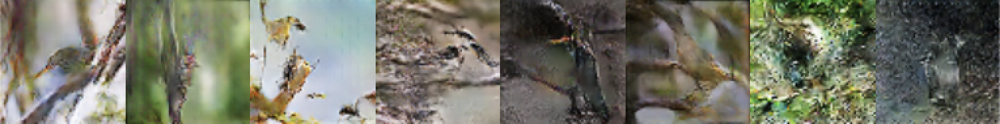

In [18]:
def combine_random_images_side_by_side(images, num_images=8):
    # Randomly select 8 images from the list
    selected_images = random.sample(images, num_images)

    # Get the dimensions of the first randomly selected image
    width, height = selected_images[0].size

    # Set the desired figure size
    fig_width = 10
    fig_height = 2

    # Create a new image with increased width to accommodate all 8 images
    combined_image = Image.new('RGB', (int(fig_width * width), int(fig_height * height)))

    # Paste each image side by side
    for i, img in enumerate(selected_images):
        combined_image.paste(img, (i * width, 0))

    return combined_image


combined_image = combine_random_images_side_by_side(img)
combined_image.show()


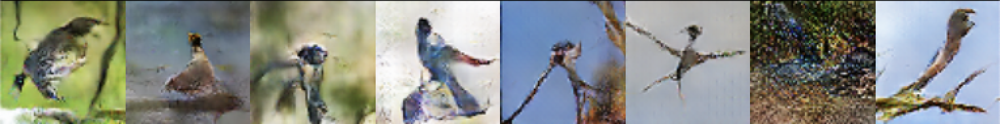

In [23]:
combined_image = combine_random_images_side_by_side(img)
combined_image.show()

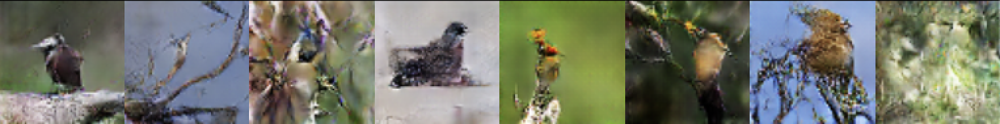

In [24]:
combined_image = combine_random_images_side_by_side(img)
combined_image.show()

## **Generate Images from Text**

In [26]:
# Function to generate an image from text using the trained GAN generator
def generate_image_from_text(generator_model, text_description, tokenizer, max_sequence_length):
    # Tokenize and preprocess the input text
    sequences = tokenizer.texts_to_sequences([text_description])
    padded_sequences = pad_sequences(sequences, maxlen=max_sequence_length, padding='post')

    # Generate an image from the processed text using the generator model
    generated_image = generator_model.predict(padded_sequences)
    generated_image = (generated_image * 255).astype(np.uint8)

    # Create a Pillow Image from the generated image array
    pil_image = Image.fromarray(generated_image[0])

    return pil_image

# Define a simple tokenizer and maximum sequence length
tokenizer = Tokenizer()
max_sequence_length = 100

This bird is completely red with black wings and pointy beak


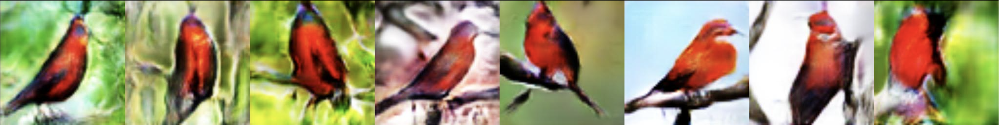

In [19]:
text_description = "This bird is completely red with black wings and pointy beak"

# Generate an image from text
generated_image = generate_image_from_text(build_stage2_generator, text_description)

# Set the desired figure size
fig_width = 10
fig_height = 2
print('This bird is completely red with black wings and pointy beak')
# Display image
generated_image.show(figsize=(fig_width, fig_height))

A small yellow bird with a black crown and a short black pointed beak


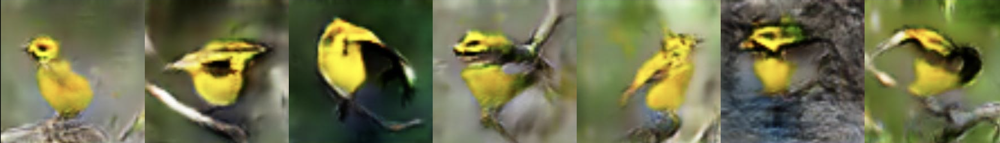

In [18]:
text_description = "A small yellow bird with a black crown and a short black pointed beak"

# Generate an image from text
generated_image = generate_image_from_text(build_stage2_generator, text_description)

# Set the desired figure size
fig_width = 10
fig_height = 2

# Display image
generated_image.show(figsize=(fig_width, fig_height))

This small bird has a white breast, wings and tail light grey head, and black


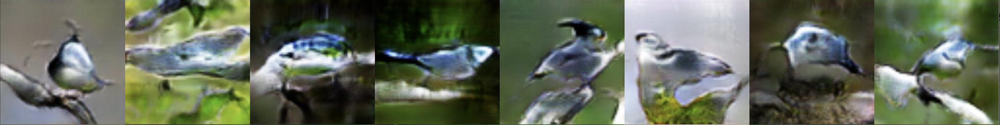

In [13]:
text_description = "This small bird has a white breast, wings and tail light grey head, and black"

# Generate an image from text
generated_image = generate_image_from_text(build_stage2_generator, text_description)

# Set the desired figure size
fig_width = 10
fig_height = 2
print(text_description)
# Display image
generated_image.show(figsize=(fig_width, fig_height))

This bird is white, black, and brown in color, with a brown beak


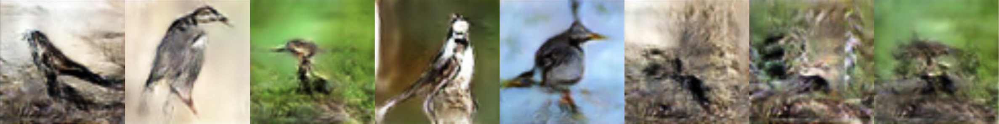

In [11]:
text_description = "This bird is white, black, and brown in color, with a brown beak"

# Generate an image from text
generated_image = generate_image_from_text(build_stage2_generator, text_description)

# Set the desired figure size
fig_width = 10
fig_height = 2
print(text_description)
# Display image
generated_image.show(figsize=(fig_width, fig_height))

A white bird with a black crown and yellow beak


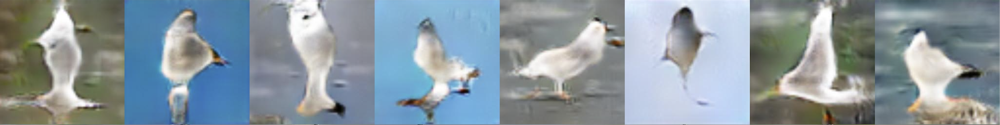

In [20]:
text_description = "A white bird with a black crown and yellow beak"

# Generate an image from text
generated_image = generate_image_from_text(build_stage2_generator, text_description)

# Set the desired figure size
fig_width = 10
fig_height = 2
print(text_description)
# Display image
generated_image.show(figsize=(fig_width, fig_height))